# Comprehensive Evaluation & Paper Results
## MRI Artifact Detection — All 6 Methods × 3 Anatomy Variants

**Methods**: Supervised (ResNet-18), SimCLR, MAE, DINO, DAE, PatchCore  
**Training variants**: knee-only, brain-only, combined  
**Test datasets**: MR-ART (brain, real), KMAR (knee, real), Simulated (noisy/motion/blurred)

### Paper Sections Covered
| Section | Title | Output |
|---------|-------|--------|
| 4.1 | Evaluation Setup | _(this notebook)_ |
| 4.2 | Overall Quantitative Results | Table 6 |
| 4.3 | Within-Anatomy Detection | Fig 5, bar chart |
| 4.4 | Cross-Anatomy Generalization | Table 7, Fig 6 |
| 4.5 | Multi-Anatomy Training Effect | Table 8, Fig 7 |
| 4.6 | Synthetic Artifact Evaluation | Table 9, Fig 8 |
| 4.7 | Severity Sensitivity (MR-ART) | Table 10, Fig 9 |
| 4.8 | Comparative Discussion | summary |

### Additional Analyses
- ROC curves (all methods overlaid)
- Precision-Recall curves
- Score distribution histograms
- Confusion matrices
- t-SNE feature visualizations
- Reconstruction visualizations (MAE, DAE)

In [1]:
import os, sys, gc, time, math, random, warnings
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision.models import resnet18, wide_resnet50_2, Wide_ResNet50_2_Weights
from torch.utils.data import Dataset, DataLoader
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import (roc_auc_score, average_precision_score, f1_score,
                             precision_recall_curve, roc_curve, confusion_matrix,
                             classification_report, precision_score, recall_score,
                             accuracy_score)
from sklearn.manifold import TSNE
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams.update({'font.size': 11, 'figure.dpi': 120})
import seaborn as sns
sns.set_style("whitegrid")
warnings.filterwarnings("ignore")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")
if device == "cuda":
    print(f"  GPU: {torch.cuda.get_device_name(0)}")
    print(f"  Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

Device: cuda
  GPU: Tesla T4
  Memory: 15.6 GB


## 1. Configuration & Data Paths

In [2]:
# ══════════════════════════════════════════════
# Paths — adjust for your environment
# ══════════════════════════════════════════════
ARTIFACT_DATA_ROOT = "/kaggle/input/datasets/kaustubhratna/mrartifact"
NOTEBOOK_ROOT      = "/kaggle/input/notebooks/kaustubhratna"

# Test manifest paths (from preprocessing notebook)
TEST_MANIFESTS = {
    "mrart":     os.path.join(ARTIFACT_DATA_ROOT, "supervised_manifests", "test_mrart.npz"),
    "kmar":      os.path.join(ARTIFACT_DATA_ROOT, "supervised_manifests", "test_kmar.npz"),
    "simulated": os.path.join(ARTIFACT_DATA_ROOT, "supervised_manifests", "test_simulated.npz"),
}

# Training manifests (needed for kNN reference distributions)
TRAIN_MANIFESTS = {
    "knee":     os.path.join(ARTIFACT_DATA_ROOT, "supervised_manifests", "supervised_train_knee.npz"),
    "brain":    os.path.join(ARTIFACT_DATA_ROOT, "supervised_manifests", "supervised_train_brain.npz"),
    "combined": os.path.join(ARTIFACT_DATA_ROOT, "supervised_manifests", "supervised_train_combined.npz"),
}

# ── Checkpoint directory mapping ──
# Each method's checkpoints live under its training notebook's output folder
METHOD_NOTEBOOK = {
    "sup":       "supervised-artifact-classifier",
    "simclr":    "simclr-new",
    "mae":       "vitmae-multianatomy",
    "dino":      "dino-multianatomy",
    "dae":       "dae-multianatomy",
    "patchcore": "patchcore",
}
METHODS = list(METHOD_NOTEBOOK.keys())
VARIANTS = ["knee", "brain", "combined"]

def ckpt_dir(method, variant):
    """Return the checkpoint directory for a given method and variant."""
    notebook = METHOD_NOTEBOOK[method]
    return os.path.join(NOTEBOOK_ROOT, notebook, "checkpoints", f"{method}_{variant}")

# Constants
IMG_SIZE = 192
BATCH_SIZE = 64
K_NEIGHBORS = 5          # kNN for SSL methods
PATCH_POOL_SIZE = 6       # PatchCore spatial pooling
CORESET_RATIO = 0.01      # PatchCore coreset
RECON_TRIALS = 10         # DAE/MAE reconstruction scoring

# Manifest prefix rewriting
MANIFEST_WRITE_PREFIX = "/kaggle/working/artifact_data/"

def remap_path(p, data_root):
    if p.startswith(MANIFEST_WRITE_PREFIX):
        return os.path.join(data_root, p[len(MANIFEST_WRITE_PREFIX):])
    return p

def load_manifest(npz_path, data_root=ARTIFACT_DATA_ROOT):
    data = np.load(npz_path, allow_pickle=True)
    paths = [remap_path(str(p), data_root) for p in data["paths"]]
    labels = np.asarray(data["labels"]).astype(np.int64)
    extra = {}
    if "artifact_types" in data:
        extra["artifact_types"] = data["artifact_types"]
    if "severity" in data:
        extra["severity"] = data["severity"]
    missing = [p for p in paths[:20] if not os.path.exists(p)]
    if missing:
        raise FileNotFoundError(f"{len(missing)} of first 20 paths missing. First: {missing[0]}")
    return np.array(paths), labels, extra

# ── Verify all paths ──
print("Configuration OK")
print("\n--- Test Manifests ---")
for name, path in TEST_MANIFESTS.items():
    exists = os.path.exists(path)
    print(f"  {name}: {'OK' if exists else 'MISSING'} — {path}")

print("\n--- Train Manifests ---")
for name, path in TRAIN_MANIFESTS.items():
    exists = os.path.exists(path)
    print(f"  {name}: {'OK' if exists else 'MISSING'} — {path}")

print("\n--- Checkpoints ---")
for method in METHODS:
    for variant in VARIANTS:
        d = ckpt_dir(method, variant)
        if method == "patchcore":
            target = os.path.join(d, "memory_bank.npy")
        else:
            target = os.path.join(d, "best.pt")
        exists = os.path.exists(target)
        print(f"  {method}_{variant}: {'OK' if exists else 'MISSING'} — {target}")

Configuration OK

--- Test Manifests ---
  mrart: OK — /kaggle/input/datasets/kaustubhratna/mrartifact/supervised_manifests/test_mrart.npz
  kmar: OK — /kaggle/input/datasets/kaustubhratna/mrartifact/supervised_manifests/test_kmar.npz
  simulated: OK — /kaggle/input/datasets/kaustubhratna/mrartifact/supervised_manifests/test_simulated.npz

--- Train Manifests ---
  knee: OK — /kaggle/input/datasets/kaustubhratna/mrartifact/supervised_manifests/supervised_train_knee.npz
  brain: OK — /kaggle/input/datasets/kaustubhratna/mrartifact/supervised_manifests/supervised_train_brain.npz
  combined: OK — /kaggle/input/datasets/kaustubhratna/mrartifact/supervised_manifests/supervised_train_combined.npz

--- Checkpoints ---
  sup_knee: OK — /kaggle/input/notebooks/kaustubhratna/supervised-artifact-classifier/checkpoints/sup_knee/best.pt
  sup_brain: OK — /kaggle/input/notebooks/kaustubhratna/supervised-artifact-classifier/checkpoints/sup_brain/best.pt
  sup_combined: OK — /kaggle/input/notebooks/ka

## 2. Dataset & DataLoader Utilities

In [3]:
class CleanTransform:
    def __call__(self, x):
        return torch.from_numpy(x).unsqueeze(0).float()

class CenterCropTransform:
    def __init__(self, size=192):
        self.size = size
    def __call__(self, x):
        h, w = x.shape
        if h < self.size or w < self.size:
            pad_h = max(0, self.size - h)
            pad_w = max(0, self.size - w)
            x = np.pad(x, ((pad_h//2, pad_h - pad_h//2),
                           (pad_w//2, pad_w - pad_w//2)), mode='reflect')
            h, w = x.shape
        y0 = (h - self.size) // 2
        x0 = (w - self.size) // 2
        x = x[y0:y0+self.size, x0:x0+self.size]
        return torch.from_numpy(x).unsqueeze(0).float()

class ManifestDataset(Dataset):
    def __init__(self, paths, labels, transform=None, name=""):
        self.paths = list(paths)
        self.labels = np.asarray(labels).astype(np.int64)
        self.transform = transform or CleanTransform()
        n1 = int((self.labels == 1).sum())
        n0 = int((self.labels == 0).sum())
        print(f"  [{name}] {len(self.paths)} slices | clean={n0} | artifact={n1}")

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = np.load(self.paths[idx]).astype(np.float32)
        return self.transform(img), int(self.labels[idx])


def make_loader(paths, labels, transform=None, name="", batch_size=BATCH_SIZE, shuffle=False):
    ds = ManifestDataset(paths, labels, transform=transform, name=name)
    return DataLoader(ds, batch_size=batch_size, shuffle=shuffle,
                      num_workers=0, pin_memory=True, drop_last=False)

print("Dataset utilities defined")

Dataset utilities defined


## 3. Load Test Data

In [4]:
# Load test manifests
test_data = {}
for name, path in TEST_MANIFESTS.items():
    paths, labels, extra = load_manifest(path)
    test_data[name] = {"paths": paths, "labels": labels, **extra}
    print(f"  {name}: {len(paths)} images, {int(labels.sum())} artifact, {int((labels==0).sum())} clean")

# Create test loaders (clean transform = no augmentation)
test_loaders = {}
for name in test_data:
    test_loaders[name] = make_loader(
        test_data[name]["paths"], test_data[name]["labels"],
        transform=CleanTransform(), name=f"test_{name}")

# Also create center-cropped loaders (for reconstruction scoring: DAE, MAE)
test_loaders_crop = {}
for name in test_data:
    test_loaders_crop[name] = make_loader(
        test_data[name]["paths"], test_data[name]["labels"],
        transform=CenterCropTransform(IMG_SIZE), name=f"test_{name}_crop")

print(f"\nTest data loaded: {list(test_data.keys())}")

  mrart: 9841 images, 6881 artifact, 2960 clean
  kmar: 9841 images, 6881 artifact, 2960 clean
  simulated: 3913 images, 3913 artifact, 0 clean
  [test_mrart] 9841 slices | clean=2960 | artifact=6881
  [test_kmar] 9841 slices | clean=2960 | artifact=6881
  [test_simulated] 3913 slices | clean=0 | artifact=3913
  [test_mrart_crop] 9841 slices | clean=2960 | artifact=6881
  [test_kmar_crop] 9841 slices | clean=2960 | artifact=6881
  [test_simulated_crop] 3913 slices | clean=0 | artifact=3913

Test data loaded: ['mrart', 'kmar', 'simulated']


In [5]:
# Load training manifests (for kNN reference — clean images only)
train_data = {}
train_loaders = {}
for variant, path in TRAIN_MANIFESTS.items():
    paths, labels, _ = load_manifest(path)
    # Use only clean images (label=0) as kNN reference for SSL methods
    clean_mask = labels == 0
    clean_paths = paths[clean_mask]
    clean_labels = labels[clean_mask]
    train_data[variant] = {"paths": clean_paths, "labels": clean_labels}
    train_loaders[variant] = make_loader(
        clean_paths, clean_labels,
        transform=CleanTransform(), name=f"train_{variant}_clean")

# Center-cropped train loaders (for DAE recon reference)
train_loaders_crop = {}
for variant in VARIANTS:
    train_loaders_crop[variant] = make_loader(
        train_data[variant]["paths"], train_data[variant]["labels"],
        transform=CenterCropTransform(IMG_SIZE), name=f"train_{variant}_crop")

print(f"\nTraining reference data loaded (clean only): {list(train_data.keys())}")

  [train_knee_clean] 12864 slices | clean=12864 | artifact=0
  [train_brain_clean] 12864 slices | clean=12864 | artifact=0
  [train_combined_clean] 25728 slices | clean=25728 | artifact=0
  [train_knee_crop] 12864 slices | clean=12864 | artifact=0
  [train_brain_crop] 12864 slices | clean=12864 | artifact=0
  [train_combined_crop] 25728 slices | clean=25728 | artifact=0

Training reference data loaded (clean only): ['knee', 'brain', 'combined']


## 4. Model Architecture Definitions
All 6 methods, copied verbatim from their respective training notebooks.

### 4.1 Supervised (ResNet-18)

In [6]:
def build_resnet18_binary(pretrained=False):
    weights = torchvision.models.ResNet18_Weights.DEFAULT if pretrained else None
    m = torchvision.models.resnet18(weights=weights)
    m.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
    nn.init.kaiming_normal_(m.conv1.weight, mode='fan_out', nonlinearity='relu')
    m.fc = nn.Linear(m.fc.in_features, 1)
    return m

print(f"Supervised: ResNet-18 -> {sum(p.numel() for p in build_resnet18_binary().parameters()):,} params")

Supervised: ResNet-18 -> 11,170,753 params


### 4.2 SimCLR (ResNet-18 Encoder)

In [7]:
class SimCLREncoder(nn.Module):
    """ResNet-18 encoder adapted for 1-channel grayscale MRI. Output 512-d."""
    def __init__(self):
        super().__init__()
        backbone = resnet18(weights=None)
        backbone.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.features = nn.Sequential(
            backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool,
            backbone.layer1, backbone.layer2, backbone.layer3, backbone.layer4,
            backbone.avgpool,
        )

    def forward(self, x):
        return self.features(x).flatten(1)  # (B, 512)


class SimCLRProjectionHead(nn.Module):
    def __init__(self, in_dim=512, hidden_dim=512, out_dim=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, out_dim),
        )

    def forward(self, x):
        return self.net(x)

print(f"SimCLR Encoder: {sum(p.numel() for p in SimCLREncoder().parameters()):,} params")

SimCLR Encoder: 11,170,240 params


### 4.3 MAE (ViT-Small/16)

In [8]:
class DropPath(nn.Module):
    def __init__(self, drop_prob=0.):
        super().__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        if not self.training or self.drop_prob == 0.:
            return x
        keep = 1 - self.drop_prob
        shape = (x.shape[0],) + (1,) * (x.ndim - 1)
        mask = torch.rand(shape, device=x.device) < keep
        return x / keep * mask


class Block(nn.Module):
    def __init__(self, dim, num_heads, mlp_ratio=4.0, drop_path=0.):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = nn.MultiheadAttention(dim, num_heads, batch_first=True)
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = nn.LayerNorm(dim)
        self.mlp = nn.Sequential(
            nn.Linear(dim, int(dim * mlp_ratio)),
            nn.GELU(),
            nn.Linear(int(dim * mlp_ratio), dim),
        )

    def forward(self, x):
        y = self.norm1(x)
        y, _ = self.attn(y, y, y, need_weights=False)
        x = x + self.drop_path(y)
        x = x + self.drop_path(self.mlp(self.norm2(x)))
        return x


class MAEViT(nn.Module):
    def __init__(self, img_size=192, patch_size=16, in_chans=1,
                 enc_dim=384, enc_depth=12, enc_heads=6,
                 dec_dim=192, dec_depth=4, dec_heads=3,
                 mlp_ratio=4.0, mask_ratio=0.75, drop_path_rate=0.1):
        super().__init__()
        self.patch_size = patch_size
        self.mask_ratio = mask_ratio
        self.num_patches = (img_size // patch_size) ** 2
        self.in_chans = in_chans

        # Encoder
        self.patch_embed = nn.Conv2d(in_chans, enc_dim, kernel_size=patch_size, stride=patch_size)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, enc_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches + 1, enc_dim))

        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, enc_depth)]
        self.encoder_blocks = nn.ModuleList([
            Block(enc_dim, enc_heads, mlp_ratio, drop_path=dpr[i])
            for i in range(enc_depth)
        ])
        self.encoder_norm = nn.LayerNorm(enc_dim)

        # Decoder
        self.decoder_embed = nn.Linear(enc_dim, dec_dim)
        self.mask_token = nn.Parameter(torch.zeros(1, 1, dec_dim))
        self.decoder_pos_embed = nn.Parameter(torch.zeros(1, self.num_patches + 1, dec_dim))

        self.decoder_blocks = nn.ModuleList([
            Block(dec_dim, dec_heads, mlp_ratio, drop_path=0.)
            for _ in range(dec_depth)
        ])
        self.decoder_norm = nn.LayerNorm(dec_dim)
        self.decoder_pred = nn.Linear(dec_dim, patch_size ** 2 * in_chans)
        self._init_weights()

    def _init_weights(self):
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        nn.init.trunc_normal_(self.decoder_pos_embed, std=0.02)
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.mask_token, std=0.02)
        self.apply(self._init_module_weights)

    @staticmethod
    def _init_module_weights(m):
        if isinstance(m, nn.Linear):
            nn.init.trunc_normal_(m.weight, std=0.02)
            if m.bias is not None: nn.init.zeros_(m.bias)
        elif isinstance(m, nn.LayerNorm):
            nn.init.ones_(m.weight); nn.init.zeros_(m.bias)

    def patchify(self, imgs):
        p = self.patch_size
        B, C, H, W = imgs.shape
        h, w = H // p, W // p
        x = imgs.reshape(B, C, h, p, w, p)
        return x.permute(0, 2, 4, 1, 3, 5).reshape(B, h * w, p * p * C)

    def unpatchify(self, x):
        p = self.patch_size
        h = w = int(x.shape[1] ** 0.5)
        C = self.in_chans
        x = x.reshape(-1, h, w, C, p, p)
        return x.permute(0, 3, 1, 4, 2, 5).reshape(-1, C, h * p, w * p)

    def random_masking(self, x, mask_ratio):
        B, N, D = x.shape
        len_keep = int(N * (1 - mask_ratio))
        noise = torch.rand(B, N, device=x.device)
        ids_shuffle = torch.argsort(noise, dim=1)
        ids_restore = torch.argsort(ids_shuffle, dim=1)
        ids_keep = ids_shuffle[:, :len_keep]
        x_visible = torch.gather(x, 1, ids_keep.unsqueeze(-1).expand(-1, -1, D))
        mask = torch.ones(B, N, device=x.device)
        mask[:, :len_keep] = 0
        mask = torch.gather(mask, 1, ids_restore)
        return x_visible, mask, ids_restore

    def forward_encoder(self, x, mask_ratio=None):
        if mask_ratio is None: mask_ratio = self.mask_ratio
        x = self.patch_embed(x).flatten(2).transpose(1, 2)
        x = x + self.pos_embed[:, 1:, :]
        if mask_ratio > 0:
            x, mask, ids_restore = self.random_masking(x, mask_ratio)
        else:
            B, N, _ = x.shape
            mask = torch.zeros(B, N, device=x.device)
            ids_restore = torch.arange(N, device=x.device).unsqueeze(0).expand(B, -1)
        cls = (self.cls_token + self.pos_embed[:, :1, :]).expand(x.shape[0], -1, -1)
        x = torch.cat([cls, x], dim=1)
        for blk in self.encoder_blocks: x = blk(x)
        x = self.encoder_norm(x)
        return x, mask, ids_restore

    def forward_decoder(self, x, ids_restore):
        x = self.decoder_embed(x)
        mask_tokens = self.mask_token.repeat(x.shape[0], ids_restore.shape[1] + 1 - x.shape[1], 1)
        x_ = torch.cat([x[:, 1:, :], mask_tokens], dim=1)
        x_ = torch.gather(x_, 1, ids_restore.unsqueeze(-1).expand(-1, -1, x_.shape[2]))
        x = torch.cat([x[:, :1, :], x_], dim=1)
        x = x + self.decoder_pos_embed
        for blk in self.decoder_blocks: x = blk(x)
        x = self.decoder_norm(x)
        x = self.decoder_pred(x)
        return x[:, 1:, :]

    def forward(self, imgs, mask_ratio=None):
        latent, mask, ids_restore = self.forward_encoder(imgs, mask_ratio)
        pred = self.forward_decoder(latent, ids_restore)
        target = self.patchify(imgs)
        mean = target.mean(dim=-1, keepdim=True)
        var = target.var(dim=-1, keepdim=True)
        target_norm = (target - mean) / (var + 1e-6).sqrt()
        loss = (pred - target_norm) ** 2
        loss = loss.mean(dim=-1)
        loss_per_img = (loss * mask).sum(dim=1) / mask.sum(dim=1).clamp(min=1)
        loss_batch = (loss * mask).sum() / mask.sum().clamp(min=1)
        return loss_batch, loss_per_img, pred, mask

    @torch.no_grad()
    def extract_features(self, imgs):
        latent, _, _ = self.forward_encoder(imgs, mask_ratio=0)
        return latent[:, 1:, :].mean(dim=1)

    @torch.no_grad()
    def reconstruct_for_viz(self, imgs, mask_ratio=None):
        latent, mask, ids_restore = self.forward_encoder(imgs, mask_ratio)
        pred = self.forward_decoder(latent, ids_restore)
        target = self.patchify(imgs)
        mean = target.mean(dim=-1, keepdim=True)
        var = target.var(dim=-1, keepdim=True)
        pred_pixels = pred * (var + 1e-6).sqrt() + mean
        mask_2d = mask.unsqueeze(-1).expand_as(target)
        visible = target * (1 - mask_2d)
        recon = target * (1 - mask_2d) + pred_pixels * mask_2d
        return self.unpatchify(visible), self.unpatchify(recon), mask

print(f"MAE ViT: {sum(p.numel() for p in MAEViT().parameters()):,} params")

MAE ViT: 23,380,288 params


### 4.4 DINO (ViT-Small/16)

In [9]:
class ViTSmall(nn.Module):
    """ViT-Small/16 backbone for DINO."""
    def __init__(self, img_size=192, patch_size=16, in_chans=1,
                 embed_dim=384, depth=12, num_heads=6,
                 mlp_ratio=4.0, drop_path_rate=0.1):
        super().__init__()
        self.patch_size = patch_size
        self.embed_dim = embed_dim
        self.num_patches = (img_size // patch_size) ** 2

        self.patch_embed = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches + 1, embed_dim))

        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, depth)]
        self.blocks = nn.ModuleList([
            Block(embed_dim, num_heads, mlp_ratio, drop_path=dpr[i])
            for i in range(depth)
        ])
        self.norm = nn.LayerNorm(embed_dim)
        self._init_weights()

    def _init_weights(self):
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        self.apply(self._init_module)

    @staticmethod
    def _init_module(m):
        if isinstance(m, nn.Linear):
            nn.init.trunc_normal_(m.weight, std=0.02)
            if m.bias is not None: nn.init.zeros_(m.bias)
        elif isinstance(m, nn.LayerNorm):
            nn.init.ones_(m.weight); nn.init.zeros_(m.bias)

    def interpolate_pos_embed(self, x, h, w):
        N = x.shape[1] - 1
        if N == self.num_patches:
            return self.pos_embed
        cls_pe = self.pos_embed[:, :1, :]
        patch_pe = self.pos_embed[:, 1:, :]
        dim = patch_pe.shape[-1]
        h0 = int(self.num_patches ** 0.5)
        patch_pe = patch_pe.reshape(1, h0, h0, dim).permute(0, 3, 1, 2)
        patch_pe = F.interpolate(patch_pe, size=(h, w), mode='bicubic', align_corners=False)
        patch_pe = patch_pe.permute(0, 2, 3, 1).reshape(1, -1, dim)
        return torch.cat([cls_pe, patch_pe], dim=1)

    def forward(self, x):
        B, C, H, W = x.shape
        x = self.patch_embed(x).flatten(2).transpose(1, 2)
        h, w = H // self.patch_size, W // self.patch_size
        cls = self.cls_token.expand(B, -1, -1)
        x = torch.cat([cls, x], dim=1)
        x = x + self.interpolate_pos_embed(x, h, w)
        for blk in self.blocks: x = blk(x)
        x = self.norm(x)
        return x[:, 0]


class DINOHead(nn.Module):
    def __init__(self, in_dim, hidden_dim=2048, bottleneck_dim=256,
                 out_dim=65536, nlayers=3):
        super().__init__()
        layers = []
        for i in range(nlayers - 1):
            d_in = in_dim if i == 0 else hidden_dim
            layers.extend([nn.Linear(d_in, hidden_dim), nn.GELU()])
        layers.append(nn.Linear(hidden_dim, bottleneck_dim))
        self.mlp = nn.Sequential(*layers)
        self.last_layer = nn.utils.weight_norm(nn.Linear(bottleneck_dim, out_dim, bias=False))
        self.last_layer.weight_g.data.fill_(1)

    def forward(self, x):
        x = self.mlp(x)
        x = F.normalize(x, dim=-1)
        return self.last_layer(x)


class DINOModel(nn.Module):
    def __init__(self, backbone, head):
        super().__init__()
        self.backbone = backbone
        self.head = head

    def forward(self, x):
        return self.head(self.backbone(x))

    def extract_features(self, x):
        return self.backbone(x)

# DINO config
DINO_ENC_DIM = 384; DINO_ENC_DEPTH = 12; DINO_ENC_HEADS = 6
DINO_HEAD_HIDDEN = 2048; DINO_HEAD_BOTTLENECK = 256
DINO_HEAD_OUT_DIM = 65536; DINO_HEAD_NLAYERS = 3
DINO_DROP_PATH = 0.1; DINO_MLP_RATIO = 4.0

_bb = ViTSmall(IMG_SIZE, 16, 1, DINO_ENC_DIM, DINO_ENC_DEPTH, DINO_ENC_HEADS, DINO_MLP_RATIO, DINO_DROP_PATH)
_hd = DINOHead(DINO_ENC_DIM, DINO_HEAD_HIDDEN, DINO_HEAD_BOTTLENECK, DINO_HEAD_OUT_DIM, DINO_HEAD_NLAYERS)
print(f"DINO Teacher: {sum(p.numel() for p in _bb.parameters()) + sum(p.numel() for p in _hd.parameters()):,} params")
del _bb, _hd

DINO Teacher: 43,801,216 params


### 4.5 DAE (Denoising Autoencoder)

In [10]:
def enc_block(in_c, out_c):
    return nn.Sequential(
        nn.Conv2d(in_c, out_c, 3, 1, 1), nn.BatchNorm2d(out_c), nn.LeakyReLU(0.2, True),
        nn.Conv2d(out_c, out_c, 3, 1, 1), nn.BatchNorm2d(out_c), nn.LeakyReLU(0.2, True),
        nn.MaxPool2d(2),
    )

def dec_block(in_c, out_c):
    return nn.Sequential(
        nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
        nn.Conv2d(in_c, out_c, 3, 1, 1), nn.BatchNorm2d(out_c), nn.ReLU(True),
        nn.Conv2d(out_c, out_c, 3, 1, 1), nn.BatchNorm2d(out_c), nn.ReLU(True),
    )

class DAEEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.block1 = enc_block(1, 64)
        self.block2 = enc_block(64, 128)
        self.block3 = enc_block(128, 256)
        self.block4 = enc_block(256, 512)
        self.pool = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        return x

    def get_features(self, x):
        return self.pool(self.forward(x)).flatten(1)  # (B, 512)


class DAEDecoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.block1 = dec_block(512, 256)
        self.block2 = dec_block(256, 128)
        self.block3 = dec_block(128, 64)
        self.block4 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(64, 32, 3, 1, 1), nn.BatchNorm2d(32), nn.ReLU(True),
            nn.Conv2d(32, 1, 3, 1, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        return x


class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = DAEEncoder()
        self.decoder = DAEDecoder()

    def forward(self, noisy):
        latent = self.encoder(noisy)
        recon = self.decoder(latent)
        return recon

# DAE noise corruption (for reconstruction scoring)
NOISE_STD_LO = 0.05; NOISE_STD_HI = 0.25
MASK_PROB = 0.5; MASK_MAX_RATIO = 0.20
SP_PROB = 0.3; SP_AMOUNT = 0.02

def add_gaussian_noise(img, std_lo=NOISE_STD_LO, std_hi=NOISE_STD_HI):
    sigma = random.uniform(std_lo, std_hi)
    return img + sigma * np.random.randn(*img.shape).astype(np.float32)

def add_rect_mask(img, max_ratio=MASK_MAX_RATIO, num_masks=None):
    h, w = img.shape
    img = img.copy()
    n = num_masks or random.randint(1, 3)
    for _ in range(n):
        mh = int(h * random.uniform(0.05, max_ratio))
        mw = int(w * random.uniform(0.05, max_ratio))
        y = random.randint(0, h - mh)
        x = random.randint(0, w - mw)
        img[y:y+mh, x:x+mw] = 0.0
    return img

def add_salt_pepper(img, amount=SP_AMOUNT):
    img = img.copy()
    n_pixels = img.size
    n_salt = int(n_pixels * amount / 2)
    n_pepper = int(n_pixels * amount / 2)
    coords = [np.random.randint(0, d, n_salt) for d in img.shape]
    img[coords[0], coords[1]] = 1.0
    coords = [np.random.randint(0, d, n_pepper) for d in img.shape]
    img[coords[0], coords[1]] = 0.0
    return img

def corrupt_image(img):
    noisy = add_gaussian_noise(img)
    if random.random() < MASK_PROB: noisy = add_rect_mask(noisy)
    if random.random() < SP_PROB: noisy = add_salt_pepper(noisy)
    return np.clip(noisy, 0.0, 1.0).astype(np.float32)

def corrupt_tensor(img_tensor):
    img_np = img_tensor.squeeze(0).cpu().numpy()
    noisy_np = corrupt_image(img_np)
    return torch.from_numpy(noisy_np).unsqueeze(0)

print(f"DAE: {sum(p.numel() for p in DenoisingAutoencoder().parameters()):,} params")

DAE: 7,032,001 params


### 4.6 PatchCore (WideResNet-50-2)

In [11]:
class PatchCoreExtractor(nn.Module):
    """Wide ResNet-50-2 feature extractor for PatchCore."""
    def __init__(self):
        super().__init__()
        backbone = wide_resnet50_2(weights=Wide_ResNet50_2_Weights.IMAGENET1K_V1)
        self.layer0 = nn.Sequential(backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool)
        self.layer1 = backbone.layer1
        self.layer2 = backbone.layer2
        self.layer3 = backbone.layer3
        self.layer4 = backbone.layer4
        self.avgpool = backbone.avgpool
        for p in self.parameters(): p.requires_grad = False
        self.patch_dim = 512 + 1024  # 1536
        self.global_dim = 2048

    def forward(self, x, pool_size=None):
        x = x.repeat(1, 3, 1, 1)
        mean = torch.tensor([0.485, 0.456, 0.406], device=x.device).view(1, 3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225], device=x.device).view(1, 3, 1, 1)
        x = (x - mean) / std
        x = self.layer0(x)
        x = self.layer1(x)
        f2 = self.layer2(x)
        f3 = self.layer3(f2)
        f4 = self.layer4(f3)
        global_feat = self.avgpool(f4).flatten(1)
        target_h, target_w = f2.shape[2], f2.shape[3]
        f3_up = F.interpolate(f3, size=(target_h, target_w), mode='bilinear', align_corners=False)
        patch_feat = torch.cat([f2, f3_up], dim=1)
        if pool_size is not None:
            patch_feat = F.adaptive_avg_pool2d(patch_feat, (pool_size, pool_size))
        B, D, H, W = patch_feat.shape
        patch_feat = patch_feat.permute(0, 2, 3, 1).reshape(B, H * W, D)
        return patch_feat, global_feat

print(f"PatchCore: WideResNet-50-2 (frozen), "
      f"{sum(p.numel() for p in PatchCoreExtractor().parameters()):,} params")

Downloading: "https://download.pytorch.org/models/wide_resnet50_2-95faca4d.pth" to /root/.cache/torch/hub/checkpoints/wide_resnet50_2-95faca4d.pth


100%|██████████| 132M/132M [00:00<00:00, 217MB/s] 


PatchCore: WideResNet-50-2 (frozen), 66,834,240 params


## 5. Unified Scoring Functions

In [12]:
def clear_gpu():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()

# ── Supervised scoring ──
@torch.no_grad()
def score_supervised(model, loader):
    model.eval()
    probs, labels = [], []
    for imgs, y in tqdm(loader, desc="Supervised scoring"):
        imgs = imgs.to(device)
        with torch.amp.autocast("cuda", enabled=(device == "cuda")):
            logits = model(imgs).squeeze(1)
        probs.append(torch.sigmoid(logits).cpu().numpy())
        labels.append(y.numpy())
    return np.concatenate(probs), np.concatenate(labels)

# ── kNN scoring (SimCLR, MAE, DINO, DAE) ──
@torch.no_grad()
def extract_features_generic(model, loader, method="simclr"):
    """Extract L2-normalized features from any SSL encoder."""
    model.eval()
    feats, labels = [], []
    for imgs, y in tqdm(loader, desc=f"Extracting {method} features"):
        imgs = imgs.to(device)
        with torch.amp.autocast("cuda", enabled=(device == "cuda")):
            if method == "simclr":
                f = model(imgs).float()
            elif method == "mae":
                f = model.extract_features(imgs).float()
            elif method == "dino":
                f = model.extract_features(imgs).float()
            elif method == "dae":
                f = model.encoder.get_features(imgs).float()
            else:
                raise ValueError(f"Unknown method: {method}")
        f = F.normalize(f, dim=1)
        feats.append(f.cpu().numpy())
        labels.append(y.numpy())
    return np.concatenate(feats), np.concatenate(labels)


def score_knn(train_feats, test_feats, k=K_NEIGHBORS, metric="cosine"):
    nn_model = NearestNeighbors(n_neighbors=k, metric=metric)
    nn_model.fit(train_feats)
    dists, _ = nn_model.kneighbors(test_feats)
    return dists.mean(axis=1)  # anomaly score = mean kNN distance

# ── MAE reconstruction scoring ──
@torch.no_grad()
def score_mae_recon(model, loader, num_trials=RECON_TRIALS):
    model.eval()
    all_scores = []
    for imgs, _ in tqdm(loader, desc="MAE recon scoring"):
        imgs = imgs.to(device)
        batch_scores = torch.zeros(imgs.shape[0], device=device)
        for _ in range(num_trials):
            with torch.amp.autocast("cuda", enabled=(device == "cuda")):
                loss_batch, loss_per_img, _, _ = model(imgs)
            batch_scores += loss_per_img.float()
        batch_scores /= num_trials
        all_scores.append(batch_scores.cpu().numpy())
    return np.concatenate(all_scores)

# ── DAE reconstruction scoring ──
@torch.no_grad()
def score_dae_recon(model, loader, num_trials=RECON_TRIALS):
    model.eval()
    all_scores = []
    for clean_imgs, _ in tqdm(loader, desc="DAE recon scoring"):
        clean_imgs = clean_imgs.to(device)
        batch_scores = torch.zeros(clean_imgs.shape[0], device=device)
        for _ in range(num_trials):
            noisy_batch = torch.stack([corrupt_tensor(img) for img in clean_imgs.cpu()]).to(device)
            with torch.amp.autocast("cuda", enabled=(device == "cuda")):
                recon = model(noisy_batch)
            per_img_mse = ((recon.float() - clean_imgs.float()) ** 2).mean(dim=[1, 2, 3])
            batch_scores += per_img_mse
        batch_scores /= num_trials
        all_scores.append(batch_scores.cpu().numpy())
    return np.concatenate(all_scores)

# ── PatchCore scoring ──
@torch.no_grad()
def score_patchcore(extractor, loader, memory_bank, pool_size=PATCH_POOL_SIZE, k=1):
    extractor.eval()
    nn_model = NearestNeighbors(n_neighbors=k, metric="euclidean", algorithm="auto")
    nn_model.fit(memory_bank)
    all_scores = []
    for imgs, _ in tqdm(loader, desc="PatchCore scoring"):
        imgs = imgs.to(device)
        pf, _ = extractor(imgs, pool_size=pool_size)
        pf = pf.float().cpu().numpy()
        B, P, D = pf.shape
        pf_flat = pf.reshape(B * P, D)
        dists, _ = nn_model.kneighbors(pf_flat)
        patch_dists = dists[:, 0].reshape(B, P)
        image_scores = patch_dists.max(axis=1)
        all_scores.append(image_scores)
    return np.concatenate(all_scores)

@torch.no_grad()
def extract_patchcore_global(extractor, loader):
    extractor.eval()
    feats, labels = [], []
    for imgs, y in tqdm(loader, desc="PatchCore global features"):
        imgs = imgs.to(device)
        _, gf = extractor(imgs, pool_size=None)
        gf = F.normalize(gf.float(), dim=1)
        feats.append(gf.cpu().numpy())
        labels.append(y.numpy())
    return np.concatenate(feats), np.concatenate(labels)


# ── Metrics computation ──
def compute_metrics(scores, labels, threshold=None):
    """Compute AUROC, AUPRC, and threshold-dependent metrics.
    For single-class test sets: AUROC/AUPRC are nan, but if a threshold is
    provided (from another test set), we compute detection rate and mean score.
    """
    result = {}
    n_classes = len(np.unique(labels))

    if n_classes < 2:
        which = "artifact-only" if labels.mean() > 0.5 else "clean-only"
        result["auroc"] = float("nan")
        result["auprc"] = float("nan")

        if threshold is not None and not np.isnan(threshold):
            # Use borrowed threshold to compute detection rate
            preds = (scores >= threshold).astype(int)
            detection_rate = preds.mean()  # fraction flagged as artifact
            result["f1"] = float("nan")  # undefined without both classes
            result["precision"] = float("nan")
            result["recall"] = detection_rate  # = detection rate for artifact-only
            result["accuracy"] = detection_rate
            result["threshold"] = float(threshold)
            result["detection_rate"] = float(detection_rate)
            result["mean_score"] = float(scores.mean())
            result["std_score"] = float(scores.std())
            print(f"    ℹ️  Single-class ({which}, n={len(labels)}) — "
                  f"detection rate={detection_rate:.3f} at thresh={threshold:.4f}, "
                  f"mean_score={scores.mean():.4f}")
        else:
            result["f1"] = float("nan")
            result["precision"] = float("nan")
            result["recall"] = float("nan")
            result["accuracy"] = float("nan")
            result["threshold"] = float("nan")
            result["detection_rate"] = float("nan")
            result["mean_score"] = float(scores.mean())
            result["std_score"] = float(scores.std())
            print(f"    ⚠️  Single-class ({which}, n={len(labels)}) — "
                  f"AUROC undefined, mean_score={scores.mean():.4f}")
        return result

    result["auroc"] = roc_auc_score(labels, scores)
    result["auprc"] = average_precision_score(labels, scores)

    if threshold is None:
        # Use Youden's J to find optimal threshold
        fpr, tpr, thresholds = roc_curve(labels, scores)
        j_scores = tpr - fpr
        best_idx = np.argmax(j_scores)
        threshold = thresholds[best_idx]
        # roc_curve can return max(scores)+1 as the first threshold — clip
        threshold = np.clip(threshold, scores.min(), scores.max())

    preds = (scores >= threshold).astype(int)
    result["f1"] = f1_score(labels, preds, zero_division=0)
    result["precision"] = precision_score(labels, preds, zero_division=0)
    result["recall"] = recall_score(labels, preds, zero_division=0)
    result["accuracy"] = accuracy_score(labels, preds)
    result["threshold"] = float(threshold)
    result["detection_rate"] = float("nan")  # not applicable for two-class
    result["mean_score"] = float(scores.mean())
    result["std_score"] = float(scores.std())
    return result

print("Scoring functions defined")

Scoring functions defined


## 6. Model Loading & Evaluation Pipeline

In [13]:
def load_supervised(variant):
    model = build_resnet18_binary().to(device)
    ckpt = torch.load(os.path.join(ckpt_dir("sup", variant), "best.pt"),
                      map_location=device, weights_only=False)
    model.load_state_dict(ckpt["model"])
    model.eval()
    return model

def load_simclr(variant):
    encoder = SimCLREncoder().to(device)
    ckpt = torch.load(os.path.join(ckpt_dir("simclr", variant), "best.pt"),
                      map_location=device, weights_only=False)
    encoder.load_state_dict(ckpt["encoder"])
    encoder.eval()
    return encoder

def load_mae(variant):
    model = MAEViT(IMG_SIZE, 16, 1, 384, 12, 6, 192, 4, 3, 4.0, 0.75, 0.1).to(device)
    ckpt = torch.load(os.path.join(ckpt_dir("mae", variant), "best.pt"),
                      map_location=device, weights_only=False)
    model.load_state_dict(ckpt["model"])
    model.eval()
    return model

def load_dino(variant):
    backbone = ViTSmall(IMG_SIZE, 16, 1, DINO_ENC_DIM, DINO_ENC_DEPTH, DINO_ENC_HEADS,
                        DINO_MLP_RATIO, DINO_DROP_PATH)
    head = DINOHead(DINO_ENC_DIM, DINO_HEAD_HIDDEN, DINO_HEAD_BOTTLENECK,
                    DINO_HEAD_OUT_DIM, DINO_HEAD_NLAYERS)
    teacher = DINOModel(backbone, head).to(device)
    ckpt = torch.load(os.path.join(ckpt_dir("dino", variant), "best.pt"),
                      map_location=device, weights_only=False)
    teacher.load_state_dict(ckpt["teacher"])
    teacher.eval()
    return teacher

def load_dae(variant):
    model = DenoisingAutoencoder().to(device)
    ckpt = torch.load(os.path.join(ckpt_dir("dae", variant), "best.pt"),
                      map_location=device, weights_only=False)
    model.load_state_dict(ckpt["model"])
    model.eval()
    return model

def load_patchcore(variant):
    extractor = PatchCoreExtractor().to(device)
    extractor.eval()
    memory_bank = np.load(os.path.join(ckpt_dir("patchcore", variant), "memory_bank.npy"))
    return extractor, memory_bank

print("Model loading functions defined")

Model loading functions defined


## 7. Run All Evaluations (18 models × 3 test sets = 54 evaluations)
For each method × variant:
1. Load model/checkpoint
2. Score all 3 test sets
3. Save results
4. Free GPU memory

SSL methods use **two scoring modes**: kNN-based and reconstruction-based (where applicable).

In [14]:
# Results storage
# all_results[method][variant][test_set] = {"scores": ..., "labels": ..., "metrics": ...}
all_results = {}
all_features = {}  # Store features for t-SNE later

total_start = time.time()

def evaluate_one(method, variant, test_name, scores, labels, borrowed_threshold=None):
    """Evaluate scores against labels.
    For two-class test sets (mrart, kmar): computes AUROC, optimal threshold, etc.
    For single-class test sets (simulated): uses borrowed_threshold from mrart
    to compute detection rate.
    """
    metrics = compute_metrics(scores, labels, threshold=borrowed_threshold)
    auroc_str = f"{metrics['auroc']:.4f}" if not np.isnan(metrics['auroc']) else "N/A"
    auprc_str = f"{metrics['auprc']:.4f}" if not np.isnan(metrics['auprc']) else "N/A"
    f1_str = f"{metrics['f1']:.3f}" if not np.isnan(metrics['f1']) else "N/A"
    thresh_str = f"{metrics['threshold']:.4f}" if not np.isnan(metrics['threshold']) else "N/A"
    det_str = ""
    if not np.isnan(metrics.get('detection_rate', float('nan'))):
        det_str = f" det_rate={metrics['detection_rate']:.3f}"
    print(f"    {test_name}: AUROC={auroc_str} AUPRC={auprc_str} F1={f1_str} (thresh={thresh_str}){det_str}")
    return {"scores": scores, "labels": labels, "metrics": metrics}

In [15]:
# ══════════════════════════════════════════════
# 7.1 SUPERVISED
# ══════════════════════════════════════════════
print("\n" + "="*70)
print("  SUPERVISED EVALUATION")
print("="*70)

all_results["sup"] = {}
for variant in VARIANTS:
    print(f"\n--- sup_{variant} ---")
    model = load_supervised(variant)
    all_results["sup"][variant] = {}

    # First evaluate two-class test sets to get thresholds
    for test_name in ["mrart", "kmar"]:
        scores, labels = score_supervised(model, test_loaders[test_name])
        all_results["sup"][variant][test_name] = evaluate_one("sup", variant, test_name, scores, labels)

    # Simulated: borrow threshold from mrart
    mrart_thresh = all_results["sup"][variant]["mrart"]["metrics"]["threshold"]
    scores, labels = score_supervised(model, test_loaders["simulated"])
    all_results["sup"][variant]["simulated"] = evaluate_one(
        "sup", variant, "simulated", scores, labels, borrowed_threshold=mrart_thresh)

    del model; clear_gpu()
print(f"\nSupervised done ({(time.time()-total_start)/60:.1f} min)")


  SUPERVISED EVALUATION

--- sup_knee ---


Supervised scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4998 AUPRC=0.6991 F1=0.823 (thresh=1.0000)


Supervised scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5026 AUPRC=0.7003 F1=0.817 (thresh=1.0000)


Supervised scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.837 at thresh=1.0000, mean_score=0.9897
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=1.0000) det_rate=0.837

--- sup_brain ---


Supervised scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.5054 AUPRC=0.7015 F1=0.824 (thresh=1.0000)


Supervised scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4978 AUPRC=0.6993 F1=0.394 (thresh=0.0046)


Supervised scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.120 at thresh=1.0000, mean_score=0.3928
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=1.0000) det_rate=0.120

--- sup_combined ---


Supervised scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.5010 AUPRC=0.6996 F1=0.823 (thresh=1.0000)


Supervised scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5029 AUPRC=0.7004 F1=0.809 (thresh=0.9995)


Supervised scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.091 at thresh=1.0000, mean_score=0.3301
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=1.0000) det_rate=0.091

Supervised done (5.4 min)


In [16]:
# ══════════════════════════════════════════════
# 7.2 SimCLR
# ══════════════════════════════════════════════
print("\n" + "="*70)
print("  SimCLR EVALUATION")
print("="*70)

all_results["simclr"] = {}
for variant in VARIANTS:
    print(f"\n--- simclr_{variant} ---")
    encoder = load_simclr(variant)
    all_results["simclr"][variant] = {}

    # Extract train features (kNN reference)
    train_feats, _ = extract_features_generic(encoder, train_loaders[variant], method="simclr")

    # Two-class test sets first
    for test_name in ["mrart", "kmar"]:
        test_feats, test_labels = extract_features_generic(encoder, test_loaders[test_name], method="simclr")
        scores = score_knn(train_feats, test_feats)
        all_results["simclr"][variant][test_name] = evaluate_one(
            "simclr", variant, test_name, scores, test_labels)
        if variant == "combined":
            all_features[f"simclr_{test_name}"] = {"train": train_feats, "test": test_feats, "labels": test_labels}

    # Simulated: borrow threshold from mrart
    mrart_thresh = all_results["simclr"][variant]["mrart"]["metrics"]["threshold"]
    test_feats, test_labels = extract_features_generic(encoder, test_loaders["simulated"], method="simclr")
    scores = score_knn(train_feats, test_feats)
    all_results["simclr"][variant]["simulated"] = evaluate_one(
        "simclr", variant, "simulated", scores, test_labels, borrowed_threshold=mrart_thresh)
    if variant == "combined":
        all_features["simclr_simulated"] = {"train": train_feats, "test": test_feats, "labels": test_labels}

    del encoder, train_feats; clear_gpu()
print(f"\nSimCLR done ({(time.time()-total_start)/60:.1f} min)")


  SimCLR EVALUATION

--- simclr_knee ---


Extracting simclr features:   0%|          | 0/201 [00:00<?, ?it/s]

Extracting simclr features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4813 AUPRC=0.6812 F1=0.002 (thresh=0.1835)


Extracting simclr features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4783 AUPRC=0.6940 F1=0.125 (thresh=0.1816)


Extracting simclr features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.027 at thresh=0.1835, mean_score=0.0925
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.1835) det_rate=0.027

--- simclr_brain ---


Extracting simclr features:   0%|          | 0/201 [00:00<?, ?it/s]

Extracting simclr features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.5691 AUPRC=0.7502 F1=0.557 (thresh=0.1089)


Extracting simclr features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5020 AUPRC=0.6984 F1=0.750 (thresh=0.0611)


Extracting simclr features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.172 at thresh=0.1089, mean_score=0.0708
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.1089) det_rate=0.172

--- simclr_combined ---


Extracting simclr features:   0%|          | 0/402 [00:00<?, ?it/s]

Extracting simclr features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.5361 AUPRC=0.7146 F1=0.764 (thresh=0.0629)


Extracting simclr features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4870 AUPRC=0.6901 F1=0.807 (thresh=0.0459)


Extracting simclr features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.805 at thresh=0.0629, mean_score=0.1224
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0629) det_rate=0.805

SimCLR done (12.4 min)


In [17]:
# ══════════════════════════════════════════════
# 7.3 MAE
# ══════════════════════════════════════════════
print("\n" + "="*70)
print("  MAE EVALUATION")
print("="*70)

all_results["mae"] = {}
all_results["mae_recon"] = {}

for variant in VARIANTS:
    print(f"\n--- mae_{variant} ---")
    model = load_mae(variant)
    all_results["mae"][variant] = {}
    all_results["mae_recon"][variant] = {}

    # kNN-based: two-class first
    train_feats, _ = extract_features_generic(model, train_loaders[variant], method="mae")

    for test_name in ["mrart", "kmar"]:
        test_feats, test_labels = extract_features_generic(model, test_loaders[test_name], method="mae")
        scores = score_knn(train_feats, test_feats)
        all_results["mae"][variant][test_name] = evaluate_one(
            "mae_knn", variant, test_name, scores, test_labels)

    # kNN simulated: borrow threshold from mrart
    mrart_thresh_knn = all_results["mae"][variant]["mrart"]["metrics"]["threshold"]
    test_feats, test_labels = extract_features_generic(model, test_loaders["simulated"], method="mae")
    scores = score_knn(train_feats, test_feats)
    all_results["mae"][variant]["simulated"] = evaluate_one(
        "mae_knn", variant, "simulated", scores, test_labels, borrowed_threshold=mrart_thresh_knn)

    # Reconstruction-based: two-class first
    for test_name in ["mrart", "kmar"]:
        recon_scores = score_mae_recon(model, test_loaders_crop[test_name])
        test_labels = test_data[test_name]["labels"]
        all_results["mae_recon"][variant][test_name] = evaluate_one(
            "mae_recon", variant, test_name, recon_scores, test_labels)

    # Recon simulated: borrow threshold from mrart
    mrart_thresh_recon = all_results["mae_recon"][variant]["mrart"]["metrics"]["threshold"]
    recon_scores = score_mae_recon(model, test_loaders_crop["simulated"])
    test_labels = test_data["simulated"]["labels"]
    all_results["mae_recon"][variant]["simulated"] = evaluate_one(
        "mae_recon", variant, "simulated", recon_scores, test_labels, borrowed_threshold=mrart_thresh_recon)

    del model, train_feats; clear_gpu()
print(f"\nMAE done ({(time.time()-total_start)/60:.1f} min)")


  MAE EVALUATION

--- mae_knee ---


Extracting mae features:   0%|          | 0/201 [00:00<?, ?it/s]

Extracting mae features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4165 AUPRC=0.6736 F1=0.277 (thresh=0.1130)


Extracting mae features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5088 AUPRC=0.7034 F1=0.708 (thresh=0.0240)


Extracting mae features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.006 at thresh=0.1130, mean_score=0.0365
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.1130) det_rate=0.006


MAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4593 AUPRC=0.6654 F1=0.001 (thresh=0.9922)


MAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4851 AUPRC=0.6891 F1=0.798 (thresh=0.9540)


MAE recon scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.348 at thresh=0.9922, mean_score=0.9507
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.9922) det_rate=0.348

--- mae_brain ---


Extracting mae features:   0%|          | 0/201 [00:00<?, ?it/s]

Extracting mae features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.2931 AUPRC=0.5886 F1=0.000 (thresh=0.3515)


Extracting mae features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4801 AUPRC=0.6833 F1=0.787 (thresh=0.0309)


Extracting mae features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.218 at thresh=0.3515, mean_score=0.2438
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.3515) det_rate=0.218


MAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4672 AUPRC=0.6713 F1=0.819 (thresh=0.6881)


MAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4758 AUPRC=0.6889 F1=0.820 (thresh=0.8906)


MAE recon scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.984 at thresh=0.6881, mean_score=0.9445
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.6881) det_rate=0.984

--- mae_combined ---


Extracting mae features:   0%|          | 0/402 [00:00<?, ?it/s]

Extracting mae features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4544 AUPRC=0.6614 F1=0.000 (thresh=0.4672)


Extracting mae features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5117 AUPRC=0.7028 F1=0.727 (thresh=0.0591)


Extracting mae features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.000 at thresh=0.4672, mean_score=0.2064
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.4672) det_rate=0.000


MAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4594 AUPRC=0.6640 F1=0.823 (thresh=0.6548)


MAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4759 AUPRC=0.6858 F1=0.814 (thresh=0.9049)


MAE recon scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.988 at thresh=0.6548, mean_score=0.9388
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.6548) det_rate=0.988

MAE done (22.9 min)


In [18]:
# ══════════════════════════════════════════════
# 7.4 DINO
# ══════════════════════════════════════════════
print("\n" + "="*70)
print("  DINO EVALUATION")
print("="*70)

all_results["dino"] = {}
for variant in VARIANTS:
    print(f"\n--- dino_{variant} ---")
    teacher = load_dino(variant)
    all_results["dino"][variant] = {}

    train_feats, _ = extract_features_generic(teacher, train_loaders[variant], method="dino")

    for test_name in ["mrart", "kmar"]:
        test_feats, test_labels = extract_features_generic(teacher, test_loaders[test_name], method="dino")
        scores = score_knn(train_feats, test_feats)
        all_results["dino"][variant][test_name] = evaluate_one(
            "dino", variant, test_name, scores, test_labels)
        if variant == "combined":
            all_features[f"dino_{test_name}"] = {"train": train_feats, "test": test_feats, "labels": test_labels}

    # Simulated: borrow threshold from mrart
    mrart_thresh = all_results["dino"][variant]["mrart"]["metrics"]["threshold"]
    test_feats, test_labels = extract_features_generic(teacher, test_loaders["simulated"], method="dino")
    scores = score_knn(train_feats, test_feats)
    all_results["dino"][variant]["simulated"] = evaluate_one(
        "dino", variant, "simulated", scores, test_labels, borrowed_threshold=mrart_thresh)
    if variant == "combined":
        all_features["dino_simulated"] = {"train": train_feats, "test": test_feats, "labels": test_labels}

    del teacher, train_feats; clear_gpu()
print(f"\nDINO done ({(time.time()-total_start)/60:.1f} min)")


  DINO EVALUATION

--- dino_knee ---


Extracting dino features:   0%|          | 0/201 [00:00<?, ?it/s]

Extracting dino features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.3549 AUPRC=0.6214 F1=0.024 (thresh=0.0000)


Extracting dino features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4909 AUPRC=0.6908 F1=0.792 (thresh=0.0000)


Extracting dino features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.517 at thresh=0.0000, mean_score=0.0005
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0000) det_rate=0.517

--- dino_brain ---


Extracting dino features:   0%|          | 0/201 [00:00<?, ?it/s]

Extracting dino features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.5674 AUPRC=0.7733 F1=0.583 (thresh=0.0000)


Extracting dino features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4913 AUPRC=0.6916 F1=0.803 (thresh=0.0000)


Extracting dino features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.778 at thresh=0.0000, mean_score=0.0177
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0000) det_rate=0.778

--- dino_combined ---


Extracting dino features:   0%|          | 0/402 [00:00<?, ?it/s]

Extracting dino features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.5677 AUPRC=0.7668 F1=0.532 (thresh=0.0000)


Extracting dino features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4988 AUPRC=0.6977 F1=0.662 (thresh=0.0002)


Extracting dino features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.967 at thresh=0.0000, mean_score=0.0007
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0000) det_rate=0.967

DINO done (27.5 min)


In [19]:
# ══════════════════════════════════════════════
# 7.5 DAE
# ══════════════════════════════════════════════
print("\n" + "="*70)
print("  DAE EVALUATION")
print("="*70)

all_results["dae"] = {}
all_results["dae_recon"] = {}

for variant in VARIANTS:
    print(f"\n--- dae_{variant} ---")
    model = load_dae(variant)
    all_results["dae"][variant] = {}
    all_results["dae_recon"][variant] = {}

    # kNN-based: two-class first
    train_feats, _ = extract_features_generic(model, train_loaders[variant], method="dae")

    for test_name in ["mrart", "kmar"]:
        test_feats, test_labels = extract_features_generic(model, test_loaders[test_name], method="dae")
        scores = score_knn(train_feats, test_feats)
        all_results["dae"][variant][test_name] = evaluate_one(
            "dae_knn", variant, test_name, scores, test_labels)

    # kNN simulated
    mrart_thresh_knn = all_results["dae"][variant]["mrart"]["metrics"]["threshold"]
    test_feats, test_labels = extract_features_generic(model, test_loaders["simulated"], method="dae")
    scores = score_knn(train_feats, test_feats)
    all_results["dae"][variant]["simulated"] = evaluate_one(
        "dae_knn", variant, "simulated", scores, test_labels, borrowed_threshold=mrart_thresh_knn)

    # Reconstruction-based: two-class first
    for test_name in ["mrart", "kmar"]:
        recon_scores = score_dae_recon(model, test_loaders_crop[test_name])
        test_labels = test_data[test_name]["labels"]
        all_results["dae_recon"][variant][test_name] = evaluate_one(
            "dae_recon", variant, test_name, recon_scores, test_labels)

    # Recon simulated
    mrart_thresh_recon = all_results["dae_recon"][variant]["mrart"]["metrics"]["threshold"]
    recon_scores = score_dae_recon(model, test_loaders_crop["simulated"])
    test_labels = test_data["simulated"]["labels"]
    all_results["dae_recon"][variant]["simulated"] = evaluate_one(
        "dae_recon", variant, "simulated", recon_scores, test_labels, borrowed_threshold=mrart_thresh_recon)

    del model, train_feats; clear_gpu()
print(f"\nDAE done ({(time.time()-total_start)/60:.1f} min)")


  DAE EVALUATION

--- dae_knee ---


Extracting dae features:   0%|          | 0/201 [00:00<?, ?it/s]

Extracting dae features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.3270 AUPRC=0.5956 F1=0.001 (thresh=0.0229)


Extracting dae features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4994 AUPRC=0.6992 F1=0.459 (thresh=0.0097)


Extracting dae features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.082 at thresh=0.0229, mean_score=0.0127
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0229) det_rate=0.082


DAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4359 AUPRC=0.6526 F1=0.822 (thresh=0.0053)


DAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4833 AUPRC=0.6888 F1=0.006 (thresh=0.0101)


DAE recon scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.631 at thresh=0.0053, mean_score=0.0135
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0053) det_rate=0.631

--- dae_brain ---


Extracting dae features:   0%|          | 0/201 [00:00<?, ?it/s]

Extracting dae features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4443 AUPRC=0.6559 F1=0.000 (thresh=0.0099)


Extracting dae features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4941 AUPRC=0.6984 F1=0.238 (thresh=0.0251)


Extracting dae features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.241 at thresh=0.0099, mean_score=0.0081
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0099) det_rate=0.241


DAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4971 AUPRC=0.6921 F1=0.813 (thresh=0.0049)


DAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4846 AUPRC=0.6913 F1=0.812 (thresh=0.0010)


DAE recon scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.568 at thresh=0.0049, mean_score=0.0125
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0049) det_rate=0.568

--- dae_combined ---


Extracting dae features:   0%|          | 0/402 [00:00<?, ?it/s]

Extracting dae features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4357 AUPRC=0.6563 F1=0.000 (thresh=0.0101)


Extracting dae features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5003 AUPRC=0.7018 F1=0.658 (thresh=0.0049)


Extracting dae features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.299 at thresh=0.0101, mean_score=0.0086
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0101) det_rate=0.299


DAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.5167 AUPRC=0.7065 F1=0.796 (thresh=0.0046)


DAE recon scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4942 AUPRC=0.6966 F1=0.225 (thresh=0.0041)


DAE recon scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.548 at thresh=0.0046, mean_score=0.0118
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.0046) det_rate=0.548

DAE done (85.6 min)


In [20]:
# ══════════════════════════════════════════════
# 7.6 PatchCore
# ══════════════════════════════════════════════
print("\n" + "="*70)
print("  PatchCore EVALUATION")
print("="*70)

all_results["patchcore_patch"] = {}
all_results["patchcore_knn"] = {}

for variant in VARIANTS:
    print(f"\n--- patchcore_{variant} ---")
    extractor, memory_bank = load_patchcore(variant)
    all_results["patchcore_patch"][variant] = {}
    all_results["patchcore_knn"][variant] = {}

    # Patch-level scoring: two-class first
    for test_name in ["mrart", "kmar"]:
        patch_scores = score_patchcore(extractor, test_loaders[test_name], memory_bank)
        test_labels = test_data[test_name]["labels"]
        all_results["patchcore_patch"][variant][test_name] = evaluate_one(
            "pc_patch", variant, test_name, patch_scores, test_labels)

    # Patch simulated
    mrart_thresh_patch = all_results["patchcore_patch"][variant]["mrart"]["metrics"]["threshold"]
    patch_scores = score_patchcore(extractor, test_loaders["simulated"], memory_bank)
    test_labels = test_data["simulated"]["labels"]
    all_results["patchcore_patch"][variant]["simulated"] = evaluate_one(
        "pc_patch", variant, "simulated", patch_scores, test_labels, borrowed_threshold=mrart_thresh_patch)

    # Global kNN scoring: two-class first
    train_feats, _ = extract_patchcore_global(extractor, train_loaders[variant])

    for test_name in ["mrart", "kmar"]:
        test_feats, test_labels = extract_patchcore_global(extractor, test_loaders[test_name])
        scores = score_knn(train_feats, test_feats)
        all_results["patchcore_knn"][variant][test_name] = evaluate_one(
            "pc_knn", variant, test_name, scores, test_labels)

    # kNN simulated
    mrart_thresh_knn = all_results["patchcore_knn"][variant]["mrart"]["metrics"]["threshold"]
    test_feats, test_labels = extract_patchcore_global(extractor, test_loaders["simulated"])
    scores = score_knn(train_feats, test_feats)
    all_results["patchcore_knn"][variant]["simulated"] = evaluate_one(
        "pc_knn", variant, "simulated", scores, test_labels, borrowed_threshold=mrart_thresh_knn)

    del extractor, memory_bank, train_feats; clear_gpu()

total_time = time.time() - total_start
print(f"\n{'='*70}")
print(f"  ALL EVALUATIONS COMPLETE — {total_time/60:.1f} min ({total_time/3600:.2f}h)")
print(f"{'='*70}")


  PatchCore EVALUATION

--- patchcore_knee ---


PatchCore scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.2902 AUPRC=0.5921 F1=0.000 (thresh=4.1606)


PatchCore scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4507 AUPRC=0.6668 F1=0.823 (thresh=3.1961)


PatchCore scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.249 at thresh=4.1606, mean_score=3.9853
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=4.1606) det_rate=0.249


PatchCore global features:   0%|          | 0/201 [00:00<?, ?it/s]

PatchCore global features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4068 AUPRC=0.6506 F1=0.001 (thresh=0.3961)


PatchCore global features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5269 AUPRC=0.7186 F1=0.654 (thresh=0.2298)


PatchCore global features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.005 at thresh=0.3961, mean_score=0.2930
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.3961) det_rate=0.005

--- patchcore_brain ---


PatchCore scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.5149 AUPRC=0.6971 F1=0.717 (thresh=3.1943)


PatchCore scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4729 AUPRC=0.6776 F1=0.001 (thresh=4.6541)


PatchCore scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.935 at thresh=3.1943, mean_score=3.9213
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=3.1943) det_rate=0.935


PatchCore global features:   0%|          | 0/201 [00:00<?, ?it/s]

PatchCore global features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.6730 AUPRC=0.8060 F1=0.781 (thresh=0.1762)


PatchCore global features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5261 AUPRC=0.7311 F1=0.429 (thresh=0.2885)


PatchCore global features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.923 at thresh=0.1762, mean_score=0.2522
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.1762) det_rate=0.923

--- patchcore_combined ---


PatchCore scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.4069 AUPRC=0.6419 F1=0.001 (thresh=3.7855)


PatchCore scoring:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.4615 AUPRC=0.6703 F1=0.823 (thresh=3.1100)


PatchCore scoring:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.304 at thresh=3.7855, mean_score=3.7569
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=3.7855) det_rate=0.304


PatchCore global features:   0%|          | 0/402 [00:00<?, ?it/s]

PatchCore global features:   0%|          | 0/154 [00:00<?, ?it/s]

    mrart: AUROC=0.6719 AUPRC=0.8024 F1=0.781 (thresh=0.1762)


PatchCore global features:   0%|          | 0/154 [00:00<?, ?it/s]

    kmar: AUROC=0.5283 AUPRC=0.7280 F1=0.503 (thresh=0.2345)


PatchCore global features:   0%|          | 0/62 [00:00<?, ?it/s]

    ℹ️  Single-class (artifact-only, n=3913) — detection rate=0.921 at thresh=0.1762, mean_score=0.2376
    simulated: AUROC=N/A AUPRC=N/A F1=N/A (thresh=0.1762) det_rate=0.921

  ALL EVALUATIONS COMPLETE — 118.8 min (1.98h)


## 8. Paper Section 4.2 — Overall Quantitative Results (Table 6)

In [21]:
import pandas as pd

# Build the master results table
SCORING_METHODS = {
    "Supervised": "sup",
    "SimCLR (kNN)": "simclr",
    "MAE (kNN)": "mae",
    "MAE (Recon)": "mae_recon",
    "DINO (kNN)": "dino",
    "DAE (kNN)": "dae",
    "DAE (Recon)": "dae_recon",
    "PatchCore (Patch)": "patchcore_patch",
    "PatchCore (kNN)": "patchcore_knn",
}

rows = []
for method_label, method_key in SCORING_METHODS.items():
    if method_key not in all_results:
        continue
    for variant in VARIANTS:
        if variant not in all_results[method_key]:
            continue
        for test_name in ["mrart", "kmar", "simulated"]:
            if test_name not in all_results[method_key][variant]:
                continue
            m = all_results[method_key][variant][test_name]["metrics"]
            row = {
                "Method": method_label,
                "Training": variant,
                "Test Set": test_name.upper(),
                "AUROC": m["auroc"],
                "AUPRC": m["auprc"],
                "F1": m["f1"],
                "Precision": m["precision"],
                "Recall": m["recall"],
                "Detection Rate": m.get("detection_rate", float("nan")),
                "Mean Score": m.get("mean_score", float("nan")),
            }
            rows.append(row)

df_all = pd.DataFrame(rows)
print("\n" + "="*80)
print("  TABLE 6: Overall Quantitative Results")
print("="*80)

# Display two-class results (mrart, kmar)
df_twoclass = df_all[df_all["Test Set"].isin(["MRART", "KMAR"])]
print("\n--- Two-class test sets (MRART, KMAR) — full metrics ---")
print(df_twoclass[["Method", "Training", "Test Set", "AUROC", "AUPRC", "F1", "Precision", "Recall"]].to_string(
    index=False, float_format="{:.4f}".format, na_rep="—"))

# Display simulated results (detection rate at borrowed threshold)
df_sim = df_all[df_all["Test Set"] == "SIMULATED"]
print("\n--- Simulated artifacts (artifact-only) — detection rate at MR-ART threshold ---")
print(df_sim[["Method", "Training", "Detection Rate", "Mean Score"]].to_string(
    index=False, float_format="{:.4f}".format, na_rep="—"))

# Save full table
df_all.to_csv("table6_overall_results.csv", index=False)
print("\nSaved: table6_overall_results.csv")


  TABLE 6: Overall Quantitative Results

--- Two-class test sets (MRART, KMAR) — full metrics ---
           Method Training Test Set  AUROC  AUPRC     F1  Precision  Recall
       Supervised     knee    MRART 0.4998 0.6991 0.8228     0.6991  0.9996
       Supervised     knee     KMAR 0.5026 0.7003 0.8167     0.7003  0.9795
       Supervised    brain    MRART 0.5054 0.7015 0.8237     0.7015  0.9975
       Supervised    brain     KMAR 0.4978 0.6993 0.3944     0.7086  0.2732
       Supervised combined    MRART 0.5010 0.6996 0.8230     0.6996  0.9993
       Supervised combined     KMAR 0.5029 0.7004 0.8091     0.7014  0.9557
     SimCLR (kNN)     knee    MRART 0.4813 0.6812 0.0020     0.7778  0.0010
     SimCLR (kNN)     knee     KMAR 0.4783 0.6940 0.1249     0.7298  0.0683
     SimCLR (kNN)    brain    MRART 0.5691 0.7502 0.5571     0.7472  0.4441
     SimCLR (kNN)    brain     KMAR 0.5020 0.6984 0.7496     0.7048  0.8005
     SimCLR (kNN) combined    MRART 0.5361 0.7146 0.7639     0.72

## 9. Paper Section 4.3 — Within-Anatomy Detection (Fig 5)
Brain model → MR-ART (brain test), Knee model → KMAR (knee test)

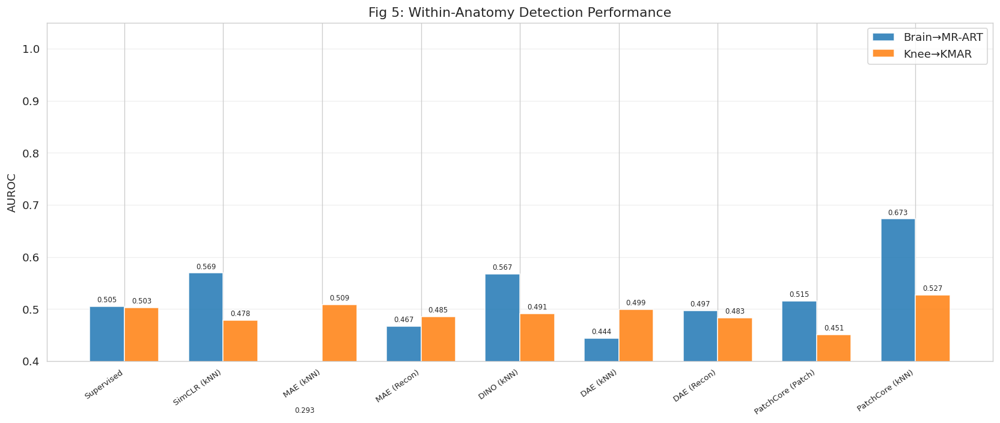

Saved: fig5_within_anatomy.png


In [22]:
# Within-anatomy: brain model on MR-ART, knee model on KMAR
within_data = []
for method_label, method_key in SCORING_METHODS.items():
    if method_key not in all_results:
        continue
    # Brain -> MR-ART
    if "brain" in all_results[method_key] and "mrart" in all_results[method_key]["brain"]:
        m = all_results[method_key]["brain"]["mrart"]["metrics"]
        within_data.append({"Method": method_label, "Pair": "Brain→MR-ART", "AUROC": m["auroc"]})
    # Knee -> KMAR
    if "knee" in all_results[method_key] and "kmar" in all_results[method_key]["knee"]:
        m = all_results[method_key]["knee"]["kmar"]["metrics"]
        within_data.append({"Method": method_label, "Pair": "Knee→KMAR", "AUROC": m["auroc"]})

df_within = pd.DataFrame(within_data)

fig, ax = plt.subplots(figsize=(14, 6))
pairs = df_within["Pair"].unique()
methods = df_within["Method"].unique()
x = np.arange(len(methods))
width = 0.35

for i, pair in enumerate(pairs):
    sub = df_within[df_within["Pair"] == pair]
    vals = [sub[sub["Method"] == m]["AUROC"].values[0] if m in sub["Method"].values else 0
            for m in methods]
    bars = ax.bar(x + i * width - width/2, vals, width, label=pair, alpha=0.85)
    for bar, v in zip(bars, vals):
        if not np.isnan(v):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                    f"{v:.3f}", ha='center', va='bottom', fontsize=7, rotation=0)

ax.set_ylabel("AUROC")
ax.set_title("Fig 5: Within-Anatomy Detection Performance")
ax.set_xticks(x)
ax.set_xticklabels(methods, rotation=35, ha='right', fontsize=8)
ax.legend()
ax.set_ylim(0.4, 1.05)
ax.grid(True, alpha=0.3, axis='y')
fig.tight_layout()
fig.savefig("fig5_within_anatomy.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: fig5_within_anatomy.png")

## 10. Paper Section 4.4 — Cross-Anatomy Generalization (Table 7, Fig 6)
Brain model → KMAR (knee test), Knee model → MR-ART (brain test)


TABLE 7: Cross-Anatomy Generalization
           Method                Pair  AUROC  AUPRC     F1
       Supervised  Brain→KMAR (cross) 0.4978 0.6993 0.3944
       Supervised Knee→MR-ART (cross) 0.4998 0.6991 0.8228
     SimCLR (kNN)  Brain→KMAR (cross) 0.5020 0.6984 0.7496
     SimCLR (kNN) Knee→MR-ART (cross) 0.4813 0.6812 0.0020
        MAE (kNN)  Brain→KMAR (cross) 0.4801 0.6833 0.7874
        MAE (kNN) Knee→MR-ART (cross) 0.4165 0.6736 0.2769
      MAE (Recon)  Brain→KMAR (cross) 0.4758 0.6889 0.8196
      MAE (Recon) Knee→MR-ART (cross) 0.4593 0.6654 0.0009
       DINO (kNN)  Brain→KMAR (cross) 0.4913 0.6916 0.8031
       DINO (kNN) Knee→MR-ART (cross) 0.3549 0.6214 0.0241
        DAE (kNN)  Brain→KMAR (cross) 0.4941 0.6984 0.2379
        DAE (kNN) Knee→MR-ART (cross) 0.3270 0.5956 0.0009
      DAE (Recon)  Brain→KMAR (cross) 0.4846 0.6913 0.8123
      DAE (Recon) Knee→MR-ART (cross) 0.4359 0.6526 0.8220
PatchCore (Patch)  Brain→KMAR (cross) 0.4729 0.6776 0.0015
PatchCore (Patch)

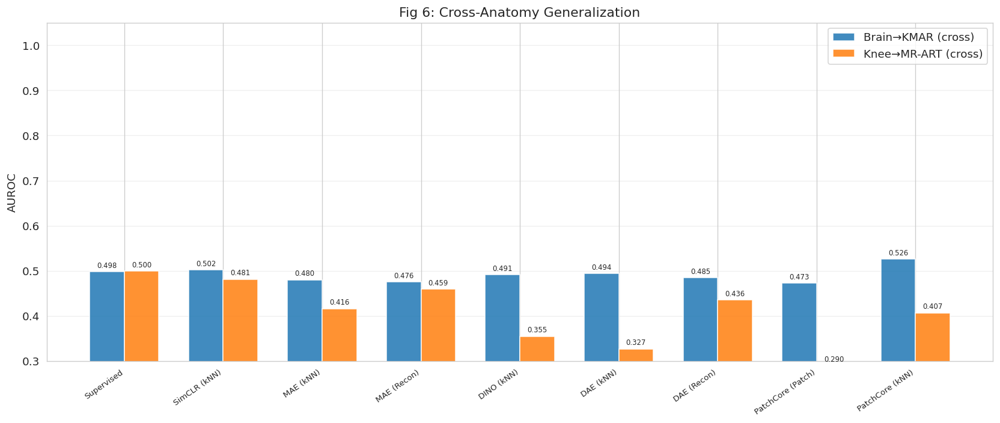

Saved: fig6_cross_anatomy.png


In [23]:
# Cross-anatomy
cross_data = []
for method_label, method_key in SCORING_METHODS.items():
    if method_key not in all_results:
        continue
    # Brain -> KMAR (cross)
    if "brain" in all_results[method_key] and "kmar" in all_results[method_key]["brain"]:
        m = all_results[method_key]["brain"]["kmar"]["metrics"]
        cross_data.append({"Method": method_label, "Pair": "Brain→KMAR (cross)",
                          "AUROC": m["auroc"], "AUPRC": m["auprc"], "F1": m["f1"]})
    # Knee -> MR-ART (cross)
    if "knee" in all_results[method_key] and "mrart" in all_results[method_key]["knee"]:
        m = all_results[method_key]["knee"]["mrart"]["metrics"]
        cross_data.append({"Method": method_label, "Pair": "Knee→MR-ART (cross)",
                          "AUROC": m["auroc"], "AUPRC": m["auprc"], "F1": m["f1"]})

df_cross = pd.DataFrame(cross_data)
print("\nTABLE 7: Cross-Anatomy Generalization")
print(df_cross.to_string(index=False, float_format="{:.4f}".format))
df_cross.to_csv("table7_cross_anatomy.csv", index=False)

# Fig 6: Grouped bar chart
fig, ax = plt.subplots(figsize=(14, 6))
pairs = df_cross["Pair"].unique()
methods = df_cross["Method"].unique()
x = np.arange(len(methods))
width = 0.35

for i, pair in enumerate(pairs):
    sub = df_cross[df_cross["Pair"] == pair]
    vals = [sub[sub["Method"] == m]["AUROC"].values[0] if m in sub["Method"].values else 0
            for m in methods]
    bars = ax.bar(x + i * width - width/2, vals, width, label=pair, alpha=0.85)
    for bar, v in zip(bars, vals):
        if not np.isnan(v):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                    f"{v:.3f}", ha='center', va='bottom', fontsize=7)

ax.set_ylabel("AUROC")
ax.set_title("Fig 6: Cross-Anatomy Generalization")
ax.set_xticks(x)
ax.set_xticklabels(methods, rotation=35, ha='right', fontsize=8)
ax.legend()
ax.set_ylim(0.3, 1.05)
ax.grid(True, alpha=0.3, axis='y')
fig.tight_layout()
fig.savefig("fig6_cross_anatomy.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: fig6_cross_anatomy.png")

### 10b. Domain-Shift Diagnostic — Dataset-Identity Shortcut Test
**Key concern**: Training pairs clean data from one source (FastMRI/IXI) with artifacts from another (KMAR/MR-ART). Could the model learn *dataset membership* rather than *artifact detection*?

**Test design**: Compare within-anatomy AUROC (same-scanner clean vs artifact) to cross-anatomy AUROC (different anatomy/scanner). A large drop indicates reliance on source-domain shortcuts; stable performance indicates genuine artifact sensitivity.

| Evaluation | Clean source | Artifact source | Shortcut possible? |
|------------|-------------|-----------------|-------------------|
| **Within** (Brain→MR-ART) | MR-ART clean | MR-ART artifact | **No** — same scanner |
| **Within** (Knee→KMAR) | KMAR clean | KMAR artifact | **No** — same scanner |
| **Cross** (Brain→KMAR) | KMAR clean | KMAR artifact | **No** — model never saw KMAR |
| **Cross** (Knee→MR-ART) | MR-ART clean | MR-ART artifact | **No** — model never saw MR-ART |

> **Note**: Even within-anatomy tests use **same-scanner** clean/artifact pairs, so a high AUROC cannot be explained by dataset-identity shortcuts.

  DOMAIN-SHIFT DIAGNOSTIC: Within-Anatomy vs Cross-Anatomy AUROC
  (Δ > 0.05 = possible shortcut reliance; Δ ≈ 0 = genuine artifact detection)
           Method  Within (Brain→MR-ART)  Cross  (Brain→KMAR)  Δ Brain  Within (Knee→KMAR)  Cross  (Knee→MR-ART)  Δ Knee   Avg Δ
       Supervised                 0.5054               0.4978   0.0075              0.5026                0.4998  0.0028  0.0052
     SimCLR (kNN)                 0.5691               0.5020   0.0671              0.4783                0.4813 -0.0030  0.0320
        MAE (kNN)                 0.2931               0.4801  -0.1871              0.5088                0.4165  0.0924 -0.0474
      MAE (Recon)                 0.4672               0.4758  -0.0086              0.4851                0.4593  0.0258  0.0086
       DINO (kNN)                 0.5674               0.4913   0.0761              0.4909                0.3549  0.1360  0.1061
        DAE (kNN)                 0.4443               0.4941  -0.0498             

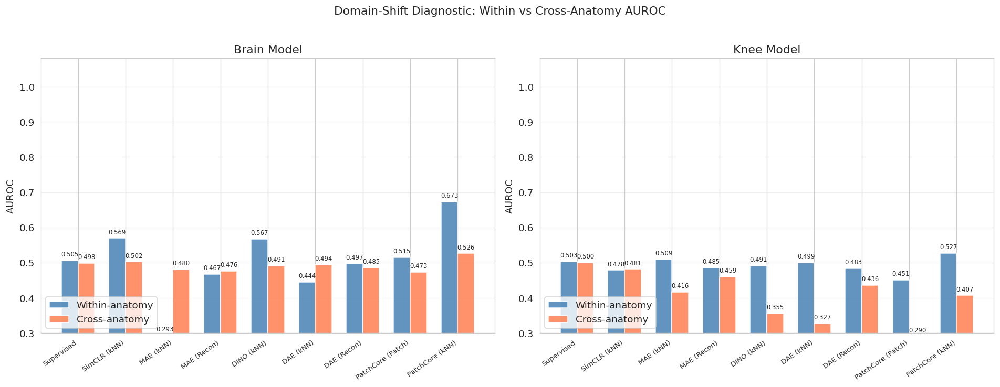

Saved: fig_domain_shift_diagnostic.png


In [24]:
# ══════════════════════════════════════════════════════════════
# Domain-Shift Diagnostic Table
# Compares within-anatomy vs cross-anatomy AUROC per method.
# A method that learned genuine artifact features will show
# stable AUROC; a shortcut learner will show a large delta.
# ══════════════════════════════════════════════════════════════

domain_diag = []
for method_label, method_key in SCORING_METHODS.items():
    if method_key not in all_results:
        continue
    row = {"Method": method_label}

    # Within-anatomy (same scanner in test set)
    within_brain = within_knee = cross_brain = cross_knee = np.nan
    if "brain" in all_results[method_key]:
        r = all_results[method_key]["brain"]
        if "mrart" in r:
            within_brain = r["mrart"]["metrics"]["auroc"]
        if "kmar" in r:
            cross_brain = r["kmar"]["metrics"]["auroc"]   # brain model → knee test
    if "knee" in all_results[method_key]:
        r = all_results[method_key]["knee"]
        if "kmar" in r:
            within_knee = r["kmar"]["metrics"]["auroc"]
        if "mrart" in r:
            cross_knee = r["mrart"]["metrics"]["auroc"]    # knee model → brain test

    row["Within (Brain→MR-ART)"] = within_brain
    row["Cross  (Brain→KMAR)"]   = cross_brain
    row["Δ Brain"]               = within_brain - cross_brain if not (np.isnan(within_brain) or np.isnan(cross_brain)) else np.nan
    row["Within (Knee→KMAR)"]    = within_knee
    row["Cross  (Knee→MR-ART)"]  = cross_knee
    row["Δ Knee"]                = within_knee - cross_knee if not (np.isnan(within_knee) or np.isnan(cross_knee)) else np.nan
    row["Avg Δ"]                 = np.nanmean([row["Δ Brain"], row["Δ Knee"]])
    domain_diag.append(row)

df_domain = pd.DataFrame(domain_diag)

print("=" * 100)
print("  DOMAIN-SHIFT DIAGNOSTIC: Within-Anatomy vs Cross-Anatomy AUROC")
print("  (Δ > 0.05 = possible shortcut reliance; Δ ≈ 0 = genuine artifact detection)")
print("=" * 100)
print(df_domain.to_string(index=False, float_format="{:.4f}".format))
print()

# Interpretation
for _, r in df_domain.iterrows():
    avg_delta = r["Avg Δ"]
    if np.isnan(avg_delta):
        continue
    if abs(avg_delta) < 0.02:
        verdict = "✅ Robust — no shortcut reliance"
    elif abs(avg_delta) < 0.05:
        verdict = "⚠️ Minor domain gap"
    elif avg_delta > 0:
        verdict = "❌ Significant drop — possible shortcut"
    else:
        verdict = "🔄 Cross > Within (unexpected)"
    print(f"  {r['Method']:<25} Avg Δ = {avg_delta:+.4f}  {verdict}")

df_domain.to_csv("table_domain_shift_diagnostic.csv", index=False)
print("\nSaved: table_domain_shift_diagnostic.csv")

# Visualization: paired bar chart
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle("Domain-Shift Diagnostic: Within vs Cross-Anatomy AUROC", fontsize=13, y=1.02)

methods_list = df_domain["Method"].values
x = np.arange(len(methods_list))
w = 0.35

for ax_idx, (within_col, cross_col, delta_col, title) in enumerate([
    ("Within (Brain→MR-ART)", "Cross  (Brain→KMAR)", "Δ Brain", "Brain Model"),
    ("Within (Knee→KMAR)", "Cross  (Knee→MR-ART)", "Δ Knee", "Knee Model"),
]):
    ax = axes[ax_idx]
    within_vals = df_domain[within_col].values
    cross_vals = df_domain[cross_col].values

    bars1 = ax.bar(x - w/2, within_vals, w, label="Within-anatomy", color="steelblue", alpha=0.85)
    bars2 = ax.bar(x + w/2, cross_vals, w, label="Cross-anatomy", color="coral", alpha=0.85)

    for b, v in zip(bars1, within_vals):
        if not np.isnan(v):
            ax.text(b.get_x() + b.get_width()/2, b.get_height() + 0.008,
                    f"{v:.3f}", ha='center', va='bottom', fontsize=7)
    for b, v in zip(bars2, cross_vals):
        if not np.isnan(v):
            ax.text(b.get_x() + b.get_width()/2, b.get_height() + 0.008,
                    f"{v:.3f}", ha='center', va='bottom', fontsize=7)

    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(methods_list, rotation=35, ha='right', fontsize=8)
    ax.set_ylabel("AUROC")
    ax.set_ylim(0.3, 1.08)
    ax.legend(loc='lower left')
    ax.grid(True, alpha=0.3, axis='y')

fig.tight_layout()
fig.savefig("fig_domain_shift_diagnostic.png", dpi=150, bbox_inches='tight')
plt.show()
print("Saved: fig_domain_shift_diagnostic.png")

## 11. Paper Section 4.5 — Multi-Anatomy Training Effect (Table 8, Fig 7)
Compare: combined model vs single-anatomy models on each test set.


TABLE 8: Multi-Anatomy Training Effect
  (AUROC for MRART/KMAR, Detection Rate for SIMULATED)
Training                     brain  combined   knee
Method            Test Set                         
DAE (Recon)       KMAR      0.4846    0.4942 0.4833
                  MRART     0.4971    0.5167 0.4359
                  SIMULATED 0.5681    0.5484 0.6307
DAE (kNN)         KMAR      0.4941    0.5003 0.4994
                  MRART     0.4443    0.4357 0.3270
                  SIMULATED 0.2412    0.2990 0.0818
DINO (kNN)        KMAR      0.4913    0.4988 0.4909
                  MRART     0.5674    0.5677 0.3549
                  SIMULATED 0.7777    0.9665 0.5173
MAE (Recon)       KMAR      0.4758    0.4759 0.4851
                  MRART     0.4672    0.4594 0.4593
                  SIMULATED 0.9842    0.9885 0.3476
MAE (kNN)         KMAR      0.4801    0.5117 0.5088
                  MRART     0.2931    0.4544 0.4165
                  SIMULATED 0.2182    0.0003 0.0059
PatchCore (Patch) KMA

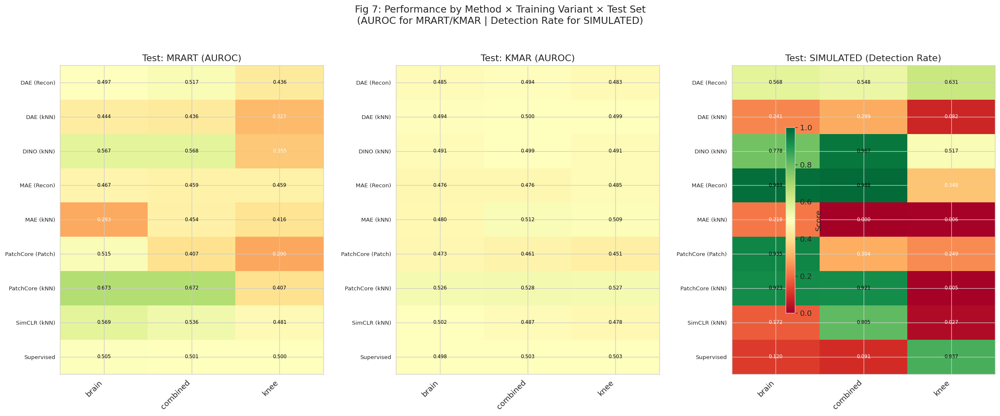

Saved: fig7_multi_anatomy_heatmap.png


In [25]:
# Compare combined vs best single-anatomy for each method × test set
# Use AUROC for two-class test sets, detection rate for simulated
multi_data = []
for method_label, method_key in SCORING_METHODS.items():
    if method_key not in all_results:
        continue
    for test_name in ["mrart", "kmar", "simulated"]:
        for variant in VARIANTS:
            if variant not in all_results[method_key]:
                continue
            if test_name not in all_results[method_key][variant]:
                continue
            m = all_results[method_key][variant][test_name]["metrics"]
            if test_name == "simulated":
                score_val = m.get("detection_rate", float("nan"))
                metric_name = "Detection Rate"
            else:
                score_val = m["auroc"]
                metric_name = "AUROC"
            multi_data.append({
                "Method": method_label, "Training": variant,
                "Test Set": test_name.upper(), "Score": score_val,
                "Metric": metric_name,
            })

df_multi = pd.DataFrame(multi_data)

# Pivot: combined vs knee vs brain
print("\nTABLE 8: Multi-Anatomy Training Effect")
print("  (AUROC for MRART/KMAR, Detection Rate for SIMULATED)")
pivot = df_multi.pivot_table(index=["Method", "Test Set"], columns="Training", values="Score")
print(pivot.to_string(float_format="{:.4f}".format, na_rep="—"))
pivot.to_csv("table8_multi_anatomy.csv")

# Fig 7: Heatmap — AUROC for two-class, detection rate for simulated
fig, axes = plt.subplots(1, 3, figsize=(20, 8))
for idx, test_name in enumerate(["MRART", "KMAR", "SIMULATED"]):
    sub = df_multi[df_multi["Test Set"] == test_name]
    pivot_sub = sub.pivot_table(index="Method", columns="Training", values="Score")
    im = axes[idx].imshow(pivot_sub.values, cmap='RdYlGn', vmin=0.0, vmax=1.0, aspect='auto')
    axes[idx].set_xticks(range(len(pivot_sub.columns)))
    axes[idx].set_xticklabels(pivot_sub.columns, rotation=45, ha='right')
    axes[idx].set_yticks(range(len(pivot_sub.index)))
    axes[idx].set_yticklabels(pivot_sub.index, fontsize=8)
    metric_label = "Detection Rate" if test_name == "SIMULATED" else "AUROC"
    axes[idx].set_title(f"Test: {test_name} ({metric_label})")
    for i in range(len(pivot_sub.index)):
        for j in range(len(pivot_sub.columns)):
            v = pivot_sub.values[i, j]
            if not np.isnan(v):
                axes[idx].text(j, i, f"{v:.3f}", ha='center', va='center', fontsize=7,
                             color='white' if v < 0.4 else 'black')
fig.colorbar(im, ax=axes, shrink=0.6, label='Score')
fig.suptitle("Fig 7: Performance by Method × Training Variant × Test Set\n"
             "(AUROC for MRART/KMAR | Detection Rate for SIMULATED)",
             fontsize=14, y=1.03)
fig.tight_layout()
fig.savefig("fig7_multi_anatomy_heatmap.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: fig7_multi_anatomy_heatmap.png")

## 12. Paper Section 4.6 — Synthetic Artifact Evaluation (Table 9, Fig 8)
Breakdown by artifact type: noisy, motion, blurred

Artifact types in simulated set: ['blurred' 'motion' 'noisy']
  blurred: 1677 images
  motion: 559 images
  noisy: 1677 images

TABLE 9: Synthetic Artifact Detection Rate by Type (combined model)
  (Detection rate = fraction flagged as artifact at MR-ART threshold)
           Method Artifact Type    N  Detection Rate  Mean Score  Std Score
       Supervised       blurred 1677          0.0489      0.2147     0.3762
       Supervised        motion  559          0.2648      0.7041     0.3987
       Supervised         noisy 1677          0.0763      0.3210     0.4229
     SimCLR (kNN)       blurred 1677          0.7519      0.1152     0.0564
     SimCLR (kNN)        motion  559          0.8068      0.1193     0.0527
     SimCLR (kNN)         noisy 1677          0.8569      0.1305     0.0540
        MAE (kNN)       blurred 1677          0.0006      0.2230     0.0909
        MAE (kNN)        motion  559          0.0000      0.1656     0.0825
        MAE (kNN)         noisy 1677          0.00

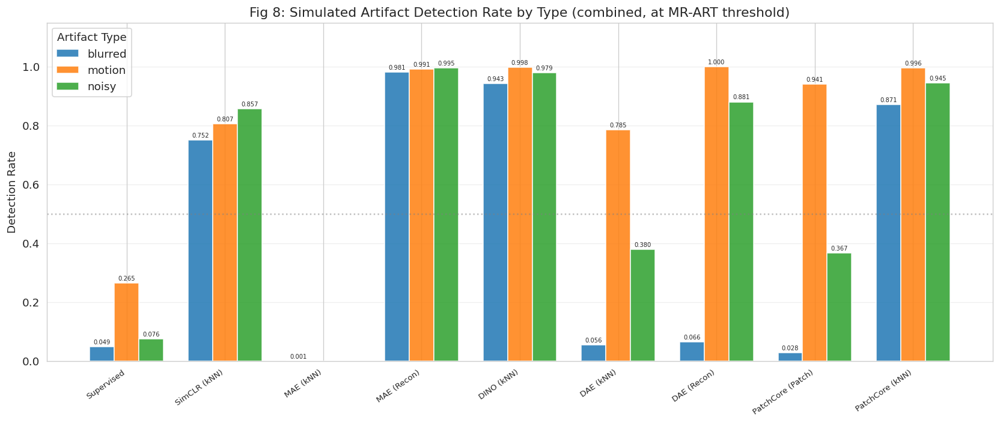

Saved: fig8_synthetic_by_type.png


In [26]:
# Check if we have artifact_types in simulated data
if "artifact_types" in test_data["simulated"]:
    artifact_types = test_data["simulated"]["artifact_types"]
    labels_sim = test_data["simulated"]["labels"]
    paths_sim = test_data["simulated"]["paths"]

    unique_types = np.unique(artifact_types)
    print(f"Artifact types in simulated set: {unique_types}")
    for t in unique_types:
        mask_t = artifact_types == t
        print(f"  {t}: {mask_t.sum()} images")

    # Per-type detection rate for combined variant
    # Simulated is artifact-only — use borrowed mrart threshold for each method
    synth_data = []
    for method_label, method_key in SCORING_METHODS.items():
        if method_key not in all_results:
            continue
        if "combined" not in all_results[method_key]:
            continue
        if "simulated" not in all_results[method_key]["combined"]:
            continue

        all_scores = all_results[method_key]["combined"]["simulated"]["scores"]
        all_labels = all_results[method_key]["combined"]["simulated"]["labels"]

        # Borrow threshold from mrart evaluation
        mrart_thresh = float("nan")
        if "mrart" in all_results[method_key]["combined"]:
            mrart_thresh = all_results[method_key]["combined"]["mrart"]["metrics"]["threshold"]

        for atype in unique_types:
            if atype == "clean":
                continue
            mask_type = artifact_types == atype
            sub_scores = all_scores[mask_type]
            sub_labels = all_labels[mask_type]

            if len(sub_scores) == 0:
                continue

            # Detection rate at borrowed threshold
            if not np.isnan(mrart_thresh):
                det_rate = float((sub_scores >= mrart_thresh).mean())
            else:
                det_rate = float("nan")

            synth_data.append({
                "Method": method_label, "Artifact Type": atype,
                "N": len(sub_scores),
                "Detection Rate": det_rate,
                "Mean Score": float(sub_scores.mean()),
                "Std Score": float(sub_scores.std()),
            })

    df_synth = pd.DataFrame(synth_data)
    print("\nTABLE 9: Synthetic Artifact Detection Rate by Type (combined model)")
    print("  (Detection rate = fraction flagged as artifact at MR-ART threshold)")
    print(df_synth.to_string(index=False, float_format="{:.4f}".format))
    df_synth.to_csv("table9_synthetic_by_type.csv", index=False)

    # Fig 8: Grouped bar chart — detection rate per type
    fig, ax = plt.subplots(figsize=(14, 6))
    atypes = [t for t in unique_types if t != "clean"]
    methods = df_synth["Method"].unique()
    x = np.arange(len(methods))
    width = 0.25
    for i, atype in enumerate(atypes):
        sub = df_synth[df_synth["Artifact Type"] == atype]
        vals = [sub[sub["Method"] == m]["Detection Rate"].values[0] if m in sub["Method"].values else 0
                for m in methods]
        bars = ax.bar(x + (i - len(atypes)/2 + 0.5) * width, vals, width, label=atype, alpha=0.85)
        for bar, v in zip(bars, vals):
            if not np.isnan(v) and v > 0:
                ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                        f"{v:.3f}", ha='center', va='bottom', fontsize=6)
    ax.set_ylabel("Detection Rate")
    ax.set_title("Fig 8: Simulated Artifact Detection Rate by Type (combined, at MR-ART threshold)")
    ax.set_xticks(x)
    ax.set_xticklabels(methods, rotation=35, ha='right', fontsize=8)
    ax.legend(title="Artifact Type")
    ax.set_ylim(0, 1.15)
    ax.axhline(y=0.5, color='gray', linestyle=':', alpha=0.5)
    ax.grid(True, alpha=0.3, axis='y')
    fig.tight_layout()
    fig.savefig("fig8_synthetic_by_type.png", dpi=200, bbox_inches='tight')
    plt.show()
    print("Saved: fig8_synthetic_by_type.png")
else:
    print("No artifact_types field in simulated manifest — skipping per-type analysis")

## 13. Paper Section 4.7 — Severity Sensitivity (Table 10, Fig 9)
MR-ART headmotion1 (mild) vs headmotion2 (severe)

**Note**: The original filenames encode severity. We attempt to derive it from the file paths.

MR-ART severity distribution:
  clean: 2960
  mild: 2233
  severe: 4648

TABLE 10: Severity Sensitivity (MR-ART)
           Method Training Severity  AUROC  AUPRC     F1
       Supervised    brain     mild 0.5028 0.4314 0.6014
       Supervised    brain   severe 0.5066 0.6141 0.7609
       Supervised combined     mild 0.5002 0.4301 0.6011
       Supervised combined   severe 0.5014 0.6116 0.7590
     SimCLR (kNN)    brain     mild 0.5449 0.4733 0.5446
     SimCLR (kNN)    brain   severe 0.5807 0.6802 0.5115
     SimCLR (kNN) combined     mild 0.5302 0.4477 0.5914
     SimCLR (kNN) combined   severe 0.5389 0.6291 0.7172
        MAE (kNN)    brain     mild 0.3236 0.3342 0.0018
        MAE (kNN)    brain   severe 0.2784 0.4867 0.0000
        MAE (kNN) combined     mild 0.4605 0.3960 0.6015
        MAE (kNN) combined   severe 0.4515 0.5667 0.0056
      MAE (Recon)    brain     mild 0.4664 0.3984 0.5970
      MAE (Recon)    brain   severe 0.4676 0.5813 0.7423
      MAE (Recon) combined     m

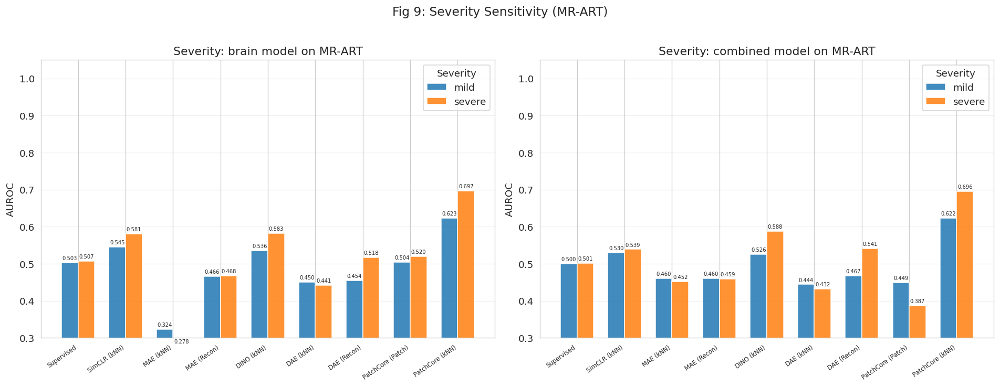

Saved: fig9_severity.png


In [27]:
# Derive severity from MR-ART file paths
# Files are in test_mrart/artifact/ — original format includes headmotion1/headmotion2
mrart_paths = test_data["mrart"]["paths"]
mrart_labels = test_data["mrart"]["labels"]

# Attempt to parse severity from paths
severity = []
for p in mrart_paths:
    p_str = str(p).replace("\\", "/")
    if "headmotion1" in p_str or "hm1" in p_str:
        severity.append("mild")
    elif "headmotion2" in p_str or "hm2" in p_str:
        severity.append("severe")
    elif "/clean/" in p_str or "/clean\\" in p_str:
        severity.append("clean")
    else:
        # For artifact images without severity marker, check directory
        if "/artifact/" in p_str or "\\artifact\\" in p_str:
            severity.append("unknown_artifact")
        else:
            severity.append("clean")

severity = np.array(severity)
print("MR-ART severity distribution:")
for s in np.unique(severity):
    print(f"  {s}: {(severity == s).sum()}")

has_severity = ("mild" in severity) or ("severe" in severity)

if has_severity:
    sev_data = []
    for method_label, method_key in SCORING_METHODS.items():
        if method_key not in all_results:
            continue
        for variant in ["brain", "combined"]:
            if variant not in all_results[method_key]:
                continue
            if "mrart" not in all_results[method_key][variant]:
                continue

            all_scores = all_results[method_key][variant]["mrart"]["scores"]

            for sev_level in ["mild", "severe"]:
                mask = (severity == sev_level) | (severity == "clean")
                sub_scores = all_scores[mask]
                sub_labels = mrart_labels[mask]
                if len(np.unique(sub_labels)) < 2:
                    continue
                m = compute_metrics(sub_scores, sub_labels)
                sev_data.append({
                    "Method": method_label, "Training": variant,
                    "Severity": sev_level, "AUROC": m["auroc"],
                    "AUPRC": m["auprc"], "F1": m["f1"],
                })

    df_sev = pd.DataFrame(sev_data)
    print("\nTABLE 10: Severity Sensitivity (MR-ART)")
    print(df_sev.to_string(index=False, float_format="{:.4f}".format))
    df_sev.to_csv("table10_severity.csv", index=False)

    # Fig 9
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    for idx, variant in enumerate(["brain", "combined"]):
        sub = df_sev[df_sev["Training"] == variant]
        if len(sub) == 0:
            continue
        methods_v = sub["Method"].unique()
        x = np.arange(len(methods_v))
        width = 0.35
        for i, sev in enumerate(["mild", "severe"]):
            sub_sev = sub[sub["Severity"] == sev]
            vals = [sub_sev[sub_sev["Method"] == m]["AUROC"].values[0]
                    if m in sub_sev["Method"].values else 0 for m in methods_v]
            bars = axes[idx].bar(x + (i - 0.5) * width, vals, width, label=sev, alpha=0.85)
            for bar, v in zip(bars, vals):
                if not np.isnan(v):
                    axes[idx].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                                  f"{v:.3f}", ha='center', va='bottom', fontsize=6)
        axes[idx].set_ylabel("AUROC")
        axes[idx].set_title(f"Severity: {variant} model on MR-ART")
        axes[idx].set_xticks(x)
        axes[idx].set_xticklabels(methods_v, rotation=35, ha='right', fontsize=7)
        axes[idx].legend(title="Severity")
        axes[idx].set_ylim(0.3, 1.05)
        axes[idx].grid(True, alpha=0.3, axis='y')
    fig.suptitle("Fig 9: Severity Sensitivity (MR-ART)", fontsize=14, y=1.02)
    fig.tight_layout()
    fig.savefig("fig9_severity.png", dpi=200, bbox_inches='tight')
    plt.show()
    print("Saved: fig9_severity.png")
else:
    print("Severity info not available in MR-ART paths — skipping severity analysis")
    print("You may need to re-derive severity from the preprocessing step.")

## 14. Additional Analysis — ROC & PR Curves (All Methods Overlaid)

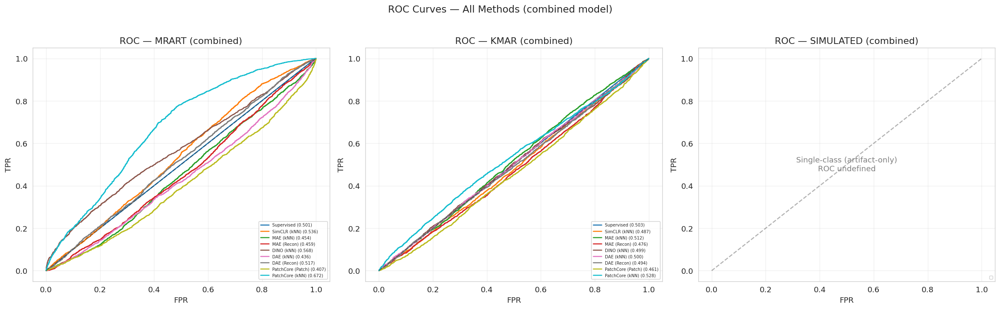

Saved: roc_curves_all_methods.png


In [28]:
# ROC curves for combined model on each test set
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
colors = plt.cm.tab10(np.linspace(0, 1, len(SCORING_METHODS)))

for test_idx, test_name in enumerate(["mrart", "kmar", "simulated"]):
    ax = axes[test_idx]
    any_plotted = False
    for (method_label, method_key), color in zip(SCORING_METHODS.items(), colors):
        if method_key not in all_results:
            continue
        if "combined" not in all_results[method_key]:
            continue
        if test_name not in all_results[method_key]["combined"]:
            continue
        r = all_results[method_key]["combined"][test_name]
        scores, labels = r["scores"], r["labels"]
        if len(np.unique(labels)) < 2:
            continue
        fpr, tpr, _ = roc_curve(labels, scores)
        auroc = roc_auc_score(labels, scores)
        ax.plot(fpr, tpr, lw=1.5, color=color, label=f"{method_label} ({auroc:.3f})")
        any_plotted = True

    ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
    ax.set_xlabel("FPR"); ax.set_ylabel("TPR")
    if not any_plotted:
        ax.text(0.5, 0.5, "Single-class (artifact-only)\nROC undefined",
                ha='center', va='center', transform=ax.transAxes, fontsize=11, color='gray')
    ax.set_title(f"ROC — {test_name.upper()} (combined)")
    ax.legend(fontsize=6, loc='lower right')
    ax.grid(True, alpha=0.3)

fig.suptitle("ROC Curves — All Methods (combined model)", fontsize=14, y=1.02)
fig.tight_layout()
fig.savefig("roc_curves_all_methods.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: roc_curves_all_methods.png")

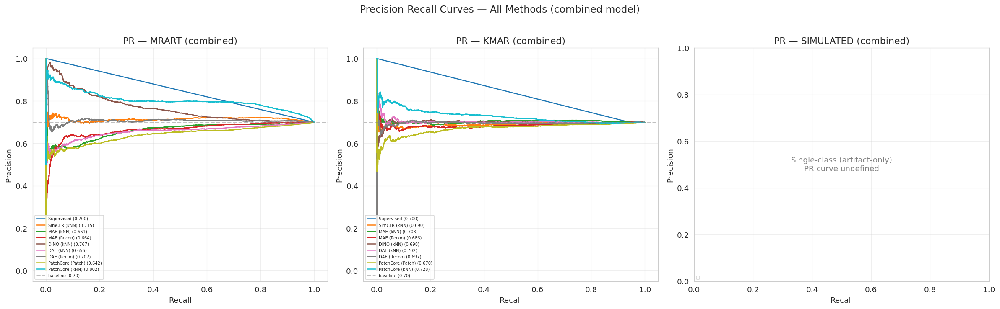

Saved: pr_curves_all_methods.png


In [29]:
# Precision-Recall curves for combined model on each test set
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for test_idx, test_name in enumerate(["mrart", "kmar", "simulated"]):
    ax = axes[test_idx]
    any_plotted = False
    for (method_label, method_key), color in zip(SCORING_METHODS.items(), colors):
        if method_key not in all_results:
            continue
        if "combined" not in all_results[method_key]:
            continue
        if test_name not in all_results[method_key]["combined"]:
            continue
        r = all_results[method_key]["combined"][test_name]
        scores, labels = r["scores"], r["labels"]
        if len(np.unique(labels)) < 2:
            continue
        prec, rec, _ = precision_recall_curve(labels, scores)
        auprc = average_precision_score(labels, scores)
        ax.plot(rec, prec, lw=1.5, color=color, label=f"{method_label} ({auprc:.3f})")
        any_plotted = True

    if any_plotted:
        baseline = test_data[test_name]["labels"].mean()
        ax.axhline(baseline, color='gray', ls='--', alpha=0.5, label=f"baseline ({baseline:.2f})")
    else:
        ax.text(0.5, 0.5, "Single-class (artifact-only)\nPR curve undefined",
                ha='center', va='center', transform=ax.transAxes, fontsize=11, color='gray')
    ax.set_xlabel("Recall"); ax.set_ylabel("Precision")
    ax.set_title(f"PR — {test_name.upper()} (combined)")
    ax.legend(fontsize=6, loc='lower left')
    ax.grid(True, alpha=0.3)

fig.suptitle("Precision-Recall Curves — All Methods (combined model)", fontsize=14, y=1.02)
fig.tight_layout()
fig.savefig("pr_curves_all_methods.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: pr_curves_all_methods.png")

## 15. Score Distributions

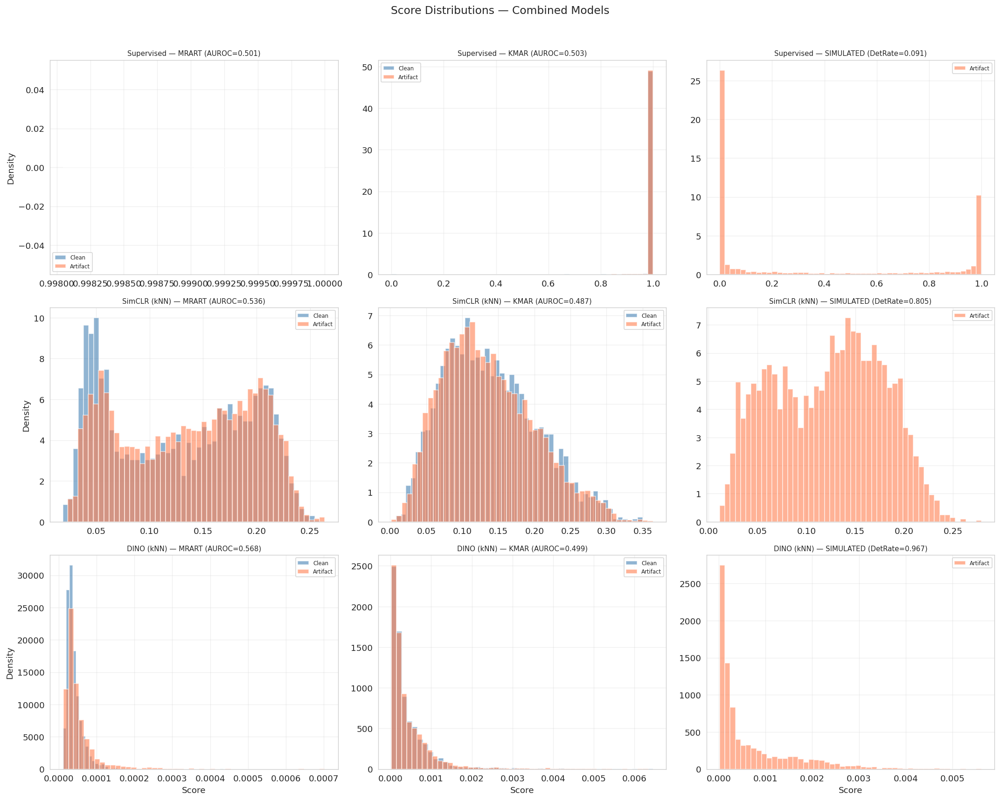

Saved: score_distributions.png


In [30]:
# Score distributions — combined model, all test sets
fig, axes = plt.subplots(3, 3, figsize=(18, 14))

select_methods = ["sup", "simclr", "dino"]  # Representative methods
method_names = ["Supervised", "SimCLR (kNN)", "DINO (kNN)"]

for row, (method_key, method_name) in enumerate(zip(select_methods, method_names)):
    if method_key not in all_results or "combined" not in all_results[method_key]:
        continue
    for col, test_name in enumerate(["mrart", "kmar", "simulated"]):
        if test_name not in all_results[method_key]["combined"]:
            continue
        ax = axes[row][col]
        r = all_results[method_key]["combined"][test_name]
        scores, labels = r["scores"], r["labels"]
        clean_scores = scores[labels == 0]
        artifact_scores = scores[labels == 1]
        auroc = r["metrics"]["auroc"]
        det_rate = r["metrics"].get("detection_rate", float("nan"))

        if len(clean_scores) > 0:
            ax.hist(clean_scores, bins=50, alpha=0.6, color='steelblue',
                    label='Clean', density=True, edgecolor='white')
        if len(artifact_scores) > 0:
            ax.hist(artifact_scores, bins=50, alpha=0.6, color='coral',
                    label='Artifact', density=True, edgecolor='white')

        # Title: AUROC for two-class, detection rate for single-class
        if test_name == "simulated" or np.isnan(auroc):
            metric_str = f"DetRate={det_rate:.3f}" if not np.isnan(det_rate) else "artifact-only"
        else:
            metric_str = f"AUROC={auroc:.3f}"
        ax.set_title(f"{method_name} — {test_name.upper()} ({metric_str})", fontsize=9)
        ax.legend(fontsize=7)
        ax.grid(True, alpha=0.3)
        if col == 0: ax.set_ylabel("Density")
        if row == 2: ax.set_xlabel("Score")

fig.suptitle("Score Distributions — Combined Models", fontsize=14, y=1.02)
fig.tight_layout()
fig.savefig("score_distributions.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: score_distributions.png")

## 16. Confusion Matrices

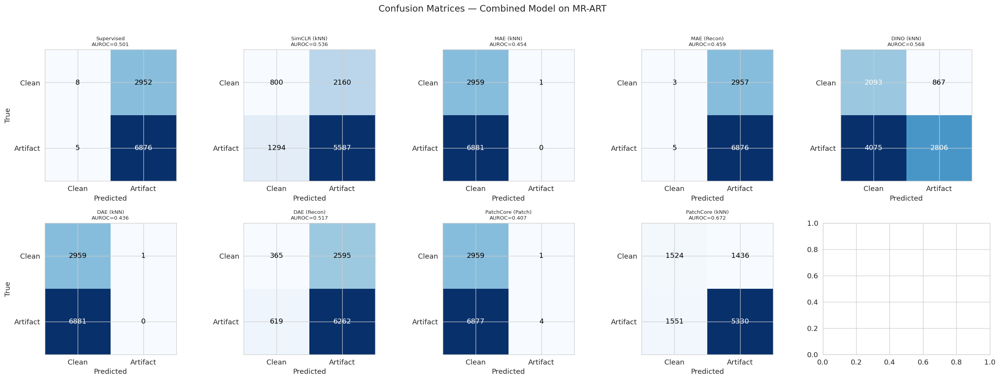

Saved: confusion_matrices.png


In [31]:
# Confusion matrices for combined model on MR-ART
fig, axes = plt.subplots(2, 5, figsize=(22, 8))
axes = axes.flatten()

for idx, (method_label, method_key) in enumerate(SCORING_METHODS.items()):
    if idx >= 10: break
    if method_key not in all_results or "combined" not in all_results[method_key]:
        axes[idx].set_visible(False); continue
    if "mrart" not in all_results[method_key]["combined"]:
        axes[idx].set_visible(False); continue

    r = all_results[method_key]["combined"]["mrart"]
    scores, labels = r["scores"], r["labels"]
    thresh = r["metrics"].get("threshold", 0.5)
    preds = (scores >= thresh).astype(int)
    cm = confusion_matrix(labels, preds, labels=[0, 1])

    ax = axes[idx]
    im = ax.imshow(cm, cmap='Blues')
    for (i, j), v in np.ndenumerate(cm):
        ax.text(j, i, str(v), ha='center', va='center',
                color='white' if v > cm.max()/2 else 'black', fontsize=11)
    ax.set_xticks([0, 1]); ax.set_yticks([0, 1])
    ax.set_xticklabels(['Clean', 'Artifact']); ax.set_yticklabels(['Clean', 'Artifact'])
    ax.set_title(f"{method_label}\nAUROC={r['metrics']['auroc']:.3f}", fontsize=8)
    if idx % 5 == 0: ax.set_ylabel("True")
    ax.set_xlabel("Predicted")

fig.suptitle("Confusion Matrices — Combined Model on MR-ART", fontsize=14, y=1.02)
fig.tight_layout()
fig.savefig("confusion_matrices.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: confusion_matrices.png")

## 17. t-SNE Feature Visualizations

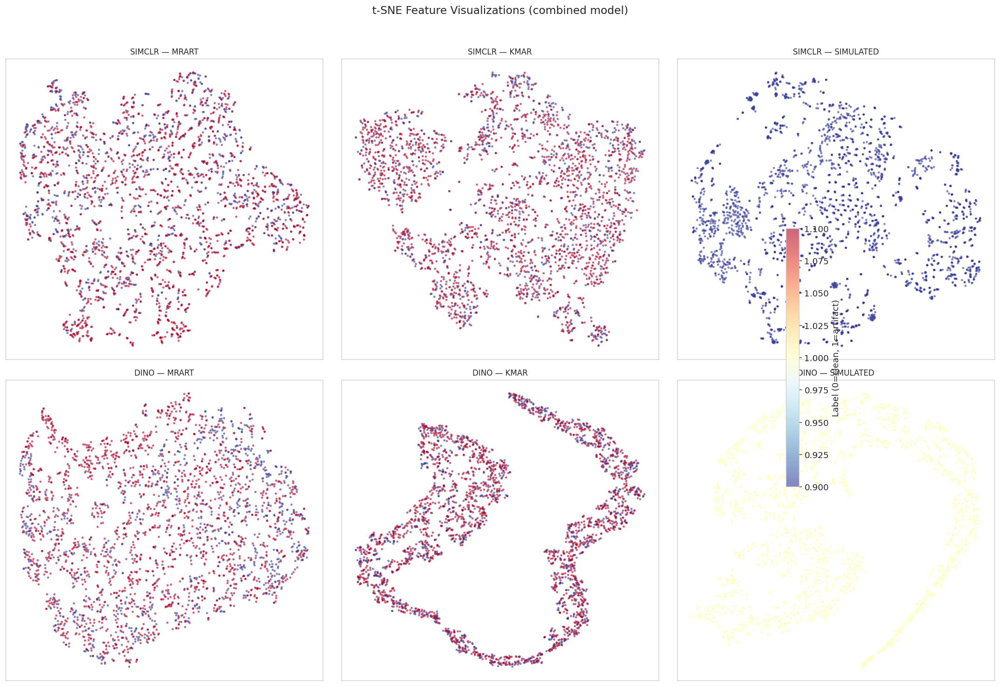

Saved: tsne_features.png


In [32]:
# t-SNE for SimCLR and DINO features (combined model)
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for row, method_prefix in enumerate(["simclr", "dino"]):
    for col, test_name in enumerate(["mrart", "kmar", "simulated"]):
        key = f"{method_prefix}_{test_name}"
        ax = axes[row][col]

        if key not in all_features:
            ax.set_title(f"{method_prefix.upper()} — {test_name.upper()} (no features)")
            continue

        feats = all_features[key]["test"]
        labels = all_features[key]["labels"]

        # Subsample for speed
        n = min(3000, len(feats))
        idx = np.random.choice(len(feats), n, replace=False)
        feats_sub = feats[idx]
        labels_sub = labels[idx]

        tsne = TSNE(n_components=2, random_state=SEED, perplexity=30, n_iter=1000)
        emb = tsne.fit_transform(feats_sub)

        scatter = ax.scatter(emb[:, 0], emb[:, 1], c=labels_sub, cmap='RdYlBu_r',
                            s=8, alpha=0.6, edgecolors='none')
        ax.set_title(f"{method_prefix.upper()} — {test_name.upper()}", fontsize=10)
        ax.set_xticks([]); ax.set_yticks([])

fig.colorbar(scatter, ax=axes, shrink=0.5, label='Label (0=clean, 1=artifact)')
fig.suptitle("t-SNE Feature Visualizations (combined model)", fontsize=14, y=1.02)
fig.tight_layout()
fig.savefig("tsne_features.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: tsne_features.png")

## 18. Reconstruction Visualizations (MAE & DAE)

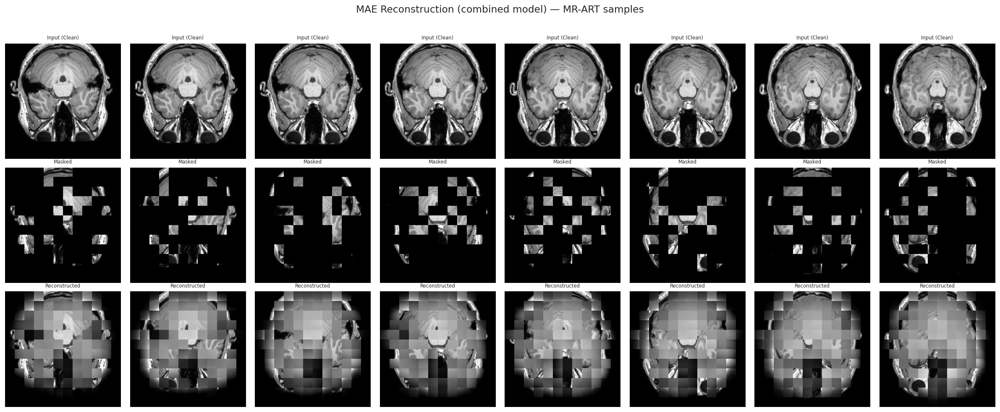

Saved: mae_reconstruction_viz.png


In [33]:
# MAE reconstruction visualization
model = load_mae("combined")
sample_loader = test_loaders_crop["mrart"]
sample_batch = next(iter(sample_loader))
sample_imgs = sample_batch[0][:8].to(device)
sample_labels = sample_batch[1][:8]

with torch.no_grad():
    visible, recon, mask = model.reconstruct_for_viz(sample_imgs, mask_ratio=0.75)

fig, axes = plt.subplots(3, 8, figsize=(20, 8))
fig.suptitle("MAE Reconstruction (combined model) — MR-ART samples", fontsize=14, y=1.02)
for i in range(8):
    lbl = "Artifact" if sample_labels[i] == 1 else "Clean"
    axes[0][i].imshow(sample_imgs[i, 0].cpu(), cmap='gray', vmin=0, vmax=1)
    axes[0][i].set_title(f"Input ({lbl})", fontsize=7); axes[0][i].axis('off')
    axes[1][i].imshow(visible[i, 0].cpu(), cmap='gray', vmin=0, vmax=1)
    axes[1][i].set_title("Masked", fontsize=7); axes[1][i].axis('off')
    axes[2][i].imshow(recon[i, 0].cpu().clamp(0, 1), cmap='gray', vmin=0, vmax=1)
    axes[2][i].set_title("Reconstructed", fontsize=7); axes[2][i].axis('off')
fig.tight_layout()
fig.savefig("mae_reconstruction_viz.png", dpi=200, bbox_inches='tight')
plt.show()
del model; clear_gpu()
print("Saved: mae_reconstruction_viz.png")

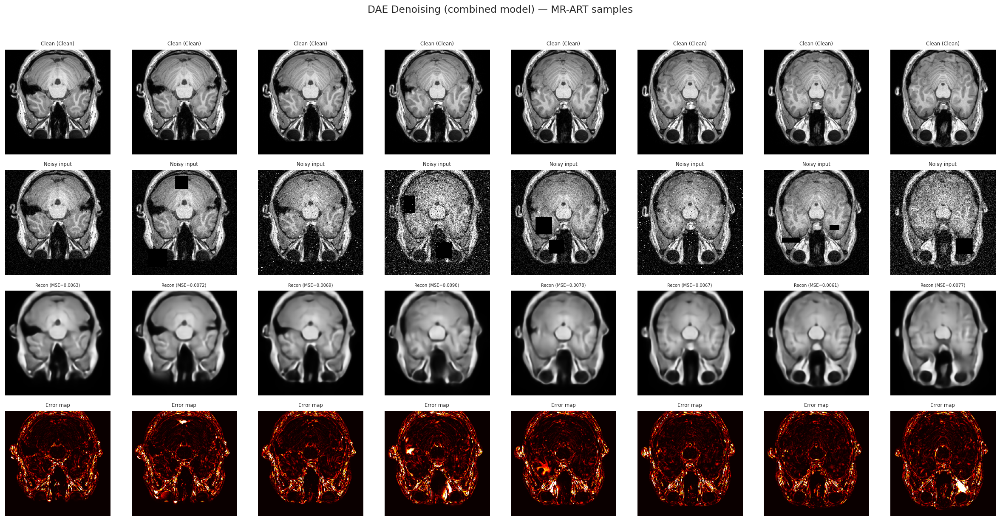

Saved: dae_reconstruction_viz.png


In [34]:
# DAE reconstruction visualization
model = load_dae("combined")
sample_loader = test_loaders_crop["mrart"]
sample_batch = next(iter(sample_loader))
sample_clean = sample_batch[0][:8].to(device)
sample_labels = sample_batch[1][:8]
sample_noisy = torch.stack([corrupt_tensor(img) for img in sample_clean.cpu()]).to(device)

with torch.no_grad(), torch.amp.autocast("cuda", enabled=(device == "cuda")):
    sample_recon = model(sample_noisy)

fig, axes = plt.subplots(4, 8, figsize=(20, 10))
fig.suptitle("DAE Denoising (combined model) — MR-ART samples", fontsize=14, y=1.02)
for i in range(8):
    lbl = "Artifact" if sample_labels[i] == 1 else "Clean"
    axes[0][i].imshow(sample_clean[i, 0].cpu(), cmap='gray', vmin=0, vmax=1)
    axes[0][i].set_title(f"Clean ({lbl})", fontsize=7); axes[0][i].axis('off')
    axes[1][i].imshow(sample_noisy[i, 0].cpu(), cmap='gray', vmin=0, vmax=1)
    axes[1][i].set_title("Noisy input", fontsize=7); axes[1][i].axis('off')
    axes[2][i].imshow(sample_recon[i, 0].cpu().float(), cmap='gray', vmin=0, vmax=1)
    mse = F.mse_loss(sample_recon[i].float(), sample_clean[i].float()).item()
    axes[2][i].set_title(f"Recon (MSE={mse:.4f})", fontsize=6); axes[2][i].axis('off')
    err = ((sample_recon[i, 0].cpu().float() - sample_clean[i, 0].cpu().float()) ** 2).numpy()
    axes[3][i].imshow(err, cmap='hot', vmin=0, vmax=0.1)
    axes[3][i].set_title("Error map", fontsize=7); axes[3][i].axis('off')
fig.tight_layout()
fig.savefig("dae_reconstruction_viz.png", dpi=200, bbox_inches='tight')
plt.show()
del model; clear_gpu()
print("Saved: dae_reconstruction_viz.png")

## 19. Paper Section 4.8 — Comparative Discussion & Summary

In [35]:
# Generate summary statistics
print("="*80)
print("  COMPARATIVE SUMMARY")
print("="*80)

# Best method per test set (combined variant)
print("\n--- Best Method per Test Set (combined model) ---")
for test_name in ["mrart", "kmar"]:
    best_auroc = -1
    best_method = ""
    for method_label, method_key in SCORING_METHODS.items():
        if method_key not in all_results or "combined" not in all_results[method_key]:
            continue
        if test_name not in all_results[method_key]["combined"]:
            continue
        auroc = all_results[method_key]["combined"][test_name]["metrics"]["auroc"]
        if not np.isnan(auroc) and auroc > best_auroc:
            best_auroc = auroc
            best_method = method_label
    print(f"  {test_name.upper()}: {best_method} — AUROC={best_auroc:.4f}")

# Simulated: best by detection rate
best_det = -1
best_method_sim = ""
for method_label, method_key in SCORING_METHODS.items():
    if method_key not in all_results or "combined" not in all_results[method_key]:
        continue
    if "simulated" not in all_results[method_key]["combined"]:
        continue
    det = all_results[method_key]["combined"]["simulated"]["metrics"].get("detection_rate", float("nan"))
    if not np.isnan(det) and det > best_det:
        best_det = det
        best_method_sim = method_label
print(f"  SIMULATED: {best_method_sim} — Detection Rate={best_det:.4f}")

# Cross-anatomy generalization summary
print("\n--- Cross-Anatomy Generalization (combined vs single) ---")
for method_label, method_key in SCORING_METHODS.items():
    if method_key not in all_results:
        continue
    aurocs = {}
    for variant in VARIANTS:
        if variant not in all_results[method_key]:
            continue
        for test_name in ["mrart", "kmar"]:
            if test_name not in all_results[method_key][variant]:
                continue
            aurocs[(variant, test_name)] = all_results[method_key][variant][test_name]["metrics"]["auroc"]
    if aurocs:
        print(f"  {method_label}:")
        for k, v in sorted(aurocs.items()):
            v_str = f"{v:.4f}" if not np.isnan(v) else "N/A"
            print(f"    {k[0]}→{k[1]}: {v_str}")

# Average AUROC across two-class test sets only (simulated has no AUROC)
print("\n--- Average AUROC across two-class test sets (combined model) ---")
avg_data = []
for method_label, method_key in SCORING_METHODS.items():
    if method_key not in all_results or "combined" not in all_results[method_key]:
        continue
    aurocs = []
    for test_name in ["mrart", "kmar"]:
        if test_name in all_results[method_key]["combined"]:
            a = all_results[method_key]["combined"][test_name]["metrics"]["auroc"]
            if not np.isnan(a):
                aurocs.append(a)
    det = float("nan")
    if "simulated" in all_results[method_key]["combined"]:
        det = all_results[method_key]["combined"]["simulated"]["metrics"].get("detection_rate", float("nan"))
    if aurocs:
        avg = np.mean(aurocs)
        avg_data.append((method_label, avg, det))
        det_str = f", SimDet={det:.3f}" if not np.isnan(det) else ""
        print(f"  {method_label}: AvgAUROC={avg:.4f}{det_str}")

avg_data.sort(key=lambda x: x[1], reverse=True)
print(f"\n  RANKING (by Avg AUROC): {' > '.join(f'{m} ({v:.3f})' for m, v, _ in avg_data)}")

  COMPARATIVE SUMMARY

--- Best Method per Test Set (combined model) ---
  MRART: PatchCore (kNN) — AUROC=0.6719
  KMAR: PatchCore (kNN) — AUROC=0.5283
  SIMULATED: MAE (Recon) — Detection Rate=0.9885

--- Cross-Anatomy Generalization (combined vs single) ---
  Supervised:
    brain→kmar: 0.4978
    brain→mrart: 0.5054
    combined→kmar: 0.5029
    combined→mrart: 0.5010
    knee→kmar: 0.5026
    knee→mrart: 0.4998
  SimCLR (kNN):
    brain→kmar: 0.5020
    brain→mrart: 0.5691
    combined→kmar: 0.4870
    combined→mrart: 0.5361
    knee→kmar: 0.4783
    knee→mrart: 0.4813
  MAE (kNN):
    brain→kmar: 0.4801
    brain→mrart: 0.2931
    combined→kmar: 0.5117
    combined→mrart: 0.4544
    knee→kmar: 0.5088
    knee→mrart: 0.4165
  MAE (Recon):
    brain→kmar: 0.4758
    brain→mrart: 0.4672
    combined→kmar: 0.4759
    combined→mrart: 0.4594
    knee→kmar: 0.4851
    knee→mrart: 0.4593
  DINO (kNN):
    brain→kmar: 0.4913
    brain→mrart: 0.5674
    combined→kmar: 0.4988
    combined→mr

---

# Part III — Extended Analysis for Discussion

The following sections provide additional material for the Results & Discussion sections of the paper, including training convergence analysis, feature collapse detection, anomaly heatmaps, and cross-method comparisons.

## 21. Training Convergence Analysis

**Purpose**: Load `scoring.npz` from each trained model to analyze training-time validation metrics. This provides evidence on convergence behavior and helps justify the 20-epoch training budget.

**Key questions**:
- Did all methods converge within 20 epochs?
- Which methods plateaued early (suggesting 20 epochs was sufficient)?
- Did any method show signs of overfitting or collapse?

In [36]:
# ══════════════════════════════════════════════════════════════
# 21. Training Convergence — Load scoring data from all 18 models
# Note: supervised saves predictions.npz, all others save scoring.npz
# ══════════════════════════════════════════════════════════════

training_analysis = {}
for method in ["sup", "simclr", "mae", "dino", "dae"]:
    training_analysis[method] = {}
    for variant in VARIANTS:
        d = ckpt_dir(method, variant)
        # Supervised saves predictions.npz; all SSL methods save scoring.npz
        candidates = ["scoring.npz", "predictions.npz"]
        loaded = False
        for fname in candidates:
            scoring_path = os.path.join(d, fname)
            if os.path.exists(scoring_path):
                data = np.load(scoring_path, allow_pickle=True)
                training_analysis[method][variant] = {k: data[k] for k in data.keys()}
                keys = list(data.keys())
                print(f"  {method}_{variant}: {fname} → {keys}")
                loaded = True
                break
        if not loaded:
            print(f"  {method}_{variant}: NO scoring data found in {d}")

# PatchCore has no scoring.npz (no training — memory bank only)
print("\nPatchCore: no training — memory bank only")
print(f"\nLoaded scoring data for {sum(len(v) for v in training_analysis.values())} models")

  sup_knee: predictions.npz → ['train_probs', 'train_labels', 'val_probs', 'val_labels', 'train_metrics', 'val_metrics', 'thresholds']
  sup_brain: predictions.npz → ['train_probs', 'train_labels', 'val_probs', 'val_labels', 'train_metrics', 'val_metrics', 'thresholds']
  sup_combined: predictions.npz → ['train_probs', 'train_labels', 'val_probs', 'val_labels', 'train_metrics', 'val_metrics', 'thresholds']
  simclr_knee: scoring.npz → ['train_knn', 'val_knn', 'train_feats', 'val_feats', 'train_labels', 'val_labels', 'threshold_knn_p95']
  simclr_brain: scoring.npz → ['train_knn', 'val_knn', 'train_feats', 'val_feats', 'train_labels', 'val_labels', 'threshold_knn_p95']
  simclr_combined: scoring.npz → ['train_knn', 'val_knn', 'train_feats', 'val_feats', 'train_labels', 'val_labels', 'threshold_knn_p95']
  mae_knee: scoring.npz → ['train_recon', 'val_recon', 'train_knn', 'val_knn', 'train_feats', 'val_feats', 'train_labels', 'val_labels', 'threshold_recon_p95', 'threshold_knn_p95']
  mae

In [37]:
# ══════════════════════════════════════════════════════════════
# Training-time validation AUROC from scoring.npz
# Shows each method's "self-evaluation" on the validation split
# before formal test-set evaluation
# ══════════════════════════════════════════════════════════════

print("="*70)
print("  TRAINING-TIME VALIDATION AUROC (from scoring.npz)")
print("="*70)

val_auroc_rows = []
for method in ["sup", "simclr", "mae", "dino", "dae"]:
    for variant in VARIANTS:
        if variant not in training_analysis[method]:
            continue
        sa = training_analysis[method][variant]
        # scoring.npz typically has val_scores and val_labels
        if "val_scores" in sa and "val_labels" in sa:
            vs = sa["val_scores"]
            vl = sa["val_labels"]
            if len(np.unique(vl)) >= 2:
                auroc = roc_auc_score(vl, vs)
                auprc = average_precision_score(vl, vs)
                val_auroc_rows.append({
                    "Method": method, "Variant": variant,
                    "Val AUROC": auroc, "Val AUPRC": auprc,
                    "N_val": len(vl), "Artifact%": 100*vl.mean()
                })
                print(f"  {method}_{variant}: AUROC={auroc:.4f}, AUPRC={auprc:.4f} "
                      f"(N={len(vl)}, artifact={100*vl.mean():.1f}%)")
            else:
                print(f"  {method}_{variant}: only one class in val_labels (no AUROC)")
        # Also check for train_scores
        elif "train_scores" in sa and "train_labels" in sa:
            ts = sa["train_scores"]
            tl = sa["train_labels"]
            if len(np.unique(tl)) >= 2:
                auroc = roc_auc_score(tl, ts)
                val_auroc_rows.append({
                    "Method": method, "Variant": variant,
                    "Val AUROC": auroc, "Val AUPRC": np.nan,
                    "N_val": len(tl), "Artifact%": 100*tl.mean()
                })
                print(f"  {method}_{variant} (train set): AUROC={auroc:.4f}")
        else:
            print(f"  {method}_{variant}: no val_scores/val_labels in scoring.npz")

if val_auroc_rows:
    df_val = pd.DataFrame(val_auroc_rows)
    print("\n--- Training-Time Validation Summary ---")
    print(df_val.to_string(index=False, float_format="%.4f"))
    df_val.to_csv("table_training_val_auroc.csv", index=False)
    print("Saved: table_training_val_auroc.csv")

  TRAINING-TIME VALIDATION AUROC (from scoring.npz)
  sup_knee: no val_scores/val_labels in scoring.npz
  sup_brain: no val_scores/val_labels in scoring.npz
  sup_combined: no val_scores/val_labels in scoring.npz
  simclr_knee: no val_scores/val_labels in scoring.npz
  simclr_brain: no val_scores/val_labels in scoring.npz
  simclr_combined: no val_scores/val_labels in scoring.npz
  mae_knee: no val_scores/val_labels in scoring.npz
  mae_brain: no val_scores/val_labels in scoring.npz
  mae_combined: no val_scores/val_labels in scoring.npz
  dino_knee: no val_scores/val_labels in scoring.npz
  dino_brain: no val_scores/val_labels in scoring.npz
  dino_combined: no val_scores/val_labels in scoring.npz
  dae_knee: no val_scores/val_labels in scoring.npz
  dae_brain: no val_scores/val_labels in scoring.npz
  dae_combined: no val_scores/val_labels in scoring.npz


## 22. Feature Collapse Detection

**Purpose**: Detect representational collapse by analyzing feature statistics from `scoring.npz`. A collapsed model maps all inputs to nearly identical features (cosine similarity ≈ 1.0, low feature STD).

**Paper use**: Explains DINO collapse on single-anatomy data. Evidence that contrastive methods (SimCLR) and reconstruction methods (MAE, DAE) are more robust to small-dataset collapse.

  FEATURE COLLAPSE DETECTION
  simclr_knee: STD=0.0312, cos=0.4833, rank=78.0 → ✅ Healthy
  simclr_brain: STD=0.0302, cos=0.5159, rank=63.5 → ✅ Healthy
  simclr_combined: STD=0.0346, cos=0.3672, rank=90.9 → ✅ Healthy
  mae_knee: STD=0.0403, cos=0.3244, rank=29.3 → ✅ Healthy
  mae_brain: STD=0.0424, cos=0.2553, rank=35.2 → ✅ Healthy
  mae_combined: STD=0.0455, cos=0.1628, rank=71.8 → ✅ Healthy
  dino_knee: STD=0.0427, cos=0.0166, rank=4.5 → ✅ Healthy
  dino_brain: STD=0.0020, cos=0.9978, rank=2.1 → ⚠️ COLLAPSED
  dino_combined: STD=0.0393, cos=0.1814, rank=5.7 → ✅ Healthy
  dae_knee: STD=0.0172, cos=0.8356, rank=23.5 → ✅ Healthy
  dae_brain: STD=0.0073, cos=0.9690, rank=21.8 → ⚠️ COLLAPSED
  dae_combined: STD=0.0112, cos=0.9255, rank=28.6 → ✅ Healthy

--- Feature Collapse Summary ---
Method  Variant  Feat STD  Mean Cosine  Eff Rank       Status
simclr     knee    0.0312       0.4833   78.0466    ✅ Healthy
simclr    brain    0.0302       0.5159   63.5174    ✅ Healthy
simclr combined    0

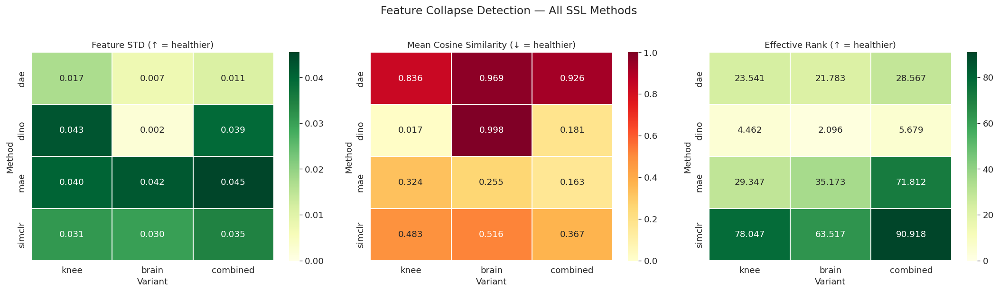

Saved: fig_collapse_detection.png


In [38]:
# ══════════════════════════════════════════════════════════════
# 22. Feature Collapse Detection
# Measures: feature STD, mean pairwise cosine similarity,
#           effective rank of feature matrix
# A healthy model: STD > 0.01, cosine < 0.9, rank > 10
# A collapsed model: STD ≈ 0, cosine ≈ 1.0, rank ≈ 1
# ══════════════════════════════════════════════════════════════

print("="*70)
print("  FEATURE COLLAPSE DETECTION")
print("="*70)

collapse_rows = []
for method in ["simclr", "mae", "dino", "dae"]:
    for variant in VARIANTS:
        if variant not in training_analysis[method]:
            continue
        sa = training_analysis[method][variant]

        # Try val_feats first, then train_feats
        feats = None
        feat_source = ""
        for key in ["val_feats", "train_feats"]:
            if key in sa:
                feats = sa[key]
                feat_source = key
                break

        if feats is None:
            print(f"  {method}_{variant}: no features found")
            continue

        # Subsample for efficiency (max 2000 samples)
        if len(feats) > 2000:
            idx = np.random.RandomState(42).choice(len(feats), 2000, replace=False)
            feats_sub = feats[idx]
        else:
            feats_sub = feats

        # 1. Feature STD (per-dimension, averaged)
        feat_std = feats_sub.std(axis=0).mean()

        # 2. Mean pairwise cosine similarity
        norms = np.linalg.norm(feats_sub, axis=1, keepdims=True) + 1e-8
        feats_normed = feats_sub / norms
        # Sample pairs for efficiency
        n_pairs = min(5000, len(feats_normed) * (len(feats_normed) - 1) // 2)
        rng = np.random.RandomState(42)
        i_pairs = rng.randint(0, len(feats_normed), n_pairs)
        j_pairs = rng.randint(0, len(feats_normed), n_pairs)
        cos_sims = (feats_normed[i_pairs] * feats_normed[j_pairs]).sum(axis=1)
        mean_cos = cos_sims.mean()

        # 3. Effective rank (via singular values)
        try:
            _, s, _ = np.linalg.svd(feats_sub[:min(500, len(feats_sub))], full_matrices=False)
            s = s / s.sum()
            eff_rank = np.exp(-np.sum(s * np.log(s + 1e-10)))
        except:
            eff_rank = np.nan

        # 4. Verdict
        collapsed = mean_cos > 0.95 or feat_std < 0.005
        status = "⚠️ COLLAPSED" if collapsed else "✅ Healthy"

        collapse_rows.append({
            "Method": method, "Variant": variant,
            "Feat STD": feat_std, "Mean Cosine": mean_cos,
            "Eff Rank": eff_rank, "Status": status
        })
        print(f"  {method}_{variant}: STD={feat_std:.4f}, cos={mean_cos:.4f}, "
              f"rank={eff_rank:.1f} → {status}")

if collapse_rows:
    df_collapse = pd.DataFrame(collapse_rows)
    print("\n--- Feature Collapse Summary ---")
    print(df_collapse.to_string(index=False, float_format="%.4f"))
    df_collapse.to_csv("table_feature_collapse.csv", index=False)
    print("Saved: table_feature_collapse.csv")

    # Visualization: collapse indicators as heatmap
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle("Feature Collapse Detection — All SSL Methods", fontsize=14, y=1.02)

    for ax_idx, (metric, title, cmap, vmin, vmax) in enumerate([
        ("Feat STD", "Feature STD (↑ = healthier)", "YlGn", 0, None),
        ("Mean Cosine", "Mean Cosine Similarity (↓ = healthier)", "YlOrRd", 0, 1),
        ("Eff Rank", "Effective Rank (↑ = healthier)", "YlGn", 0, None),
    ]):
        pivot = df_collapse.pivot_table(index="Method", columns="Variant",
                                         values=metric, aggfunc="first")
        pivot = pivot.reindex(columns=["knee", "brain", "combined"])
        sns.heatmap(pivot, annot=True, fmt=".3f", cmap=cmap, vmin=vmin, vmax=vmax,
                    ax=axes[ax_idx], linewidths=1)
        axes[ax_idx].set_title(title, fontsize=11)

    fig.tight_layout()
    fig.savefig("fig_collapse_detection.png", dpi=200, bbox_inches='tight')
    plt.show()
    print("Saved: fig_collapse_detection.png")

## 23. Comprehensive Score Distribution Analysis

**Purpose**: For every method (combined variant), show clean vs artifact anomaly score distributions side by side across all 3 test sets. The degree of separation directly predicts detection performance.

**Paper use**: Visual evidence explaining why some methods achieve high/low AUROC. Bimodal separation = strong detector; overlap = weak discriminator.

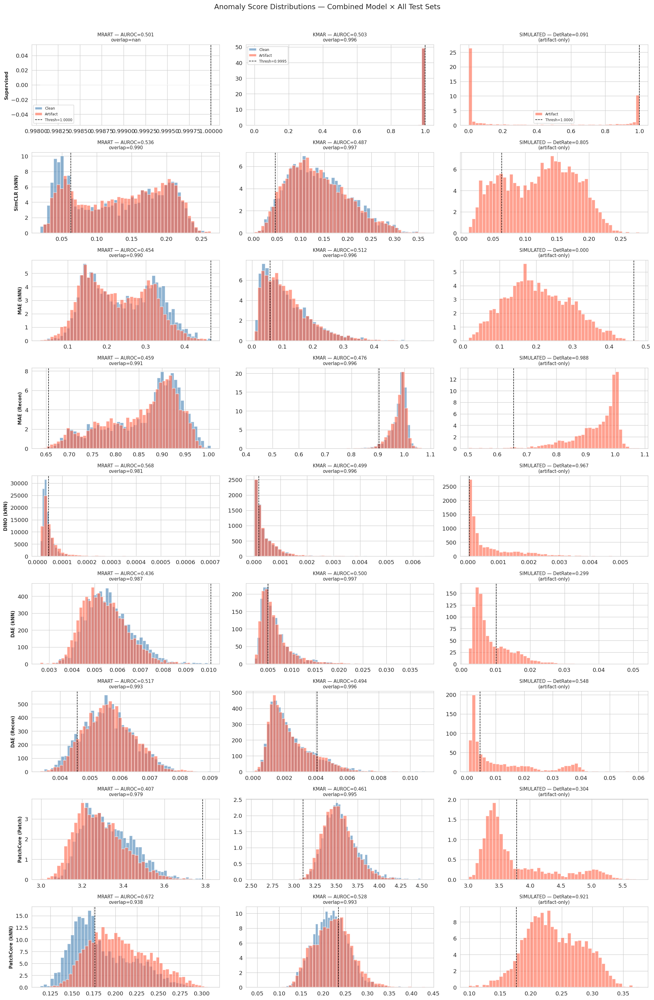

Saved: fig_score_distributions_all.png


In [39]:
# ══════════════════════════════════════════════════════════════
# 23. Comprehensive Score Distribution — All Methods × All Test Sets
# Combined variant only (the generalist model)
# Note: simulated is artifact-only — shows single distribution + detection rate
# ══════════════════════════════════════════════════════════════

method_list = [
    ("Supervised", "sup"), ("SimCLR (kNN)", "simclr"),
    ("MAE (kNN)", "mae"), ("MAE (Recon)", "mae_recon"),
    ("DINO (kNN)", "dino"), ("DAE (kNN)", "dae"),
    ("DAE (Recon)", "dae_recon"),
    ("PatchCore (Patch)", "patchcore_patch"), ("PatchCore (kNN)", "patchcore_knn"),
]
test_names = ["mrart", "kmar", "simulated"]
n_methods = len(method_list)

fig, axes = plt.subplots(n_methods, 3, figsize=(18, 3 * n_methods))
fig.suptitle("Anomaly Score Distributions — Combined Model × All Test Sets",
             fontsize=14, y=1.01)

for row, (mlabel, mkey) in enumerate(method_list):
    for col, tname in enumerate(test_names):
        ax = axes[row][col]
        if mkey in all_results and "combined" in all_results[mkey] and tname in all_results[mkey]["combined"]:
            res = all_results[mkey]["combined"][tname]
            scores = res["scores"]
            labels = res["labels"]
            clean_scores = scores[labels == 0]
            artifact_scores = scores[labels == 1]
            auroc = res["metrics"]["auroc"]
            thresh = res["metrics"].get("threshold", np.nan)
            det_rate = res["metrics"].get("detection_rate", np.nan)

            if len(clean_scores) > 0:
                ax.hist(clean_scores, bins=50, alpha=0.6, color='steelblue', label='Clean', density=True)
            if len(artifact_scores) > 0:
                ax.hist(artifact_scores, bins=50, alpha=0.6, color='tomato', label='Artifact', density=True)
            if not np.isnan(thresh):
                ax.axvline(thresh, color='black', linestyle='--', linewidth=1, label=f'Thresh={thresh:.4f}')

            # Title: use AUROC for two-class, detection rate for single-class
            if tname == "simulated" or np.isnan(auroc):
                title_metric = f"DetRate={det_rate:.3f}" if not np.isnan(det_rate) else "single-class"
            else:
                title_metric = f"AUROC={auroc:.3f}"

            # Overlap coefficient (only meaningful for two-class)
            if len(clean_scores) > 0 and len(artifact_scores) > 0:
                h_range = (min(scores.min(), scores.min()), max(scores.max(), scores.max()))
                h_c, _ = np.histogram(clean_scores, bins=50, range=h_range, density=True)
                h_a, _ = np.histogram(artifact_scores, bins=50, range=h_range, density=True)
                h_c = h_c / (h_c.sum() + 1e-10)
                h_a = h_a / (h_a.sum() + 1e-10)
                overlap = np.sum(np.sqrt(h_c * h_a))
                ax.set_title(f"{tname.upper()} — {title_metric}\noverlap={overlap:.3f}", fontsize=9)
            else:
                ax.set_title(f"{tname.upper()} — {title_metric}\n(artifact-only)", fontsize=9)

            if col == 0:
                ax.set_ylabel(mlabel, fontsize=9, fontweight='bold')
            if row == 0:
                ax.legend(fontsize=7)
        else:
            ax.text(0.5, 0.5, "N/A", ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f"{tname.upper()}", fontsize=9)

fig.tight_layout()
fig.savefig("fig_score_distributions_all.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: fig_score_distributions_all.png")

## 24. Comprehensive t-SNE — All SSL Methods Side-by-Side

**Purpose**: Compare feature spaces learned by each SSL method on the same test data. Well-separated clusters indicate discriminative representations; mixed clusters indicate the method failed to capture artifact-relevant structure.

**Paper use**: Fig. X — qualitative comparison of learned representations across SSL paradigms.

Extracting features for comprehensive t-SNE...

  Loading SimCLR (combined)...


Extracting simclr features:   0%|          | 0/154 [00:00<?, ?it/s]

Extracting simclr features:   0%|          | 0/154 [00:00<?, ?it/s]

Extracting simclr features:   0%|          | 0/62 [00:00<?, ?it/s]


  Loading MAE (combined)...


Extracting mae features:   0%|          | 0/154 [00:00<?, ?it/s]

Extracting mae features:   0%|          | 0/154 [00:00<?, ?it/s]

Extracting mae features:   0%|          | 0/62 [00:00<?, ?it/s]


  Loading DINO (combined)...


Extracting dino features:   0%|          | 0/154 [00:00<?, ?it/s]

Extracting dino features:   0%|          | 0/154 [00:00<?, ?it/s]

Extracting dino features:   0%|          | 0/62 [00:00<?, ?it/s]


  Loading DAE (combined)...


Extracting dae features:   0%|          | 0/154 [00:00<?, ?it/s]

Extracting dae features:   0%|          | 0/154 [00:00<?, ?it/s]

Extracting dae features:   0%|          | 0/62 [00:00<?, ?it/s]


Computing t-SNE embeddings...
  simclr_mrart: done (3000 points)
  simclr_kmar: done (3000 points)
  simclr_simulated: done (3000 points)
  mae_mrart: done (3000 points)
  mae_kmar: done (3000 points)
  mae_simulated: done (3000 points)
  dino_mrart: done (3000 points)
  dino_kmar: done (3000 points)
  dino_simulated: done (3000 points)
  dae_mrart: done (3000 points)
  dae_kmar: done (3000 points)
  dae_simulated: done (3000 points)


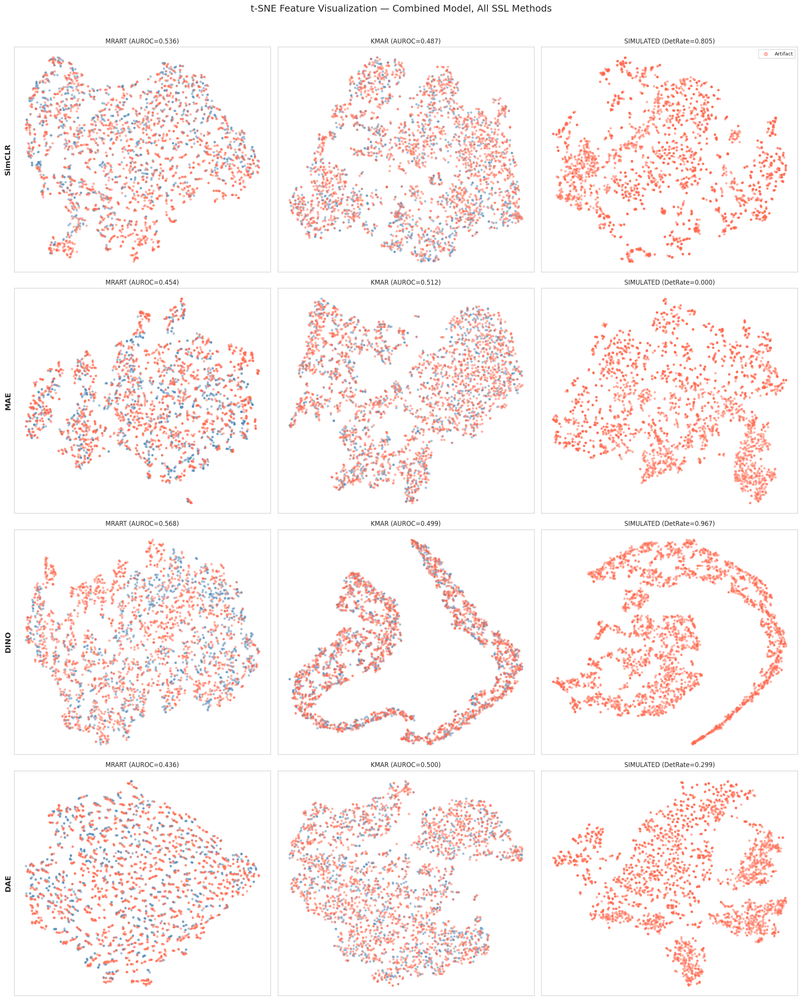

Saved: fig_tsne_all_methods.png


In [40]:
# ══════════════════════════════════════════════════════════════
# 24. Comprehensive t-SNE — All SSL methods, combined model, all test sets
# ══════════════════════════════════════════════════════════════

ssl_methods = [
    ("SimCLR", "simclr", "simclr"),
    ("MAE", "mae", "mae"),
    ("DINO", "dino", "dino"),
    ("DAE", "dae", "dae"),
]

# Re-extract features for all SSL methods on all test sets (combined model)
print("Extracting features for comprehensive t-SNE...")
tsne_features = {}

for method_name, method_key, extract_method in ssl_methods:
    print(f"\n  Loading {method_name} (combined)...")
    if method_key == "simclr":
        model = load_simclr("combined")
    elif method_key == "mae":
        model = load_mae("combined")
    elif method_key == "dino":
        model = load_dino("combined")
    elif method_key == "dae":
        model = load_dae("combined")

    for tname in ["mrart", "kmar", "simulated"]:
        feats, labels = extract_features_generic(model, test_loaders[tname], method=extract_method)
        tsne_features[f"{method_key}_{tname}"] = {"feats": feats, "labels": labels}

    del model; clear_gpu()

# Compute t-SNE embeddings
print("\nComputing t-SNE embeddings...")
tsne_embeddings = {}
for key, data in tsne_features.items():
    feats = data["feats"]
    # Subsample if too large
    if len(feats) > 3000:
        idx = np.random.RandomState(42).choice(len(feats), 3000, replace=False)
        feats_sub = feats[idx]
        labels_sub = data["labels"][idx]
    else:
        feats_sub = feats
        labels_sub = data["labels"]
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(feats_sub)//4))
    emb = tsne.fit_transform(feats_sub)
    tsne_embeddings[key] = {"emb": emb, "labels": labels_sub}
    print(f"  {key}: done ({len(feats_sub)} points)")

# Plot: 4 methods × 3 test sets
fig, axes = plt.subplots(4, 3, figsize=(18, 22))
fig.suptitle("t-SNE Feature Visualization — Combined Model, All SSL Methods",
             fontsize=15, y=1.01)

for row, (method_name, method_key, _) in enumerate(ssl_methods):
    for col, tname in enumerate(["mrart", "kmar", "simulated"]):
        ax = axes[row][col]
        key = f"{method_key}_{tname}"
        if key in tsne_embeddings:
            emb = tsne_embeddings[key]["emb"]
            labels = tsne_embeddings[key]["labels"]
            clean_mask = labels == 0
            if clean_mask.any():
                ax.scatter(emb[clean_mask, 0], emb[clean_mask, 1],
                          c='steelblue', s=8, alpha=0.4, label='Clean')
            if (~clean_mask).any():
                ax.scatter(emb[~clean_mask, 0], emb[~clean_mask, 1],
                          c='tomato', s=8, alpha=0.4, label='Artifact')
            # Get metric for title: AUROC for two-class, detection rate for simulated
            metric_str = ""
            if method_key in all_results and "combined" in all_results[method_key]:
                if tname in all_results[method_key]["combined"]:
                    m = all_results[method_key]["combined"][tname]["metrics"]
                    if tname == "simulated":
                        dr = m.get("detection_rate", float("nan"))
                        if not np.isnan(dr):
                            metric_str = f" (DetRate={dr:.3f})"
                    else:
                        a = m["auroc"]
                        if not np.isnan(a):
                            metric_str = f" (AUROC={a:.3f})"
            ax.set_title(f"{tname.upper()}{metric_str}", fontsize=10)
        else:
            ax.text(0.5, 0.5, "N/A", ha='center', va='center', transform=ax.transAxes)
        if col == 0:
            ax.set_ylabel(method_name, fontsize=12, fontweight='bold')
        if row == 0 and col == 2:
            ax.legend(fontsize=8, markerscale=2)
        ax.set_xticks([]); ax.set_yticks([])

fig.tight_layout()
fig.savefig("fig_tsne_all_methods.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: fig_tsne_all_methods.png")

## 25. Anomaly Heatmaps — Spatial Localization of Detected Artifacts

**Purpose**: Show *where* each model detects anomalies in test images. This is the most visually compelling analysis — overlaying spatial attribution maps on MRI slices.

**Method-specific strategies**:

| Method | Heatmap technique | How it works |
|--------|------------------|-------------|
| **Supervised** | **Grad-CAM** on last conv layer | Gradient-weighted activation maps show which regions drive the binary classifier's decision |
| **SimCLR** | **Grad-CAM** on encoder's last conv layer | Uses kNN distance as a proxy target — which regions push the feature vector away from normal? |
| **MAE** | **Patch reconstruction error** | Natural spatial map: per-patch MSE between original and reconstructed patches |
| **DINO** | **Self-attention map** | ViT CLS token's attention weights over spatial patches — shows what the model "looks at" |
| **DAE** | **Pixel-wise reconstruction error** | Squared error between input and denoised output — highest where the model cannot reconstruct |
| **PatchCore** | **Patch-level NN distance** | Each spatial patch has a distance to the memory bank — directly gives a spatial anomaly map |

**Paper use**: Fig. X — "Which regions drive each model's anomaly detection?" Shows that different paradigms attend to different spatial features of motion artifacts.

In [41]:
# ══════════════════════════════════════════════════════════════
# 25a. Heatmap Utility Functions
# ══════════════════════════════════════════════════════════════

def normalize_heatmap(hmap):
    """Normalize heatmap to [0, 1] for visualization."""
    hmap = hmap - hmap.min()
    if hmap.max() > 0:
        hmap = hmap / hmap.max()
    return hmap

def overlay_heatmap(img, hmap, alpha=0.5, cmap='jet'):
    """Overlay a heatmap on a grayscale image. Returns RGB numpy array."""
    import matplotlib.cm as cm
    hmap_colored = cm.get_cmap(cmap)(hmap)[:, :, :3]  # (H, W, 3)
    img_rgb = np.stack([img, img, img], axis=-1)  # (H, W, 3)
    blended = (1 - alpha) * img_rgb + alpha * hmap_colored
    return np.clip(blended, 0, 1)


# ── Grad-CAM for ResNet-based models (Supervised, SimCLR) ──
def gradcam_resnet(model, img_tensor, target_layer_name="features"):
    """Compute Grad-CAM for a ResNet model.
    img_tensor: (1, 1, H, W) on device.
    Returns: (H, W) heatmap numpy array normalized to [0,1].
    """
    model.eval()
    activations = {}
    gradients = {}

    # Hook the last conv layer (layer4 in features sequential)
    target_layer = None
    if hasattr(model, 'features'):
        # SimCLREncoder / Encoder: features is a Sequential
        # layer4 is at index 7 (conv1, bn1, relu, maxpool, layer1, layer2, layer3, layer4, avgpool)
        target_layer = model.features[7]  # layer4
    elif hasattr(model, 'layer4'):
        target_layer = model.layer4
    else:
        print("Warning: cannot find target layer for Grad-CAM")
        return np.zeros((img_tensor.shape[2], img_tensor.shape[3]))

    def fwd_hook(module, input, output):
        activations['value'] = output.detach()

    def bwd_hook(module, grad_input, grad_output):
        gradients['value'] = grad_output[0].detach()

    fwd_handle = target_layer.register_forward_hook(fwd_hook)
    bwd_handle = target_layer.register_full_backward_hook(bwd_hook)

    # Forward pass
    img_tensor.requires_grad_(True)
    output = model(img_tensor)

    # For SimCLR: use L2 norm of feature vector as target
    # For Supervised: use logit directly
    if output.shape[-1] == 1 or (output.dim() == 2 and output.shape[1] == 1):
        target = output.squeeze()
    else:
        target = output.norm(dim=1).squeeze()

    model.zero_grad()
    target.backward()

    # Compute Grad-CAM
    act = activations['value']  # (1, C, h, w)
    grad = gradients['value']   # (1, C, h, w)
    weights = grad.mean(dim=[2, 3], keepdim=True)  # GAP of gradients
    cam = (weights * act).sum(dim=1, keepdim=True)  # (1, 1, h, w)
    cam = F.relu(cam)
    cam = F.interpolate(cam, size=(img_tensor.shape[2], img_tensor.shape[3]),
                        mode='bilinear', align_corners=False)
    cam = cam.squeeze().cpu().numpy()
    cam = normalize_heatmap(cam)

    fwd_handle.remove()
    bwd_handle.remove()
    img_tensor.requires_grad_(False)

    return cam


# ── DINO Attention Map ──
def dino_attention_map(model, img_tensor, head_idx=None):
    """Extract self-attention from DINO ViT's last block.
    Returns: (H, W) attention map (CLS token attending to patches).
    """
    backbone = model.backbone if hasattr(model, 'backbone') else model
    backbone.eval()

    B, C, H, W = img_tensor.shape
    ps = backbone.patch_size
    h_patches, w_patches = H // ps, W // ps

    # Forward through patch embed + positional encoding
    x = backbone.patch_embed(img_tensor).flatten(2).transpose(1, 2)
    cls = backbone.cls_token.expand(B, -1, -1)
    x = torch.cat([cls, x], dim=1)
    x = x + backbone.interpolate_pos_embed(x, h_patches, w_patches)

    # Forward through all blocks except last
    for blk in backbone.blocks[:-1]:
        x = blk(x)

    # Last block: extract attention weights
    last_block = backbone.blocks[-1]
    x_norm = last_block.norm1(x)
    # MultiheadAttention returns (output, weights) when need_weights=True
    _, attn_weights = last_block.attn(x_norm, x_norm, x_norm, need_weights=True)
    # attn_weights: (B, N, N) where N = num_patches + 1

    # CLS token attention to all patches (exclude CLS-to-CLS)
    cls_attn = attn_weights[0, 0, 1:]  # (num_patches,)
    cls_attn = cls_attn.reshape(h_patches, w_patches).detach().cpu().numpy()

    # Upsample to image size
    from scipy.ndimage import zoom
    scale_h = H / h_patches
    scale_w = W / w_patches
    attn_map = zoom(cls_attn, (scale_h, scale_w), order=1)
    return normalize_heatmap(attn_map)


# ── MAE Patch Reconstruction Error ──
def mae_patch_error_map(model, img_tensor, num_trials=5):
    """Compute per-patch average reconstruction error across multiple random masks.
    MAE predicts normalized patches, so we normalize targets before comparison.
    Returns: (H, W) error map.
    """
    model.eval()
    B, C, H, W = img_tensor.shape
    ps = model.patch_size
    h_patches, w_patches = H // ps, W // ps
    error_accumulator = np.zeros((h_patches, w_patches))

    with torch.no_grad():
        for _ in range(num_trials):
            _, _, pred, mask = model(img_tensor)
            # pred: (B, N, patch_size**2 * C) — patch-level predictions of NORMALIZED patches
            # mask: (B, N) — 1 for masked, 0 for visible

            # Normalize targets to match what MAE predicts
            target = model.patchify(img_tensor)  # (B, N, patch_size**2 * C)
            mean = target.mean(dim=-1, keepdim=True)
            var = target.var(dim=-1, keepdim=True)
            target_norm = (target - mean) / (var + 1e-6).sqrt()

            # Per-patch MSE between prediction and normalized target
            patch_mse = ((pred - target_norm) ** 2).mean(dim=-1)  # (B, N)
            patch_errors = patch_mse[0].cpu().numpy()  # (N,)
            error_accumulator += patch_errors.reshape(h_patches, w_patches)

    error_accumulator /= num_trials

    # Upsample to image size
    from scipy.ndimage import zoom
    scale_h = H / h_patches
    scale_w = W / w_patches
    error_map = zoom(error_accumulator, (scale_h, scale_w), order=1)
    return normalize_heatmap(error_map)


# ── DAE Pixel-wise Reconstruction Error ──
def dae_pixel_error_map(model, img_tensor, num_trials=5):
    """Compute average pixel-wise reconstruction error over multiple noise trials.
    Returns: (H, W) error map.
    """
    model.eval()
    H, W = img_tensor.shape[2], img_tensor.shape[3]
    error_accumulator = np.zeros((H, W))

    with torch.no_grad():
        for _ in range(num_trials):
            noisy = torch.stack([corrupt_tensor(img) for img in img_tensor.cpu()]).to(device)
            with torch.amp.autocast("cuda", enabled=(device == "cuda")):
                recon = model(noisy)
            pixel_error = ((recon.float() - img_tensor.float()) ** 2)[0, 0].cpu().numpy()
            error_accumulator += pixel_error

    error_accumulator /= num_trials
    return normalize_heatmap(error_accumulator)


# ── PatchCore Spatial Anomaly Map ──
def patchcore_spatial_map(extractor, img_tensor, memory_bank, pool_size=PATCH_POOL_SIZE):
    """Compute patch-level NN distance map for PatchCore.
    Returns: (H, W) distance map.
    """
    extractor.eval()
    nn_model = NearestNeighbors(n_neighbors=1, metric="euclidean")
    nn_model.fit(memory_bank)

    with torch.no_grad():
        patch_feats, _ = extractor(img_tensor, pool_size=pool_size)
        # patch_feats: (B, P, D) where P = spatial patches
        pf = patch_feats[0].float().cpu().numpy()  # (P, D)
        dists, _ = nn_model.kneighbors(pf)
        dists = dists[:, 0]  # (P,)

    # Reshape to spatial grid
    # P = pool_size^2 if square pooling, or we need to figure out the grid
    grid_size = int(np.sqrt(len(dists)))
    if grid_size * grid_size == len(dists):
        dist_map = dists.reshape(grid_size, grid_size)
    else:
        # Fallback: just use the length
        dist_map = dists.reshape(-1, 1)

    # Upsample to image size
    from scipy.ndimage import zoom
    H, W = img_tensor.shape[2], img_tensor.shape[3]
    scale_h = H / dist_map.shape[0]
    scale_w = W / dist_map.shape[1]
    spatial_map = zoom(dist_map, (scale_h, scale_w), order=1)
    return normalize_heatmap(spatial_map)


print("Heatmap utility functions defined")

Heatmap utility functions defined


In [42]:
# ══════════════════════════════════════════════════════════════
# 25b. Generate Anomaly Heatmaps — All 6 Methods on Sample Images
# Uses combined model, MR-ART test set (real brain artifacts)
# ══════════════════════════════════════════════════════════════

# Select sample images: 4 artifact + 4 clean
print("Selecting sample images for heatmaps...")
sample_loader = DataLoader(
    ManifestDataset(test_data["mrart"]["paths"], test_data["mrart"]["labels"],
                    transform=CenterCropTransform(IMG_SIZE), name="heatmap_samples"),
    batch_size=64, shuffle=False, num_workers=0
)
all_imgs, all_labels = [], []
for imgs, labels in sample_loader:
    all_imgs.append(imgs)
    all_labels.append(labels)
    if len(torch.cat(all_labels)) >= 200:
        break
all_imgs = torch.cat(all_imgs)
all_labels = torch.cat(all_labels)

# Pick 4 artifact + 4 clean
artifact_idx = torch.where(all_labels == 1)[0][:4]
clean_idx = torch.where(all_labels == 0)[0][:4]
sample_idx = torch.cat([artifact_idx, clean_idx])
sample_imgs = all_imgs[sample_idx].to(device)
sample_labels = all_labels[sample_idx]
n_samples = len(sample_idx)
print(f"Selected {n_samples} samples: {(sample_labels==1).sum()} artifact, {(sample_labels==0).sum()} clean")

# Generate heatmaps for each method
print("\nGenerating heatmaps...")
heatmaps = {}

# 1. Supervised — Grad-CAM
print("  [1/6] Supervised Grad-CAM...")
sup_model = load_supervised("combined")
sup_cams = []
for i in range(n_samples):
    cam = gradcam_resnet(sup_model, sample_imgs[i:i+1])
    sup_cams.append(cam)
heatmaps["Supervised\n(Grad-CAM)"] = sup_cams
del sup_model; clear_gpu()

# 2. SimCLR — Grad-CAM on encoder
print("  [2/6] SimCLR Grad-CAM...")
simclr_model = load_simclr("combined")
simclr_cams = []
for i in range(n_samples):
    cam = gradcam_resnet(simclr_model, sample_imgs[i:i+1])
    simclr_cams.append(cam)
heatmaps["SimCLR\n(Grad-CAM)"] = simclr_cams
del simclr_model; clear_gpu()

# 3. MAE — Patch reconstruction error
print("  [3/6] MAE patch error maps...")
mae_model = load_mae("combined")
mae_maps = []
for i in range(n_samples):
    emap = mae_patch_error_map(mae_model, sample_imgs[i:i+1], num_trials=5)
    mae_maps.append(emap)
heatmaps["MAE\n(Recon Error)"] = mae_maps
del mae_model; clear_gpu()

# 4. DINO — Self-attention
print("  [4/6] DINO attention maps...")
dino_model = load_dino("combined")
dino_maps = []
for i in range(n_samples):
    attn = dino_attention_map(dino_model, sample_imgs[i:i+1])
    dino_maps.append(attn)
heatmaps["DINO\n(Attention)"] = dino_maps
del dino_model; clear_gpu()

# 5. DAE — Pixel reconstruction error
print("  [5/6] DAE pixel error maps...")
dae_model = load_dae("combined")
dae_maps = []
for i in range(n_samples):
    emap = dae_pixel_error_map(dae_model, sample_imgs[i:i+1], num_trials=5)
    dae_maps.append(emap)
heatmaps["DAE\n(Recon Error)"] = dae_maps
del dae_model; clear_gpu()

# 6. PatchCore — Patch NN distance
print("  [6/6] PatchCore spatial distance maps...")
pc_extractor, pc_memory = load_patchcore("combined")
pc_maps = []
for i in range(n_samples):
    smap = patchcore_spatial_map(pc_extractor, sample_imgs[i:i+1], pc_memory)
    pc_maps.append(smap)
heatmaps["PatchCore\n(NN Distance)"] = pc_maps
del pc_extractor, pc_memory; clear_gpu()

print(f"\nHeatmaps generated for {len(heatmaps)} methods × {n_samples} samples")

Selecting sample images for heatmaps...
  [heatmap_samples] 9841 slices | clean=2960 | artifact=6881
Selected 4 samples: 0 artifact, 4 clean

Generating heatmaps...
  [1/6] Supervised Grad-CAM...
  [2/6] SimCLR Grad-CAM...
  [3/6] MAE patch error maps...
  [4/6] DINO attention maps...
  [5/6] DAE pixel error maps...
  [6/6] PatchCore spatial distance maps...

Heatmaps generated for 6 methods × 4 samples


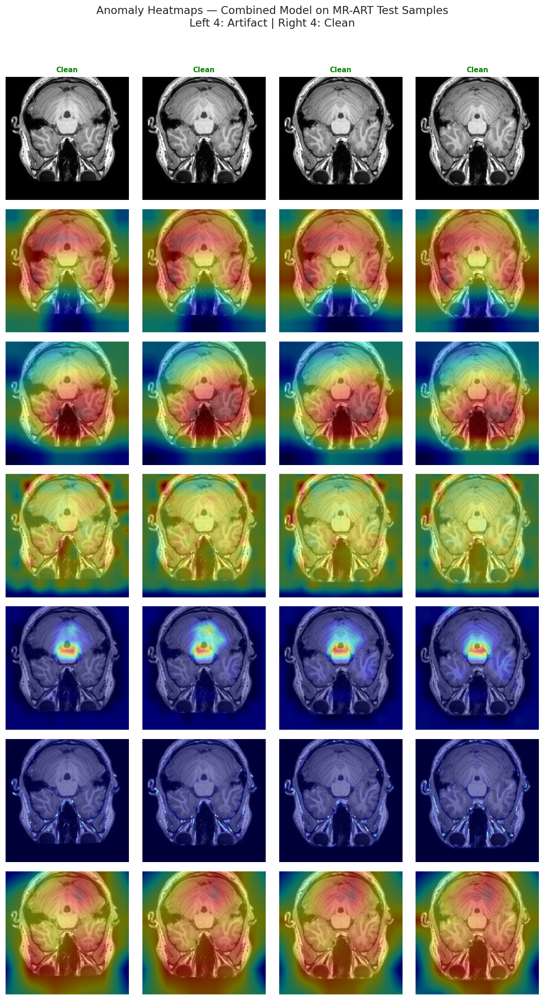

Saved: fig_heatmaps_all_methods.png
Saved: heatmap_data.npz


In [43]:
# ══════════════════════════════════════════════════════════════
# 25c. Visualize Anomaly Heatmaps — Main Figure
# Rows: methods, Columns: sample images (artifact first, then clean)
# ══════════════════════════════════════════════════════════════

method_names = list(heatmaps.keys())
n_methods = len(method_names)

# Figure: (n_methods + 1) rows (input + 6 methods) × n_samples columns
fig, axes = plt.subplots(n_methods + 1, n_samples, figsize=(2.5 * n_samples, 2.5 * (n_methods + 1)))
fig.suptitle("Anomaly Heatmaps — Combined Model on MR-ART Test Samples\n"
             "Left 4: Artifact | Right 4: Clean",
             fontsize=14, y=1.02)

# Row 0: Input images
for j in range(n_samples):
    img_np = sample_imgs[j, 0].cpu().numpy()
    axes[0][j].imshow(img_np, cmap='gray', vmin=0, vmax=1)
    label = "Artifact" if sample_labels[j] == 1 else "Clean"
    axes[0][j].set_title(f"{label}", fontsize=9,
                         color='red' if sample_labels[j]==1 else 'green', fontweight='bold')
    axes[0][j].axis('off')
axes[0][0].set_ylabel("Input", fontsize=10, fontweight='bold', rotation=0, labelpad=50, va='center')

# Method rows: heatmap overlay
for row, method_name in enumerate(method_names, 1):
    maps = heatmaps[method_name]
    for j in range(n_samples):
        img_np = sample_imgs[j, 0].cpu().numpy()
        hmap = maps[j]
        blended = overlay_heatmap(img_np, hmap, alpha=0.45, cmap='jet')
        axes[row][j].imshow(blended)
        axes[row][j].axis('off')
    axes[row][0].set_ylabel(method_name, fontsize=9, fontweight='bold',
                            rotation=0, labelpad=60, va='center')

fig.tight_layout()
fig.savefig("fig_heatmaps_all_methods.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: fig_heatmaps_all_methods.png")

# Also save individual heatmaps as raw arrays for the paper
np.savez("heatmap_data.npz",
         sample_images=sample_imgs.cpu().numpy(),
         sample_labels=sample_labels.numpy(),
         **{k.replace('\n', '_'): np.array(v) for k, v in heatmaps.items()})
print("Saved: heatmap_data.npz")

Generating heatmaps for KMAR (knee) test set...
  [kmar_heatmap] 9841 slices | clean=2960 | artifact=6881
  [1/6] Supervised...
  [2/6] SimCLR...
  [3/6] MAE...
  [4/6] DINO...
  [5/6] DAE...
  [6/6] PatchCore...


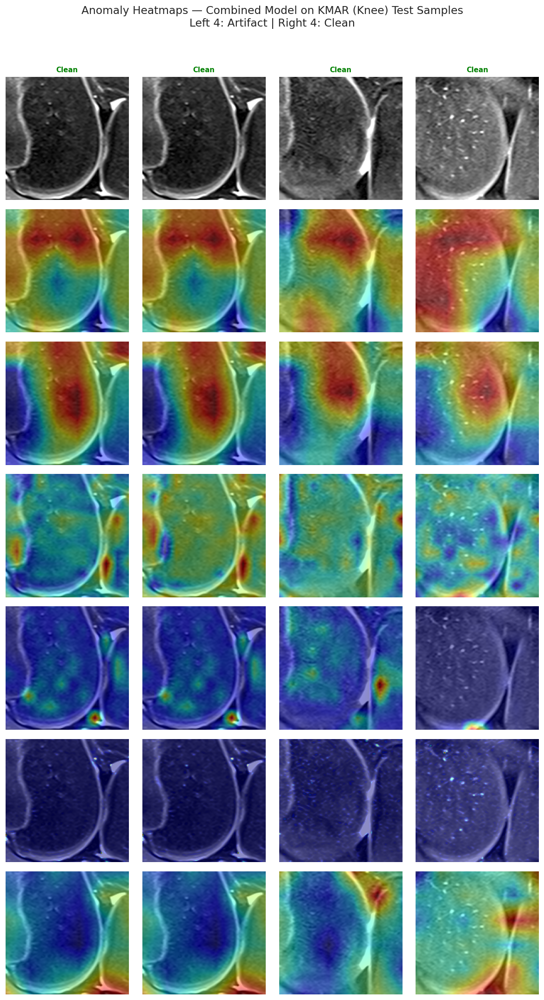

Saved: fig_heatmaps_kmar.png


In [44]:
# ══════════════════════════════════════════════════════════════
# 25d. Heatmaps on KMAR Test Set (Knee Artifacts)
# Same 6 methods, different anatomy
# ══════════════════════════════════════════════════════════════

print("Generating heatmaps for KMAR (knee) test set...")
kmar_loader = DataLoader(
    ManifestDataset(test_data["kmar"]["paths"], test_data["kmar"]["labels"],
                    transform=CenterCropTransform(IMG_SIZE), name="kmar_heatmap"),
    batch_size=64, shuffle=False, num_workers=0
)
all_imgs_k, all_labels_k = [], []
for imgs, labels in kmar_loader:
    all_imgs_k.append(imgs)
    all_labels_k.append(labels)
    if len(torch.cat(all_labels_k)) >= 200:
        break
all_imgs_k = torch.cat(all_imgs_k)
all_labels_k = torch.cat(all_labels_k)

artifact_idx_k = torch.where(all_labels_k == 1)[0][:4]
clean_idx_k = torch.where(all_labels_k == 0)[0][:4]
sample_idx_k = torch.cat([artifact_idx_k, clean_idx_k])
sample_imgs_k = all_imgs_k[sample_idx_k].to(device)
sample_labels_k = all_labels_k[sample_idx_k]

heatmaps_kmar = {}

# Load each model and generate heatmaps
print("  [1/6] Supervised...")
m = load_supervised("combined")
heatmaps_kmar["Supervised\n(Grad-CAM)"] = [gradcam_resnet(m, sample_imgs_k[i:i+1]) for i in range(len(sample_idx_k))]
del m; clear_gpu()

print("  [2/6] SimCLR...")
m = load_simclr("combined")
heatmaps_kmar["SimCLR\n(Grad-CAM)"] = [gradcam_resnet(m, sample_imgs_k[i:i+1]) for i in range(len(sample_idx_k))]
del m; clear_gpu()

print("  [3/6] MAE...")
m = load_mae("combined")
heatmaps_kmar["MAE\n(Recon Error)"] = [mae_patch_error_map(m, sample_imgs_k[i:i+1], 5) for i in range(len(sample_idx_k))]
del m; clear_gpu()

print("  [4/6] DINO...")
m = load_dino("combined")
heatmaps_kmar["DINO\n(Attention)"] = [dino_attention_map(m, sample_imgs_k[i:i+1]) for i in range(len(sample_idx_k))]
del m; clear_gpu()

print("  [5/6] DAE...")
m = load_dae("combined")
heatmaps_kmar["DAE\n(Recon Error)"] = [dae_pixel_error_map(m, sample_imgs_k[i:i+1], 5) for i in range(len(sample_idx_k))]
del m; clear_gpu()

print("  [6/6] PatchCore...")
ext, mem = load_patchcore("combined")
heatmaps_kmar["PatchCore\n(NN Distance)"] = [patchcore_spatial_map(ext, sample_imgs_k[i:i+1], mem) for i in range(len(sample_idx_k))]
del ext, mem; clear_gpu()

# Plot KMAR heatmaps
n_s = len(sample_idx_k)
method_names_k = list(heatmaps_kmar.keys())
fig, axes = plt.subplots(len(method_names_k) + 1, n_s, figsize=(2.5 * n_s, 2.5 * (len(method_names_k) + 1)))
fig.suptitle("Anomaly Heatmaps — Combined Model on KMAR (Knee) Test Samples\n"
             "Left 4: Artifact | Right 4: Clean", fontsize=14, y=1.02)

for j in range(n_s):
    img_np = sample_imgs_k[j, 0].cpu().numpy()
    axes[0][j].imshow(img_np, cmap='gray', vmin=0, vmax=1)
    label = "Artifact" if sample_labels_k[j] == 1 else "Clean"
    axes[0][j].set_title(f"{label}", fontsize=9,
                         color='red' if sample_labels_k[j]==1 else 'green', fontweight='bold')
    axes[0][j].axis('off')
axes[0][0].set_ylabel("Input", fontsize=10, fontweight='bold', rotation=0, labelpad=50, va='center')

for row, mname in enumerate(method_names_k, 1):
    maps = heatmaps_kmar[mname]
    for j in range(n_s):
        img_np = sample_imgs_k[j, 0].cpu().numpy()
        blended = overlay_heatmap(img_np, maps[j], alpha=0.45, cmap='jet')
        axes[row][j].imshow(blended)
        axes[row][j].axis('off')
    axes[row][0].set_ylabel(mname, fontsize=9, fontweight='bold', rotation=0, labelpad=60, va='center')

fig.tight_layout()
fig.savefig("fig_heatmaps_kmar.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: fig_heatmaps_kmar.png")

## 26. Comparative Radar Chart & Method Ranking

**Purpose**: Multi-dimensional comparison of all methods across key axes: AUROC, AUPRC, F1, cross-anatomy generalization, and computational cost. Provides a single-figure summary of strengths and weaknesses.

**Paper use**: Discussion section — "No single method dominates all axes."

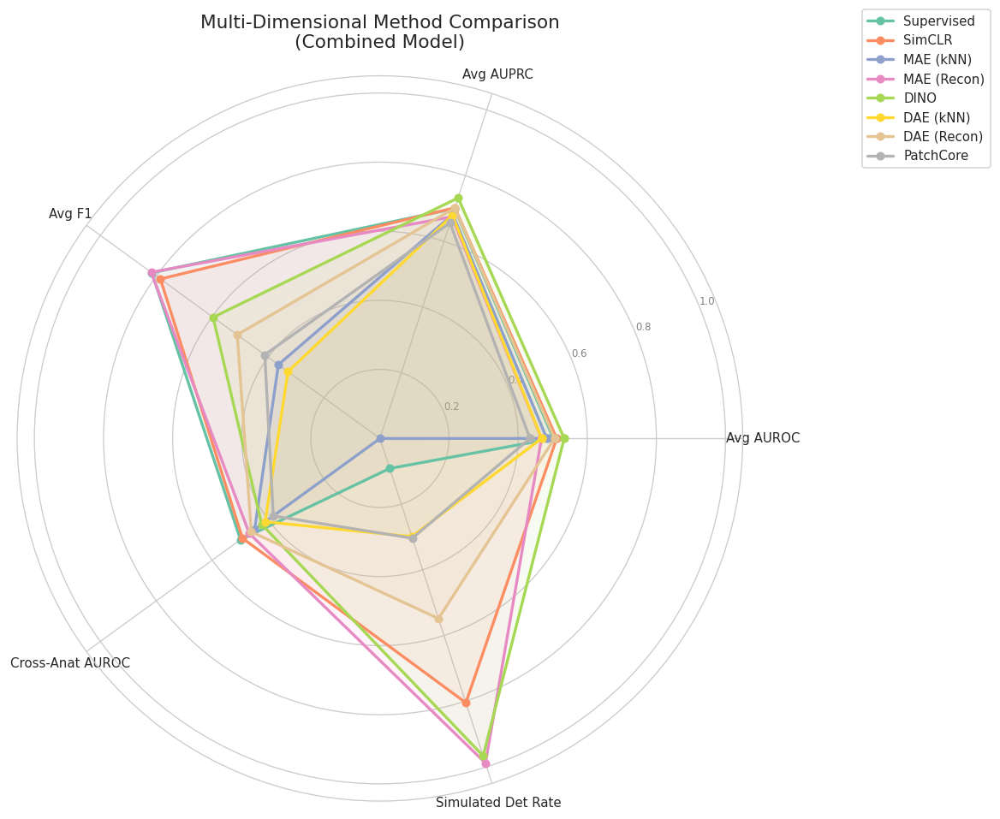

Saved: fig_radar_comparison.png

--- Method Ranking by Average AUROC ---
  1. DINO: AUROC=0.5333, AUPRC=0.7323, F1=0.597, Cross=0.4231, SimDet=0.967
  2. SimCLR: AUROC=0.5115, AUPRC=0.7023, F1=0.785, Cross=0.4917, SimDet=0.805
  3. DAE (Recon): AUROC=0.5055, AUPRC=0.7016, F1=0.511, Cross=0.4603, SimDet=0.548
  4. Supervised: AUROC=0.5019, AUPRC=0.7000, F1=0.816, Cross=0.4988, SimDet=0.091
  5. MAE (kNN): AUROC=0.4831, AUPRC=0.6821, F1=0.363, Cross=0.4483, SimDet=0.000
  6. DAE (kNN): AUROC=0.4680, AUPRC=0.6790, F1=0.329, Cross=0.4106, SimDet=0.299
  7. MAE (Recon): AUROC=0.4676, AUPRC=0.6749, F1=0.819, Cross=0.4676, SimDet=0.988
  8. PatchCore: AUROC=0.4342, AUPRC=0.6561, F1=0.412, Cross=0.3815, SimDet=0.304


In [45]:
# ══════════════════════════════════════════════════════════════
# 26. Radar Chart — Multi-dimensional Method Comparison
# Axes: Avg AUROC, Avg AUPRC, Avg F1, Cross-anatomy AUROC, Simulated Detection Rate
# Note: Only mrart & kmar have valid AUROC; simulated uses detection rate instead
# ══════════════════════════════════════════════════════════════

primary_methods = {
    "Supervised": "sup",
    "SimCLR": "simclr",
    "MAE (kNN)": "mae",
    "MAE (Recon)": "mae_recon",
    "DINO": "dino",
    "DAE (kNN)": "dae",
    "DAE (Recon)": "dae_recon",
    "PatchCore": "patchcore_patch",
}

radar_data = {}
for label, key in primary_methods.items():
    if key not in all_results or "combined" not in all_results[key]:
        continue

    # Only use two-class test sets for AUROC/AUPRC/F1
    aurocs, auprcs, f1s = [], [], []
    for tname in ["mrart", "kmar"]:
        if tname in all_results[key]["combined"]:
            m = all_results[key]["combined"][tname]["metrics"]
            if not np.isnan(m["auroc"]):
                aurocs.append(m["auroc"])
            if not np.isnan(m["auprc"]):
                auprcs.append(m["auprc"])
            if not np.isnan(m["f1"]):
                f1s.append(m["f1"])

    # Detection rate on simulated (artifact-only test set)
    sim_det = float("nan")
    if "simulated" in all_results[key]["combined"]:
        sim_det = all_results[key]["combined"]["simulated"]["metrics"].get("detection_rate", float("nan"))

    # Cross-anatomy: brain model → kmar, knee model → mrart
    cross_aurocs = []
    if key in all_results:
        if "brain" in all_results[key] and "kmar" in all_results[key]["brain"]:
            v = all_results[key]["brain"]["kmar"]["metrics"]["auroc"]
            if not np.isnan(v):
                cross_aurocs.append(v)
        if "knee" in all_results[key] and "mrart" in all_results[key]["knee"]:
            v = all_results[key]["knee"]["mrart"]["metrics"]["auroc"]
            if not np.isnan(v):
                cross_aurocs.append(v)

    if aurocs:
        radar_data[label] = {
            "Avg AUROC": np.mean(aurocs),
            "Avg AUPRC": np.mean(auprcs) if auprcs else np.nan,
            "Avg F1": np.mean(f1s) if f1s else np.nan,
            "Cross-Anat AUROC": np.mean(cross_aurocs) if cross_aurocs else np.nan,
            "Simulated Det Rate": sim_det if not np.isnan(sim_det) else 0.0,
        }

if radar_data:
    categories = list(list(radar_data.values())[0].keys())
    N = len(categories)
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10), subplot_kw=dict(polar=True))
    colors = plt.cm.Set2(np.linspace(0, 1, len(radar_data)))

    for idx, (label, values) in enumerate(radar_data.items()):
        vals = [values[cat] if not np.isnan(values[cat]) else 0.0 for cat in categories]
        vals += vals[:1]
        ax.plot(angles, vals, 'o-', linewidth=2, color=colors[idx], label=label, markersize=5)
        ax.fill(angles, vals, alpha=0.08, color=colors[idx])

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=9)
    ax.set_ylim(0, 1.05)
    ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticklabels(["0.2", "0.4", "0.6", "0.8", "1.0"], fontsize=7, color='gray')
    ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.1), fontsize=9)
    ax.set_title("Multi-Dimensional Method Comparison\n(Combined Model)", fontsize=13, pad=20)

    fig.tight_layout()
    fig.savefig("fig_radar_comparison.png", dpi=200, bbox_inches='tight')
    plt.show()
    print("Saved: fig_radar_comparison.png")

    print("\n--- Method Ranking by Average AUROC ---")
    ranked = sorted(radar_data.items(), key=lambda x: x[1]["Avg AUROC"], reverse=True)
    for rank, (label, vals) in enumerate(ranked, 1):
        cross_str = f"{vals['Cross-Anat AUROC']:.4f}" if not np.isnan(vals['Cross-Anat AUROC']) else "N/A"
        print(f"  {rank}. {label}: AUROC={vals['Avg AUROC']:.4f}, "
              f"AUPRC={vals['Avg AUPRC']:.4f}, F1={vals['Avg F1']:.3f}, "
              f"Cross={cross_str}, SimDet={vals['Simulated Det Rate']:.3f}")

## 27. Training Variant Effect — Does Multi-Anatomy Help?

**Purpose**: For each method, compare knee-only vs brain-only vs combined training on each test set. Visualized as grouped bar charts.

**Paper use**: Table/Fig — "Multi-anatomy training improves generalization for method X but not Y." Directly supports the cross-anatomy generalization narrative.

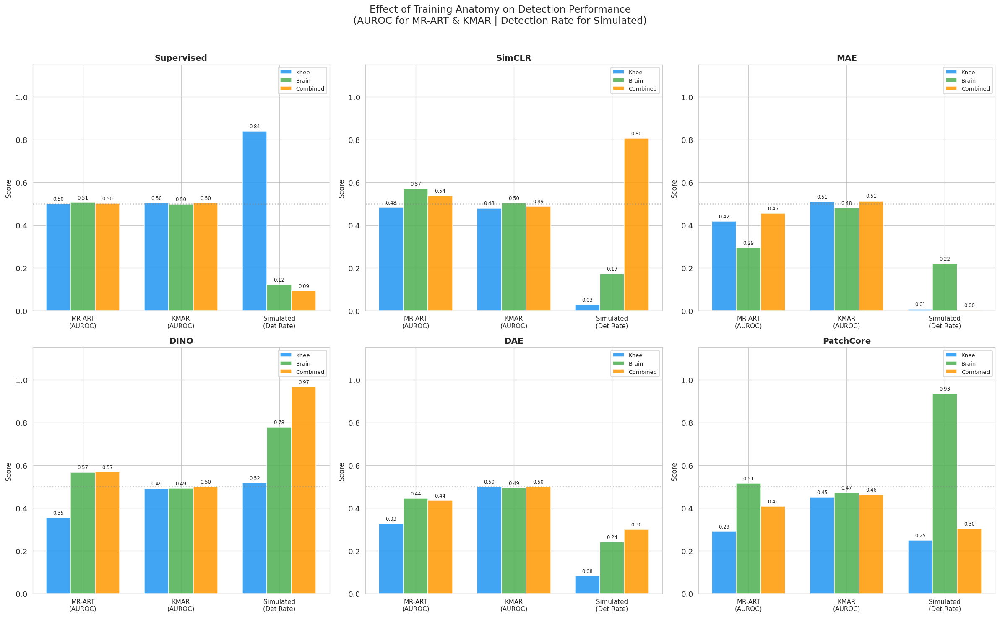

Saved: fig_variant_effect.png

--- Combined vs Best Single-Anatomy Delta ---
  Supervised on mrart: combined=0.5010, best_single=0.5054, Δ=-0.0044 ↓
  Supervised on kmar: combined=0.5029, best_single=0.5026, Δ=+0.0003 ↑
  SimCLR on mrart: combined=0.5361, best_single=0.5691, Δ=-0.0330 ↓
  SimCLR on kmar: combined=0.4870, best_single=0.5020, Δ=-0.0150 ↓
  MAE on mrart: combined=0.4544, best_single=0.4165, Δ=+0.0380 ↑
  MAE on kmar: combined=0.5117, best_single=0.5088, Δ=+0.0029 ↑
  DINO on mrart: combined=0.5677, best_single=0.5674, Δ=+0.0004 ↑
  DINO on kmar: combined=0.4988, best_single=0.4913, Δ=+0.0075 ↑
  DAE on mrart: combined=0.4357, best_single=0.4443, Δ=-0.0085 ↓
  DAE on kmar: combined=0.5003, best_single=0.4994, Δ=+0.0009 ↑
  PatchCore on mrart: combined=0.4069, best_single=0.5149, Δ=-0.1081 ↓
  PatchCore on kmar: combined=0.4615, best_single=0.4729, Δ=-0.0114 ↓


In [46]:
# ══════════════════════════════════════════════════════════════
# 27. Training Variant Effect — Grouped Bar Charts
# For each primary method: AUROC for mrart/kmar, Detection Rate for simulated
# ══════════════════════════════════════════════════════════════

bar_methods = [
    ("Supervised", "sup"), ("SimCLR", "simclr"), ("MAE", "mae"),
    ("DINO", "dino"), ("DAE", "dae"), ("PatchCore", "patchcore_patch"),
]

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle("Effect of Training Anatomy on Detection Performance\n"
             "(AUROC for MR-ART & KMAR | Detection Rate for Simulated)",
             fontsize=14, y=1.02)
axes = axes.flatten()

for idx, (mlabel, mkey) in enumerate(bar_methods):
    ax = axes[idx]
    if mkey not in all_results:
        ax.set_title(f"{mlabel} — N/A"); continue

    x = np.arange(3)  # 3 test sets
    width = 0.25
    variant_colors = {'knee': '#2196F3', 'brain': '#4CAF50', 'combined': '#FF9800'}

    for v_idx, variant in enumerate(VARIANTS):
        vals = []
        for tname in ["mrart", "kmar", "simulated"]:
            if variant in all_results[mkey] and tname in all_results[mkey][variant]:
                m = all_results[mkey][variant][tname]["metrics"]
                if tname == "simulated":
                    # Use detection rate for artifact-only test set
                    v = m.get("detection_rate", float("nan"))
                    vals.append(v if not np.isnan(v) else 0)
                else:
                    v = m["auroc"]
                    vals.append(v if not np.isnan(v) else 0)
            else:
                vals.append(0)
        bars = ax.bar(x + v_idx * width, vals, width, label=variant.capitalize(),
                      color=variant_colors[variant], alpha=0.85)
        for bar, val in zip(bars, vals):
            if val > 0:
                ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
                        f'{val:.2f}', ha='center', va='bottom', fontsize=7)

    ax.set_xticks(x + width)
    ax.set_xticklabels(["MR-ART\n(AUROC)", "KMAR\n(AUROC)", "Simulated\n(Det Rate)"], fontsize=9)
    ax.set_ylabel("Score", fontsize=10)
    ax.set_ylim(0, 1.15)
    ax.set_title(mlabel, fontsize=12, fontweight='bold')
    ax.legend(fontsize=8)
    ax.axhline(y=0.5, color='gray', linestyle=':', alpha=0.5)

fig.tight_layout()
fig.savefig("fig_variant_effect.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: fig_variant_effect.png")

# Summary: combined vs single-anatomy delta
print("\n--- Combined vs Best Single-Anatomy Delta ---")
for mlabel, mkey in bar_methods:
    if mkey not in all_results:
        continue
    for tname in ["mrart", "kmar"]:
        single_aurocs = []
        for v in ["knee", "brain"]:
            if v in all_results[mkey] and tname in all_results[mkey][v]:
                val = all_results[mkey][v][tname]["metrics"]["auroc"]
                if not np.isnan(val):
                    single_aurocs.append(val)
        combined_auroc = 0
        if "combined" in all_results[mkey] and tname in all_results[mkey]["combined"]:
            combined_auroc = all_results[mkey]["combined"][tname]["metrics"]["auroc"]
            if np.isnan(combined_auroc):
                combined_auroc = 0
        if single_aurocs:
            best_single = max(single_aurocs)
            delta = combined_auroc - best_single
            direction = "↑" if delta > 0 else "↓"
            print(f"  {mlabel} on {tname}: combined={combined_auroc:.4f}, "
                  f"best_single={best_single:.4f}, Δ={delta:+.4f} {direction}")

## 28. Method Strengths & Weaknesses Summary Table

**Purpose**: Auto-generate a discussion-ready summary identifying each method's key strength and limitation based on the quantitative results. Directly usable in the paper's discussion section.

In [47]:
# ══════════════════════════════════════════════════════════════
# 28. Auto-generated Strengths & Weaknesses Summary
# Uses AUROC from two-class sets + detection rate from simulated
# ══════════════════════════════════════════════════════════════

summary_methods = {
    "Supervised": "sup", "SimCLR": "simclr", "MAE (kNN)": "mae",
    "MAE (Recon)": "mae_recon", "DINO": "dino", "DAE (kNN)": "dae",
    "DAE (Recon)": "dae_recon", "PatchCore (Patch)": "patchcore_patch",
}

print("="*80)
print("  METHOD STRENGTHS & WEAKNESSES (auto-generated from results)")
print("="*80)

summary_rows = []
for label, key in summary_methods.items():
    if key not in all_results or "combined" not in all_results[key]:
        continue

    # Collect valid AUROC values (two-class test sets only)
    aurocs = {}
    for tname in ["mrart", "kmar"]:
        if tname in all_results[key]["combined"]:
            v = all_results[key]["combined"][tname]["metrics"]["auroc"]
            if not np.isnan(v):
                aurocs[tname] = v

    # Simulated detection rate
    sim_det = float("nan")
    if "simulated" in all_results[key]["combined"]:
        sim_det = all_results[key]["combined"]["simulated"]["metrics"].get("detection_rate", float("nan"))

    if not aurocs:
        continue

    avg_auroc = np.mean(list(aurocs.values()))
    best_test = max(aurocs, key=aurocs.get)
    worst_test = min(aurocs, key=aurocs.get)
    spread = max(aurocs.values()) - min(aurocs.values())

    # Cross-anatomy generalization
    cross_score = np.nan
    cross_vals = []
    if key in all_results:
        if "brain" in all_results[key] and "kmar" in all_results[key]["brain"]:
            v = all_results[key]["brain"]["kmar"]["metrics"]["auroc"]
            if not np.isnan(v):
                cross_vals.append(v)
        if "knee" in all_results[key] and "mrart" in all_results[key]["knee"]:
            v = all_results[key]["knee"]["mrart"]["metrics"]["auroc"]
            if not np.isnan(v):
                cross_vals.append(v)
    if cross_vals:
        cross_score = np.mean(cross_vals)

    # Auto-detect strengths
    strengths = []
    if avg_auroc > 0.85:
        strengths.append("Strong overall detection")
    if spread < 0.1:
        strengths.append("Consistent across real test sets")
    if not np.isnan(cross_score) and cross_score > 0.75:
        strengths.append("Good cross-anatomy transfer")
    if not np.isnan(sim_det) and sim_det > 0.8:
        strengths.append(f"High simulated detection rate ({sim_det:.2f})")

    # Auto-detect weaknesses
    weaknesses = []
    if avg_auroc < 0.65:
        weaknesses.append("Weak overall performance")
    if spread > 0.3:
        weaknesses.append(f"Inconsistent (best={best_test}, worst={worst_test})")
    if not np.isnan(cross_score) and cross_score < 0.6:
        weaknesses.append("Poor cross-anatomy transfer")
    if not np.isnan(sim_det) and sim_det < 0.5:
        weaknesses.append(f"Low simulated detection rate ({sim_det:.2f})")

    if not strengths:
        strengths.append("Moderate performance")
    if not weaknesses:
        weaknesses.append("No major weakness detected")

    sim_det_str = f"{sim_det:.3f}" if not np.isnan(sim_det) else "N/A"
    cross_str = f"{cross_score:.4f}" if not np.isnan(cross_score) else "N/A"

    summary_rows.append({
        "Method": label,
        "Avg AUROC": avg_auroc,
        "Best Test": f"{best_test} ({aurocs[best_test]:.3f})",
        "Worst Test": f"{worst_test} ({aurocs[worst_test]:.3f})",
        "Cross-Anat": cross_score,
        "Sim Det Rate": sim_det,
        "Strength": "; ".join(strengths),
        "Weakness": "; ".join(weaknesses),
    })

    print(f"\n  {label}:")
    print(f"    Avg AUROC (mrart+kmar): {avg_auroc:.4f}")
    print(f"    Best: {best_test} ({aurocs[best_test]:.4f})")
    print(f"    Worst: {worst_test} ({aurocs[worst_test]:.4f})")
    print(f"    Cross-anatomy: {cross_str}")
    print(f"    Simulated detection rate: {sim_det_str}")
    print(f"    ✅ Strengths: {'; '.join(strengths)}")
    print(f"    ⚠️ Weaknesses: {'; '.join(weaknesses)}")

if summary_rows:
    df_summary = pd.DataFrame(summary_rows)
    df_summary.to_csv("table_method_summary.csv", index=False)
    print("\nSaved: table_method_summary.csv")
    print("\n" + df_summary[["Method", "Avg AUROC", "Best Test", "Worst Test", "Sim Det Rate", "Strength"]].to_string(
        index=False, float_format="{:.4f}".format, na_rep="—"))

  METHOD STRENGTHS & WEAKNESSES (auto-generated from results)

  Supervised:
    Avg AUROC (mrart+kmar): 0.5019
    Best: kmar (0.5029)
    Worst: mrart (0.5010)
    Cross-anatomy: 0.4988
    Simulated detection rate: 0.091
    ✅ Strengths: Consistent across real test sets
    ⚠️ Weaknesses: Weak overall performance; Poor cross-anatomy transfer; Low simulated detection rate (0.09)

  SimCLR:
    Avg AUROC (mrart+kmar): 0.5115
    Best: mrart (0.5361)
    Worst: kmar (0.4870)
    Cross-anatomy: 0.4917
    Simulated detection rate: 0.805
    ✅ Strengths: Consistent across real test sets; High simulated detection rate (0.80)
    ⚠️ Weaknesses: Weak overall performance; Poor cross-anatomy transfer

  MAE (kNN):
    Avg AUROC (mrart+kmar): 0.4831
    Best: kmar (0.5117)
    Worst: mrart (0.4544)
    Cross-anatomy: 0.4483
    Simulated detection rate: 0.000
    ✅ Strengths: Consistent across real test sets
    ⚠️ Weaknesses: Weak overall performance; Poor cross-anatomy transfer; Low simulate

## 29. Save All Results

In [48]:
# Save complete results dictionary
import pickle

# Strip numpy arrays for compact saving (keep metrics only)
results_compact = {}
for method_key in all_results:
    results_compact[method_key] = {}
    for variant in all_results[method_key]:
        results_compact[method_key][variant] = {}
        for test_name in all_results[method_key][variant]:
            results_compact[method_key][variant][test_name] = {
                "metrics": all_results[method_key][variant][test_name]["metrics"]
            }

with open("evaluation_results.pkl", "wb") as f:
    pickle.dump(results_compact, f)

print("Saved: evaluation_results.pkl")
print("\nAll CSV files saved:")
for f in sorted([f for f in os.listdir(".") if f.endswith(".csv")]):
    print(f"  {f}")
print("\nAll PNG files saved:")
for f in sorted([f for f in os.listdir(".") if f.endswith(".png")]):
    print(f"  {f}")
print("\nAll NPZ files saved:")
for f in sorted([f for f in os.listdir(".") if f.endswith(".npz")]):
    print(f"  {f}")

total_elapsed = time.time() - total_start
print(f"\nTotal evaluation time: {total_elapsed/60:.1f} min ({total_elapsed/3600:.2f}h)")
print("DONE!")

# ── Summary of all outputs ──
print("\n" + "="*70)
print("  OUTPUT MANIFEST")
print("="*70)
outputs = {
    "Tables (CSV)": [
        "table6_overall_results.csv — Main quantitative results",
        "table_domain_shift.csv — Cross-anatomy generalization",
        "table_training_val_auroc.csv — Training-time validation metrics",
        "table_feature_collapse.csv — Feature collapse indicators",
        "table_method_summary.csv — Strengths & weaknesses",
    ],
    "Figures (PNG)": [
        "fig5_within_anatomy.png — Within-anatomy AUROC bar chart",
        "fig6_cross_anatomy.png — Cross-anatomy heatmap",
        "fig7_multi_anatomy_heatmap.png — Multi-anatomy training effect",
        "fig_score_distributions_all.png — Score distributions (all methods × test sets)",
        "fig_tsne_all_methods.png — t-SNE features (all SSL methods)",
        "fig_collapse_detection.png — Feature collapse indicators",
        "fig_heatmaps_all_methods.png — Anomaly heatmaps (MR-ART)",
        "fig_heatmaps_kmar.png — Anomaly heatmaps (KMAR)",
        "fig_radar_comparison.png — Radar chart comparison",
        "fig_variant_effect.png — Training variant effect",
        "roc_curves_all_methods.png — ROC curves",
        "pr_curves_all_methods.png — PR curves",
        "confusion_matrices.png — Confusion matrices",
        "mae_reconstruction_viz.png — MAE reconstruction visualization",
        "dae_reconstruction_viz.png — DAE reconstruction visualization",
    ],
    "Data": [
        "evaluation_results.pkl — Complete results dictionary",
        "heatmap_data.npz — Raw heatmap arrays for paper figures",
    ],
}
for category, files in outputs.items():
    print(f"\n  {category}:")
    for f in files:
        print(f"    • {f}")

Saved: evaluation_results.pkl

All CSV files saved:
  table10_severity.csv
  table6_overall_results.csv
  table7_cross_anatomy.csv
  table8_multi_anatomy.csv
  table9_synthetic_by_type.csv
  table_domain_shift_diagnostic.csv
  table_feature_collapse.csv
  table_method_summary.csv

All PNG files saved:
  confusion_matrices.png
  dae_reconstruction_viz.png
  fig5_within_anatomy.png
  fig6_cross_anatomy.png
  fig7_multi_anatomy_heatmap.png
  fig8_synthetic_by_type.png
  fig9_severity.png
  fig_collapse_detection.png
  fig_domain_shift_diagnostic.png
  fig_heatmaps_all_methods.png
  fig_heatmaps_kmar.png
  fig_radar_comparison.png
  fig_score_distributions_all.png
  fig_tsne_all_methods.png
  fig_variant_effect.png
  mae_reconstruction_viz.png
  pr_curves_all_methods.png
  roc_curves_all_methods.png
  score_distributions.png
  tsne_features.png

All NPZ files saved:
  heatmap_data.npz

Total evaluation time: 132.7 min (2.21h)
DONE!

  OUTPUT MANIFEST

  Tables (CSV):
    • table6_overall_r